Created By: Tanisha Shrotriya

## Task 2 : UCL Pipeline + Integration Testing + Experiments

In [1]:
# # !nvidia-smi
%pip install numpy
%pip install matplotlib
%pip install glob
%pip install os 
%pip install sklearn
%pip install -U scikit-learn scipy matplotlib scikit-image
%pip install opencv-python
%pip install kmeanstf
%pip install keract
%pip install -U scikit-learn scipy matplotlib
%pip install opencv-python
%pip install kmeanstf
%pip install pandas

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
ERROR: Could not find a version that satisfies the requirement glob (from versions: none)
ERROR: No matching distribution found for glob
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
ERROR: Could not find a version that satisfies the requirement os (from versions: none)
ERROR: No matching distribution found for os
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import image as matplotlib_image
import glob
import os
import cv2
from tensorflow.keras.layers import Flatten, Dense, Input, Lambda, Conv2D, MaxPooling2D
from tensorflow.keras.applications.resnet_v2 import ResNet50V2, preprocess_input
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator, img_to_array
import tensorflow as tf
import numpy as np
from glob import glob
import os
from tensorflow.keras.models import Sequential
from sklearn.cluster import KMeans
from sklearn import datasets
from sklearn.utils import shuffle
import re
import cv2
from sklearn.cluster import KMeans
from keras.models import Model
from numpy.linalg import norm

2022-12-20 05:57:57.035307: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-20 05:57:59.865270: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /panfs/jay/groups/6/csci8523/shrot007/.local/lib/python3.7/site-packages/cv2/../../lib64:/panfs/roc/msisoft/cuda/10.0/lib64
2022-12-20 05:57:59.865332: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-12-20 05:58:10.434383: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:6


## Data Pre-processing 
### 1. Extract data into numpy arrays called - frac_map and time_series

- Each fraction map is of shape (1,64,64) and time series is of shape (442,1)
- There are 26754 data in total in fraction map and time series

In [2]:
# Data Pre-processing 

fracmaps_dir = '../data/frac_map'
frac_maps = os.listdir(fracmaps_dir)
timeseries_dir = '../data/time_series'
time_series = os.listdir(timeseries_dir)

total_maps = len(frac_maps) # 26754
total_ts = len(time_series) # 26754
print("total_maps len is ", total_maps, "total_ts len is ", total_ts)

# read fraction map and time series into img arrays
for i in range(0, total_maps):
    fm = frac_maps[i]
    frac_maps[i] = np.load(os.path.join(fracmaps_dir, fm), allow_pickle=True)
    ts = time_series[i]
    time_series[i] = np.load(os.path.join(timeseries_dir, ts), allow_pickle=True)
    

print(frac_maps[0].shape) ## (1,64,64)
print(time_series[0].shape) ## (442, 1)


# 2. Read all the river fraction maps in the fm_rivers and river time series in the ts_rivers array

ID_labels = '../label_info/all_IDs_labels.npy'
ID_labels = np.load(ID_labels, allow_pickle=True)

# extract river from fraction maps and time series maps
river_ids = np.where(ID_labels==3)[0]
print(river_ids.shape) # 317
fm_rivers = []
ts_rivers = []
pre = 'ID_'
fm_post = '_frac_map.npy'
ts_post = '_time_series.npy'

for sid in river_ids:
    fm_name = pre + str(sid) + fm_post
    ts_name = pre + str(sid) + ts_post
    fm_path = os.path.join(fracmaps_dir, fm_name)
    ts_path = os.path.join(timeseries_dir, ts_name)
    fm_rivers.append(np.load(fm_path, allow_pickle=True))
    ts_rivers.append(np.load(ts_path, allow_pickle=True))

fm_rivers = np.array(fm_rivers)
ts_rivers = np.array(ts_rivers)
print(fm_rivers.shape) # should be 317
print(ts_rivers.shape) # should be 317

# Reshape input dataset as required by resnet50v2

from skimage.transform import resize
im = np.reshape(fm_rivers,(317,64,64,1))
im = resize(im, (317,64,64,3))
im.shape
X_train =im

total_maps len is  26754 total_ts len is  26754
(1, 64, 64)
(442, 1)
(317,)
(317, 1, 64, 64)
(317, 442, 1)


## Helper Functions

In [7]:
def visualize(data, data_size, cols, title, fx, fy, folder = 'default',file='default', save = 'False', dtype='graph'):
    os.makedirs(folder, exist_ok=True)
    if data_size > 0:
        rows = (data_size//cols) + 1
        fig, axes = plt.subplots(rows,cols, figsize=(fx,fy))
        fig.suptitle(title,y=1.0,fontsize=20,ha='center')
        ax = axes.ravel()
        for i in range(0,data_size):
            if dtype == 'image':
                ax[i].imshow(data[i])
            else:
                ax[i].plot(data[i])
        
        if dtype == 'image':
            for a in ax:
                     a.set_axis_off()

        if save == 'True' : 
            path = folder+file
            plt.gray()
            plt.savefig(path)
            
        plt.subplots_adjust(wspace=0.1, hspace=0.1)
        plt.tight_layout()
        plt.show()   


In [8]:
def save_files(data,folder,image):
    os.makedirs(folder, exist_ok=True)
    for i in range(0, len(data)):
        img_name = folder + str(i) + ".jpeg"
        image.imsave(img_name, data[i])


In [9]:
def select_model(classes,activation_func):
    # Extract features of remote sensing imagery of water bodies and 
    # non-water bodies using a pre-trained deep learning architecture.
    resnet = ResNet50V2(include_top=False, pooling='avg', weights='imagenet',input_shape = (64,64,3),classes = classes)

    # ResNet model doesn't contain the flattened fully connected layers, so we add them separately.
    print(resnet.layers[-1].output)

    # ResNet model doesn't contain the flattened fully connected layers, so we add them separately.
    ucl_model = Sequential()
    ucl_model.add(resnet)
    ucl_model.add(Flatten())
    ucl_model.add(Dense(128, activation='relu'))
    ucl_model.add(Dense(classes, activation=activation_func))
    # freeze resnet50 conv layers and keep only new layers for fine-tuning. 
    ucl_model.layers[0].trainable = False
    print(ucl_model.summary())
    print(ucl_model.layers[-1],"\n",ucl_model.layers[-1].activation)
    return {'ucl_model':ucl_model}   

## UCL Class 

In [13]:
class UnsupervisedCurriculumLearning():
    
    
    def __init__(self, ucl_model, plt, clusters, selection_threshold, train_epochs):
        self.ucl_model = ucl_model
        self.clusters = clusters
        self.selection_threshold = selection_threshold
        self.train_epochs = train_epochs   

    def step1(self):
        ucl_classes = self.ucl_model.predict(X_train)
        # classification results for binary classification of rivers, using imagenet weights
        # print("Classes predicted by UCL Model are : ", str(ucl_classes[:10]))
        return {'predicted_classes':ucl_classes}

    def step2(self, plt, save_in, save = 'False'):
        # Step 2:
        # Create two clusters on the extracted features of remote sensing imagery, assigning 
        # them pseudo-labels of 'static rivers' and 'may meander rivers'

        # Kmeans
        # The images are classified into clusters based on similarity of pixel values. 
        # Each image is assigned a cluster label value given by kmeans.labels_. 
        # So kmeans.labels_ is an array of length 26754 as there are 26754 images in the training set.
        # The input to kmeans comes from the following layer which have imagenet weights after step 1.

        print("Layer type: ", self.ucl_model.layers[-3])
        print("Layer details: ",self.ucl_model.layers[-3].output)

        # Create a new model to extract the features from ucl_model. This is the actual input to kmeans.

        model_features= Model(inputs=self.ucl_model.inputs, outputs=self.ucl_model.layers[-3].output)
        features = model_features.predict(X_train)  
        print(features.shape[0]) #317
        print(features[0])
        
        if(save == 'True'):
            visualize(features,9,3,'Feature Visualization',*(20,20),save_in,'Feature_Visualization.jpeg',save)

        # Initialize the class object
        kmeans = KMeans(n_clusters=self.clusters)

        # Fit kmeans to the labels of clusters.
        kmeans = kmeans.fit(features)

        # print("All Kmeans labels: ", kmeans.labels_)
        print("Kmeans cluster centers: ", kmeans.cluster_centers_)

        # Filter rows of original data
        tot_clusters = self.clusters
        for i in range(0,tot_clusters) : 
            print("Total number of rivers in cluster",i,": ",features[kmeans.labels_==i].shape) 
            name = 'Features in Cluster '+str(i)
            # Name of image file -
            file = str(i)+'_Cluster_Features.jpeg'
            if(save == 'True'):
                visualize(features[kmeans.labels_==i][:9],9,3,name,*(20,20),save_in,file,save)   

        return {'cluster_centers':kmeans.cluster_centers_,'features':features,'kmeans_labels':kmeans.labels_}

    def step3(self, centers, features, kmeans_labels, plot_shape, save_in, save='False'):
        # Step 3 : 
        # From each cluster, select the reliable images using the UCL based selection operation. 
        # Select all features that are at a distance λ from the centroid of the cluster. 
        # The parameter λ is a constant value 
        # that can be adjusted according to the requirement. We have used λ = 0.85 after empirical evaluations.  
        # The closest feature vector to the centroid is considered as a centroid feature vector. 
        # We calculate the similarity between a specific feature vector fi belonging to a cluster k 
        # and the centroid feature vector fk using the inner product. 
        # If the calculated similarity is greater than the λ, the sample of the considered feature vector 
        # is declared as a reliable sample and the cluster label is considered as the pseudo sample label 
        # for the next training cycle.  
        # The number of extracted reliable samples vary at every iteration of fine tuning. 

        # Calculate cosine similarity 

        import random
        feature_centers = []
        tot_clusters = self.clusters
        
        for cluster in range(0,tot_clusters):
            label_i = features[kmeans_labels == cluster]
            dot_product = np.dot(centers[cluster],label_i.T) #(1,2048).(2048,len(labels))
            normalize_product = norm(centers[cluster])*norm(label_i,axis=1)
            center_i = dot_product/normalize_product
            print("Similarity to centroid ",cluster ,":  ",center_i[0:3])
            feature_centers.append(center_i) #feature_centers shape = (1, clusters)

        # printing the size of all clusters after selecting using threshold.
        for cluster in range(0,tot_clusters):
            # get selected features
            training_class_i = np.asarray(np.where(feature_centers[cluster] >= self.selection_threshold)).shape
            print("Total features selected for centroid",cluster,": ",training_class_i)

        # Below is probably the most complicated cell in this entire notebook.
        x_train = []
        y_label = []

        for center in range(0,tot_clusters):        
            # get the indices of the feature maps from first center, selected using the threshold . 
            selected_class_index = np.asarray(np.where(feature_centers[center] >= self.selection_threshold))[0,:]
            # get the indices of the images belonging to the first center
            label_index = np.asarray(np.where(kmeans_labels == center))[0,:]

            #print("Indices belonging to cluster ",center,": ",label_index)
            #print("Indices selected for fine-tuning: ", selected_class_index)
            #print("Indices of the images to be sent to model: ", label_index[selected_class_index])

            # get the images
            rivers = X_train[list(label_index[selected_class_index])]
            title = "Rivers in cluster "+str(center)
            # name image for storing intermediate results
            file = str(center)+"_Cluster_Rivers.jpeg"
            x_train = x_train + list(rivers)
            y_label = y_label + [center]*len(rivers)
            
            if(save == 'True'):
                if(10 < rivers.shape[0]):
                    images = np.asarray(random.sample(list(rivers),10))
                    visualize(images[:9,:,:,1],9,3,title,*plot_shape,save_in, file,save,'image')

                else : 
                    visualize(rivers[:,:,:,1],rivers.shape[0],3,title,*plot_shape,save_in, file,save,'image')

        # Create the dataset
        x_train = np.array(x_train)
        y_label = np.array(y_label)
        print("Training images : ",x_train.shape)
        print("Labels :", y_label.shape)
        
        return {'x_train':x_train,'y_label':y_label}

    def step4(self, x_train, y_label):
        # Step 4 : 
        # Fine-tune the deep learning module on reliable samples using pseudo labels given by the clusters. 
        
        # convert to one hot vectors
        y_label = tf.keras.utils.to_categorical(y_label, num_classes=self.clusters)
        #print(y_label)
        train = ImageDataGenerator()
        training = train.flow(x_train,y_label,batch_size = 20)
        print(training)

        if self.clusters == 2:
            metrics = [tf.keras.metrics.BinaryCrossentropy(),tf.keras.metrics.BinaryAccuracy()]
            print('Loss used: binary_crossentropy, Optimizer used: adam')
            print('Metrics Chosen: ',metrics)
            self.ucl_model.compile(loss="binary_crossentropy",optimizer="adam",metrics=metrics)
        else:
            metrics = [tf.keras.metrics.CategoricalCrossentropy(),tf.keras.metrics.CategoricalAccuracy()]
            print('Loss used: categorical_crossentropy, Optimizer used: adam')
            self.ucl_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=metrics)
            
        history = self.ucl_model.fit(training,
                        epochs = self.train_epochs,
                        steps_per_epoch=len(training))

        return ucl_model
    
    def run_ucl(self, plt,plot_shape,folder,save):
        kmeans_results = self.step2(plt,folder,save)
        centers = kmeans_results['cluster_centers']
        features = kmeans_results['features']
        kmeans_labels = kmeans_results['kmeans_labels']
        selected_images = self.step3(centers, features, kmeans_labels,plot_shape,folder,save)
        ucl_model = self.step4(selected_images['x_train'], selected_images['y_label'])
        return {'model':ucl_model, 'x_train':selected_images['x_train'],'y_label':selected_images['y_label'],'centers':centers}

In [15]:
import tensorflow.keras.models as model
def ucl_experiments(ucl_model, plt, clusters, threshold, epochs,tot_iterations): 
    exp = UnsupervisedCurriculumLearning(ucl_model, plt, clusters, threshold, epochs)
    # folder path to save results.
    results = '../data/UCL_Results_2/'+experiment+"/"
    plot_shape =(15,15)

    # converge when centers converge, or when iterations hit 10.
    past_center = np.array([np.array([0]*2048)]*clusters)
    curr_center = np.array([np.array([1]*2048)]*clusters)
    iterations = 0
    while((curr_center == past_center).all() or iterations < tot_iterations):
        past_center = curr_center
        if(iterations == (tot_iterations - 1)):
            data = exp.run_ucl(plt,plot_shape,results, 'True')
        else : 
            data = exp.run_ucl(plt,plot_shape,results, 'False')
        curr_center = data['centers']
        iterations = iterations + 1
        print("Iteration is: ",iterations)
 
    rivers = data['x_train']
    clusters = data['y_label']
    
    # need to unit test the function below -
    for cluster in range(0,len(np.unique(clusters))):
        output = '../data/UCL_Results_2/'+experiment+"/cluster_"+str(cluster)+"/"
        save_files(rivers[clusters == cluster], output, matplotlib_image)
    
    # save model
    path = results + 'model'
    data['model'].save(path)
    # read model
    mode = model.load_model(path)

# Experiments - 317 images

Experiments for all known rivers - 317 images (KR_317)

The multi-class experiments will have bad error because the model needs to be multi-class.
This experiment will not be used for the final report due on 12/21, but will be improved for AAG.

Model	Clustering	Threshold	Cluster Size	Epoch Size(Fill With Optimal Epoch Size )	Convergence Strategy

EXP1: ResNet50V2	KMeans	0.7	K = 2 		UCL approach applied to Binary Classification

EXP2: ResNet50V2	KMeans	0.7	K = 3		UCL approach applied to Multi-class classification

EXP3: ResNet50V2	KMeans	0.7	K = 4		UCL approach applied to Multi-class classification

EXP4: ResNet50V2	KMeans	0.7	K = 5		UCL approach applied to Multi-class classification

EXP5: ResNet50V2	KMeans	0.8	K = 2 		UCL approach applied to Binary Classification

EXP6: ResNet50V2	KMeans	0.8	K = 3 		UCL approach applied to Multi-class classification

EXP7: ResNet50V2	KMeans	0.8	K = 4 		UCL approach applied to Multi-class classification

EXP8: ResNet50V2	KMeans	0.8	K = 5 		UCL approach applied to Multi-class classification

tf.keras.metrics.MeanIoU(num_classes=1) -> can be used if we switch to autoencoders.

KerasTensor(type_spec=TensorSpec(shape=(None, 2048), dtype=tf.float32, name=None), name='avg_pool/Mean:0', description="created by layer 'avg_pool'")
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_2 (Flatten)         (None, 2048)              0         
                                                                 
 dense_4 (Dense)             (None, 128)               262272    
                                                                 
 dense_5 (Dense)             (None, 2)                 258       
                                                                 
Total params: 23,827,330
Trainable params: 262,530
Non-trainable params: 23,564,800
_________________________________________________________________
None
 <function so

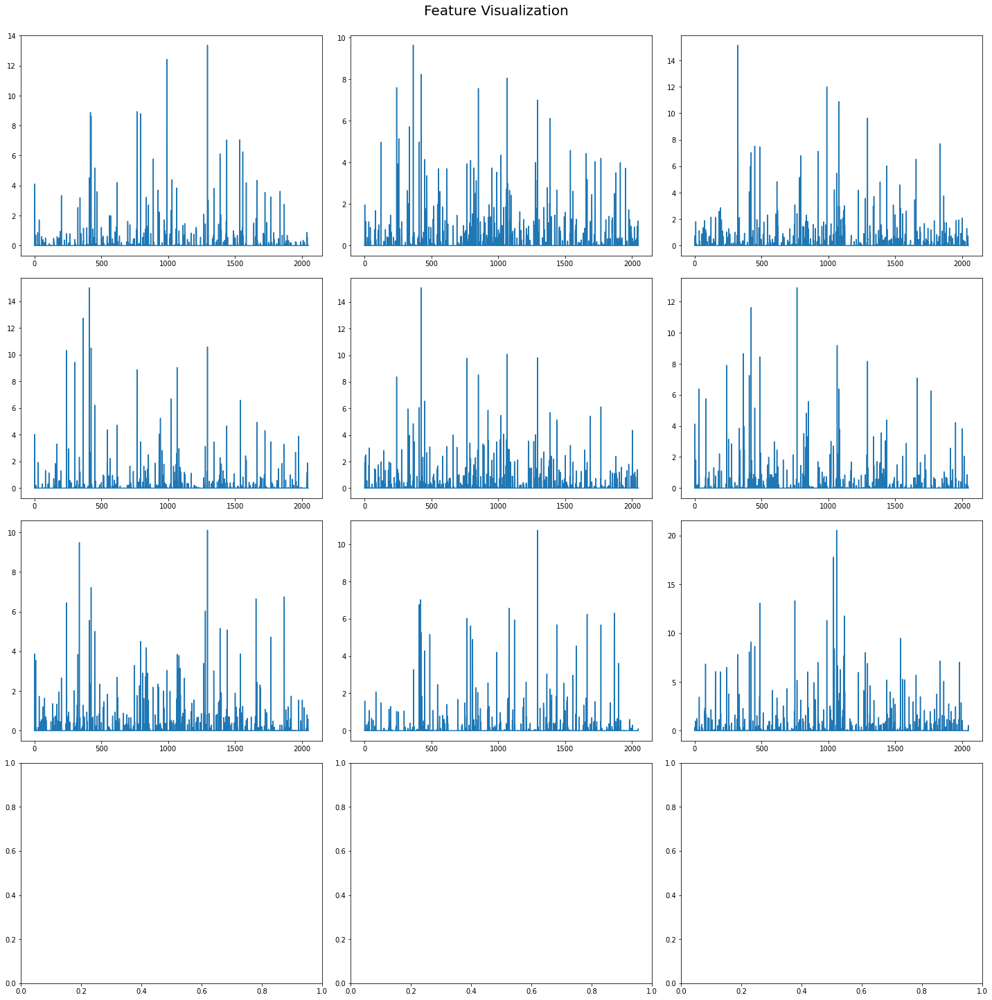

Kmeans cluster centers:  [[3.5495490e-02 7.0562363e-02 1.5272963e+00 ... 0.0000000e+00
  2.1787184e-01 5.4779458e-01]
 [5.8289617e-04 3.1711832e-02 2.3750672e+00 ... 0.0000000e+00
  1.3064593e-02 7.3591784e-02]]
Total number of rivers in cluster 0 :  (89, 2048)


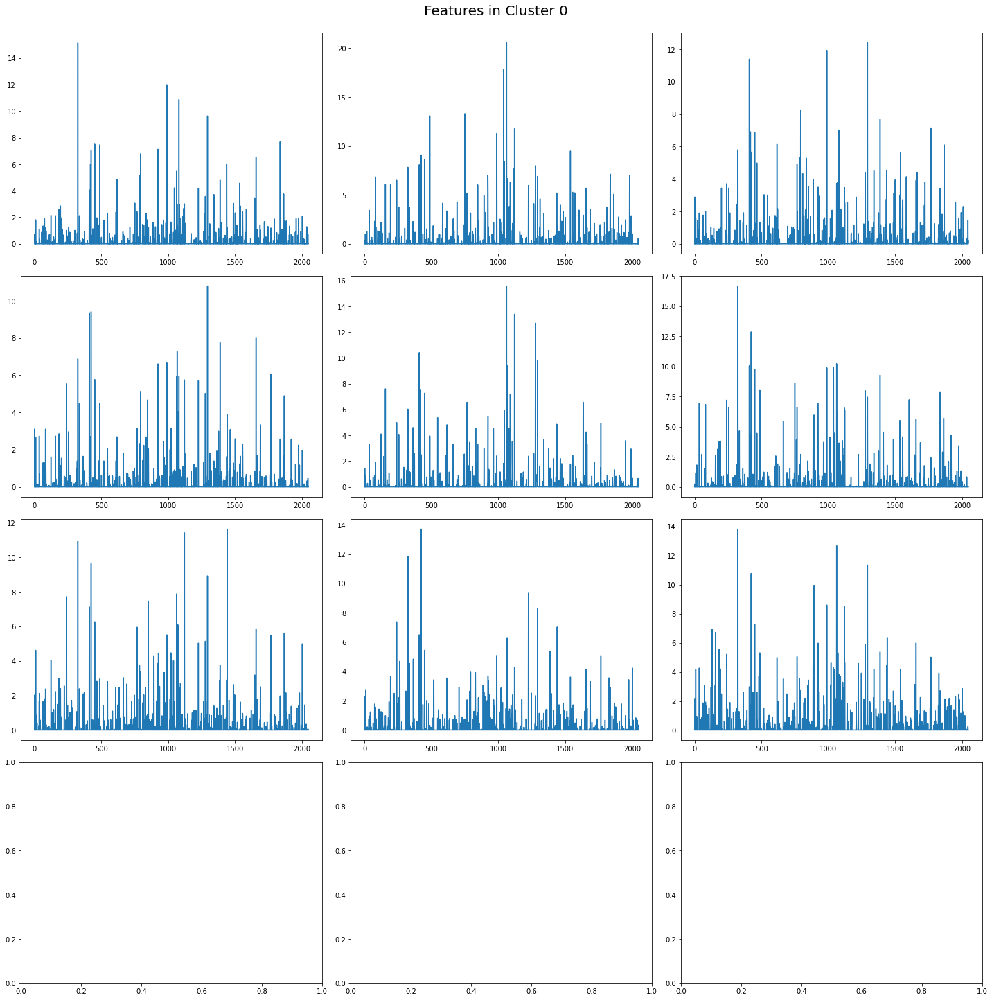

Total number of rivers in cluster 1 :  (228, 2048)


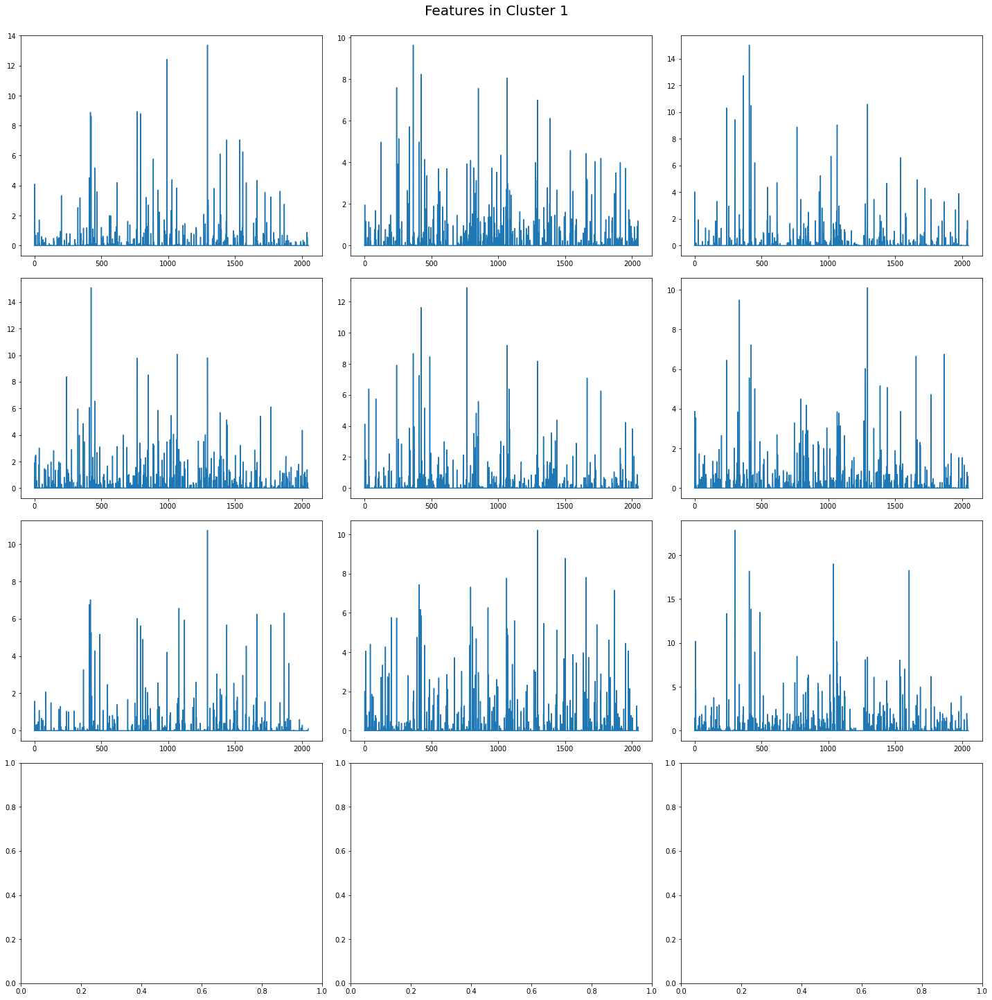

Similarity to centroid  0 :   [0.8272183  0.80039835 0.8014546 ]
Similarity to centroid  1 :   [0.6973561 0.8283762 0.8446409]
Total features selected for centroid 0 :  (1, 87)
Total features selected for centroid 1 :  (1, 184)


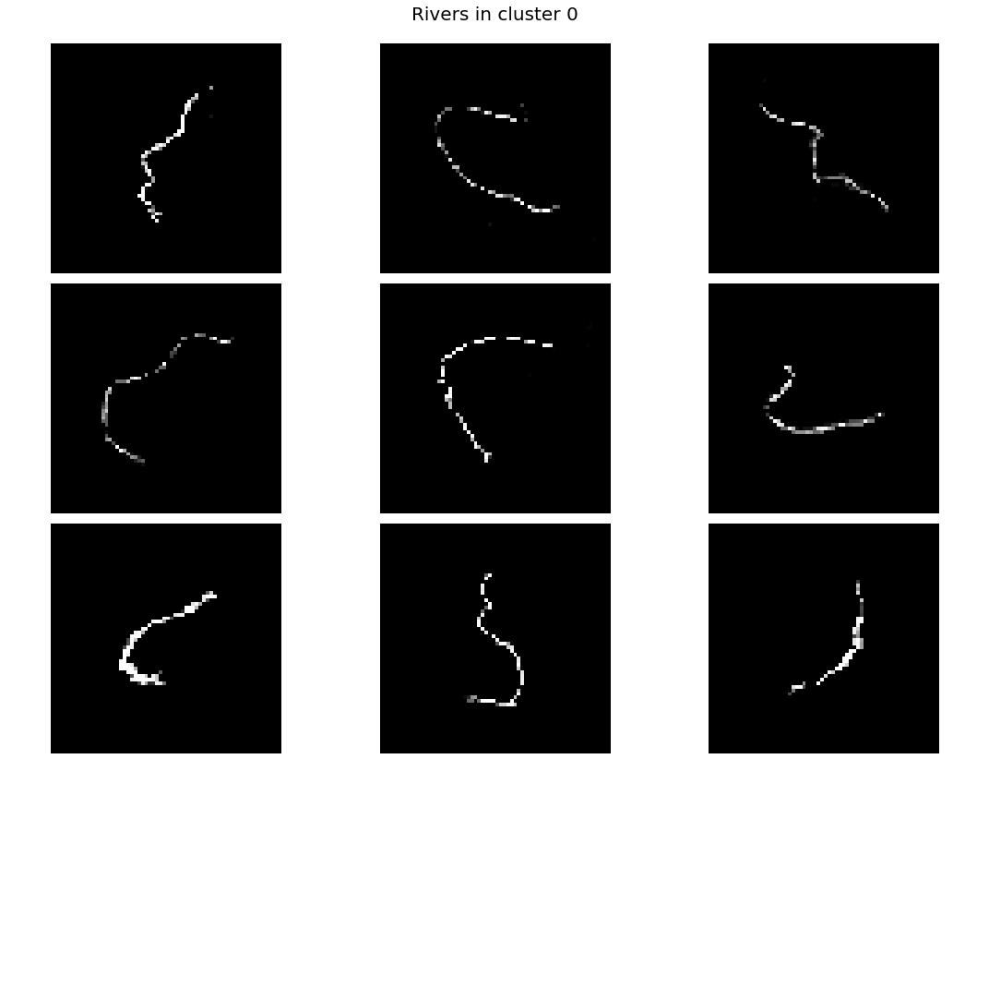

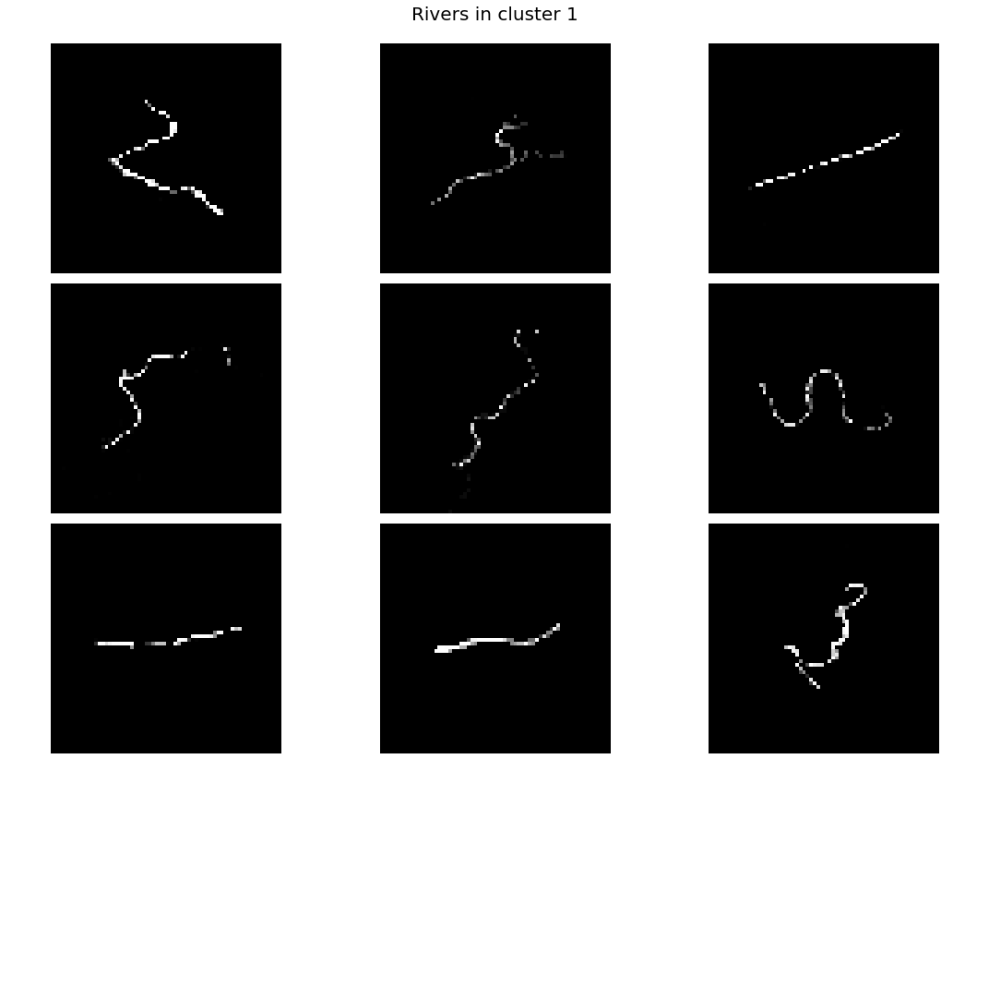

Training images :  (271, 64, 64, 3)
Labels : (271,)
Loss used: binary_crossentropy, Optimizer used: adam
Metrics Chosen:  [<keras.metrics.metrics.BinaryCrossentropy object at 0x7fb931f20ad0>, <keras.metrics.metrics.BinaryAccuracy object at 0x7fb931f29f90>]
Epoch 1/5
14/14 [==============================] - 4s 96ms/step - loss: 0.0876 - binary_crossentropy: 0.0876 - binary_accuracy: 0.9815
Epoch 2/5
14/14 [==============================] - 1s 95ms/step - loss: 0.0229 - binary_crossentropy: 0.0229 - binary_accuracy: 0.9889
Epoch 3/5
14/14 [==============================] - 1s 88ms/step - loss: 0.0122 - binary_crossentropy: 0.0122 - binary_accuracy: 1.0000
Epoch 4/5
14/14 [==============================] - 1s 89ms/step - loss: 0.0059 - binary_crossentropy: 0.0059 - binary_accuracy: 1.0000
Epoch 5/5
14/14 [==============================] - 1s 88ms/step - loss: 0.0047 - binary_crossentropy: 0.0047 - binary_accuracy: 1.0000
Iteration is:  3


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP1_KR_317_UCL_70_2/model/assets


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP1_KR_317_UCL_70_2/model/assets


In [16]:
experiment = 'EXP1_KR_317_UCL_70_2' 
threshold = 0.7
clusters = 2
epochs = 5
ucl_iterations = 3
classes = clusters 
ucl_model = select_model(classes,'softmax')['ucl_model']
ucl_experiments(ucl_model, plt, clusters, threshold, epochs,ucl_iterations)

KerasTensor(type_spec=TensorSpec(shape=(None, 2048), dtype=tf.float32, name=None), name='avg_pool/Mean:0', description="created by layer 'avg_pool'")
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_3 (Flatten)         (None, 2048)              0         
                                                                 
 dense_6 (Dense)             (None, 128)               262272    
                                                                 
 dense_7 (Dense)             (None, 3)                 387       
                                                                 
Total params: 23,827,459
Trainable params: 262,659
Non-trainable params: 23,564,800
_________________________________________________________________
None
 <function so

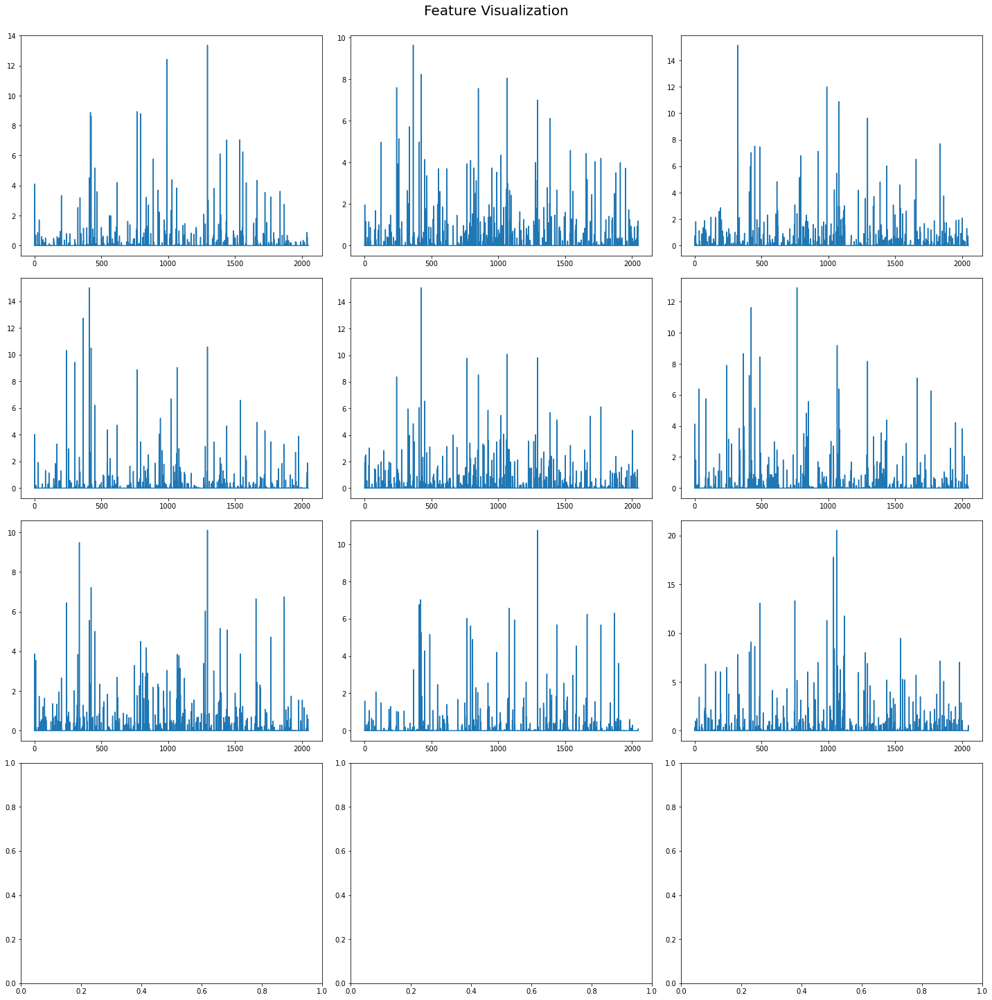

Kmeans cluster centers:  [[5.2651655e-02 1.0466747e-01 1.3939996e+00 ... 0.0000000e+00
  2.6324356e-01 6.8800759e-01]
 [1.1393633e-03 1.7832929e-02 1.5890338e+00 ... 0.0000000e+00
  7.4406266e-02 1.4372745e-01]
 [2.8875191e-04 3.1913966e-02 2.5753264e+00 ... 0.0000000e+00
  7.6631382e-03 7.6250032e-02]]
Total number of rivers in cluster 0 :  (60, 2048)


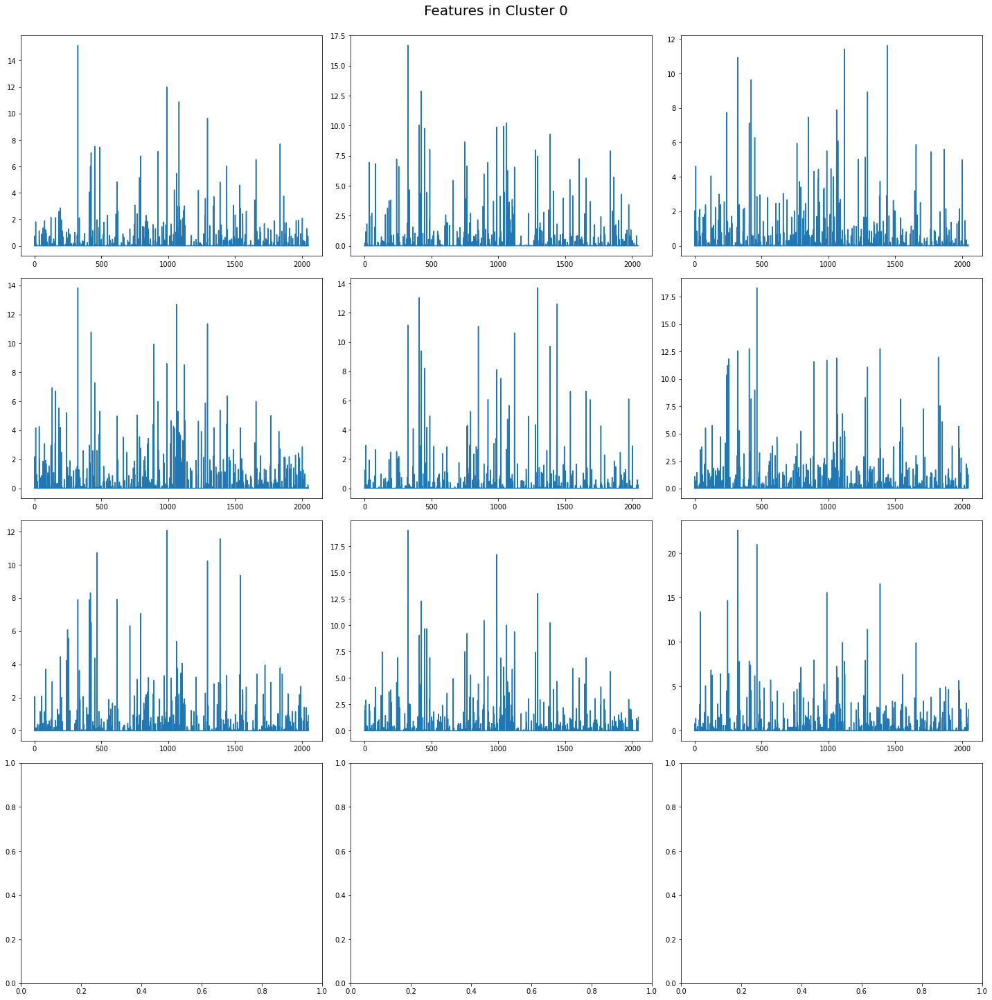

Total number of rivers in cluster 1 :  (69, 2048)


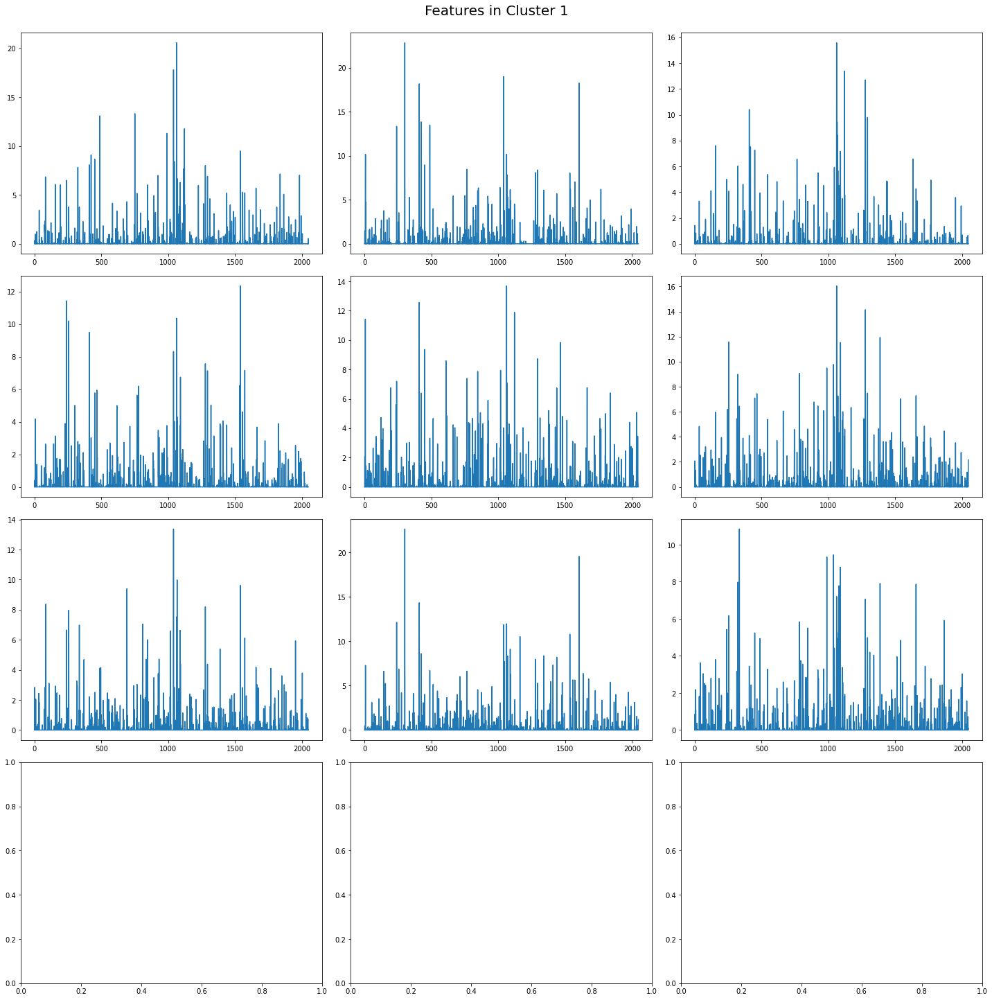

Total number of rivers in cluster 2 :  (188, 2048)


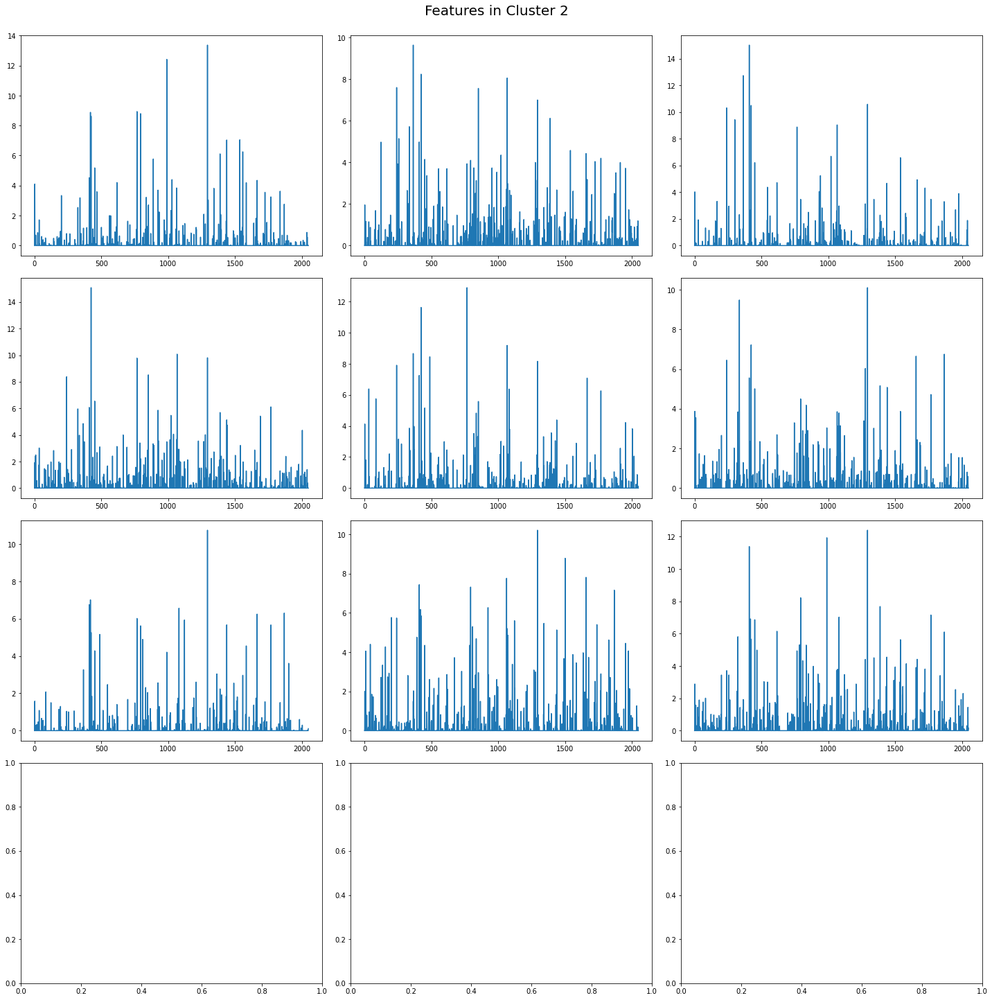

Similarity to centroid  0 :   [0.8255636 0.8799387 0.8227773]
Similarity to centroid  1 :   [0.80989474 0.7738207  0.7509065 ]
Similarity to centroid  2 :   [0.74511683 0.82402164 0.8589061 ]
Total features selected for centroid 0 :  (1, 60)
Total features selected for centroid 1 :  (1, 64)
Total features selected for centroid 2 :  (1, 167)


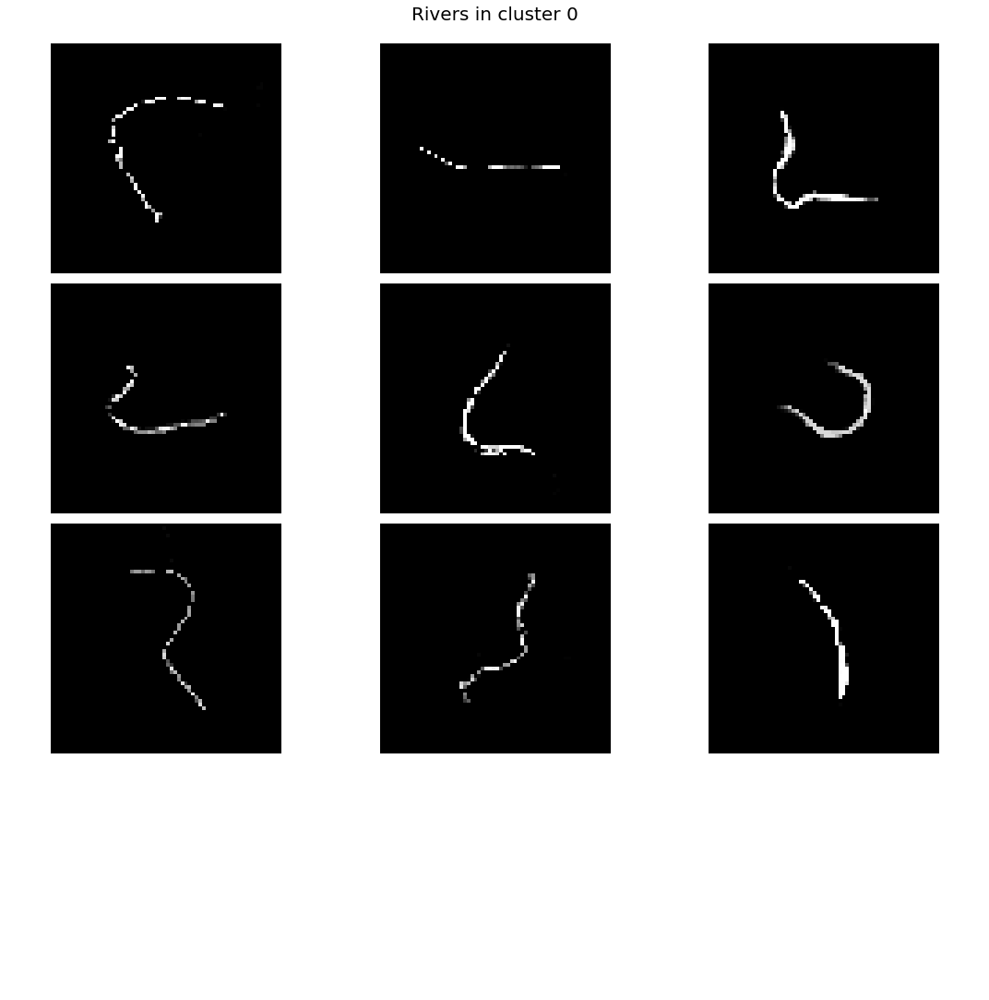

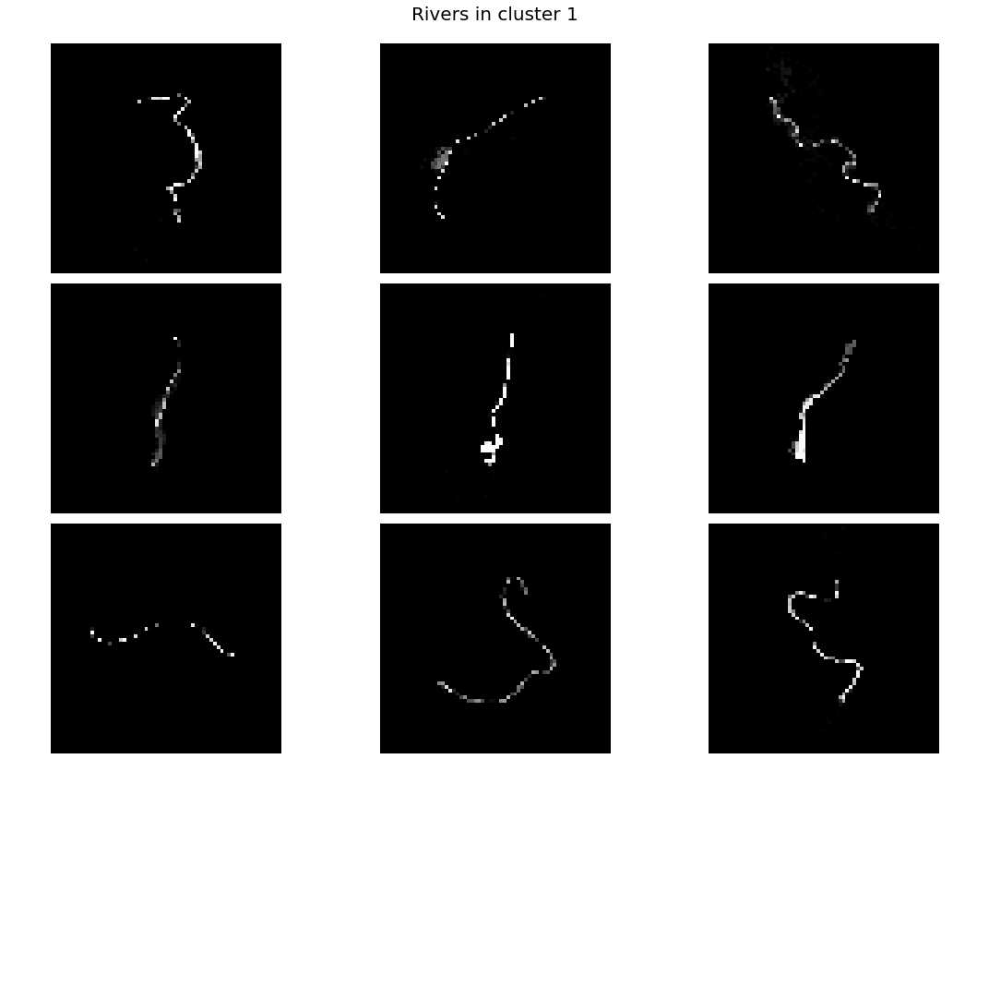

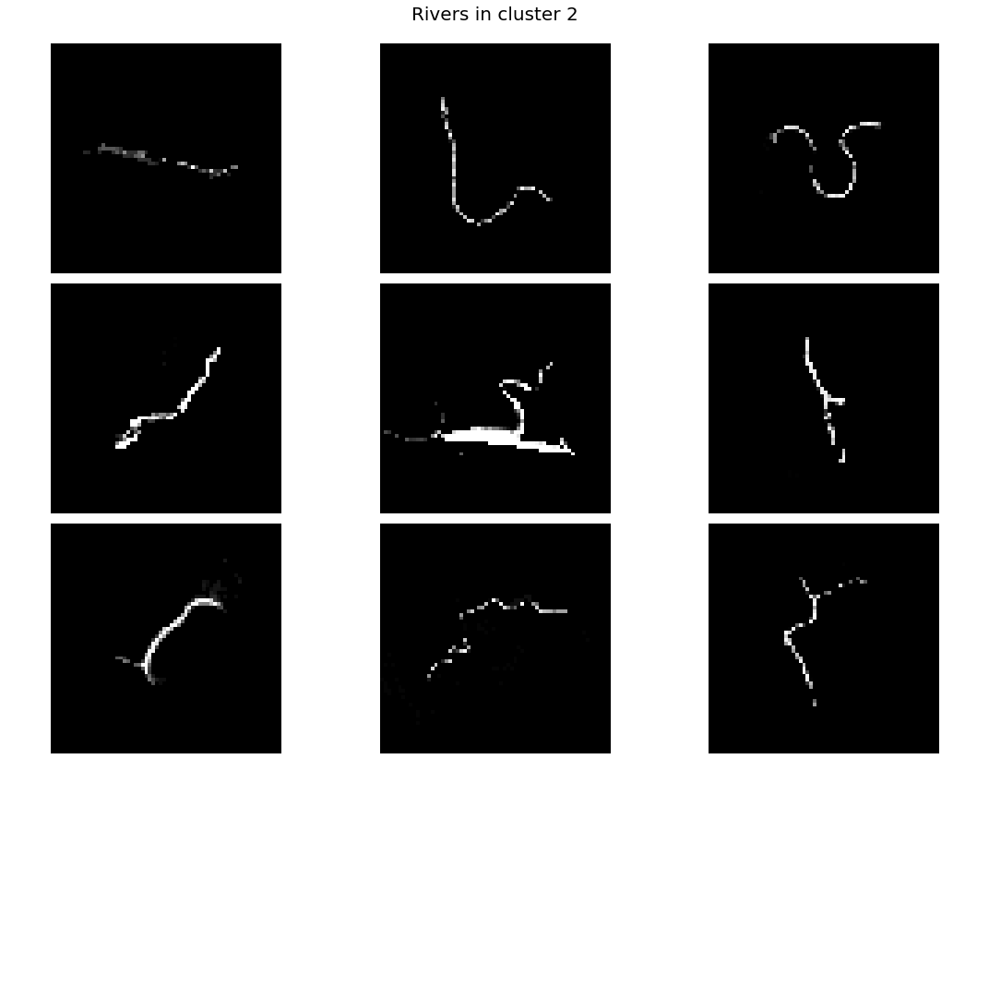

Training images :  (291, 64, 64, 3)
Labels : (291,)
Loss used: categorical_crossentropy, Optimizer used: adam
Epoch 1/5
15/15 [==============================] - 4s 103ms/step - loss: 3.5644 - categorical_crossentropy: 3.5644 - categorical_accuracy: 0.2784
Epoch 2/5
15/15 [==============================] - 1s 93ms/step - loss: 1.2189 - categorical_crossentropy: 1.2189 - categorical_accuracy: 0.5876
Epoch 3/5
15/15 [==============================] - 1s 88ms/step - loss: 0.4775 - categorical_crossentropy: 0.4775 - categorical_accuracy: 0.8179
Epoch 4/5
15/15 [==============================] - 1s 88ms/step - loss: 0.2482 - categorical_crossentropy: 0.2482 - categorical_accuracy: 0.9381
Epoch 5/5
15/15 [==============================] - 1s 89ms/step - loss: 0.1775 - categorical_crossentropy: 0.1775 - categorical_accuracy: 0.9519
Iteration is:  5


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP2_KR_317_UCL_70_3/model/assets


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP2_KR_317_UCL_70_3/model/assets


In [17]:
experiment = 'EXP2_KR_317_UCL_70_3'
threshold = 0.7
clusters = 3
epochs = 5
classes = clusters
ucl_model = select_model(classes,'softmax')['ucl_model']

tot_iterations = 5 
ucl_experiments(ucl_model, plt, clusters, threshold, epochs,tot_iterations)

KerasTensor(type_spec=TensorSpec(shape=(None, 2048), dtype=tf.float32, name=None), name='avg_pool/Mean:0', description="created by layer 'avg_pool'")
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_4 (Flatten)         (None, 2048)              0         
                                                                 
 dense_8 (Dense)             (None, 128)               262272    
                                                                 
 dense_9 (Dense)             (None, 4)                 516       
                                                                 
Total params: 23,827,588
Trainable params: 262,788
Non-trainable params: 23,564,800
_________________________________________________________________
None
 <function so

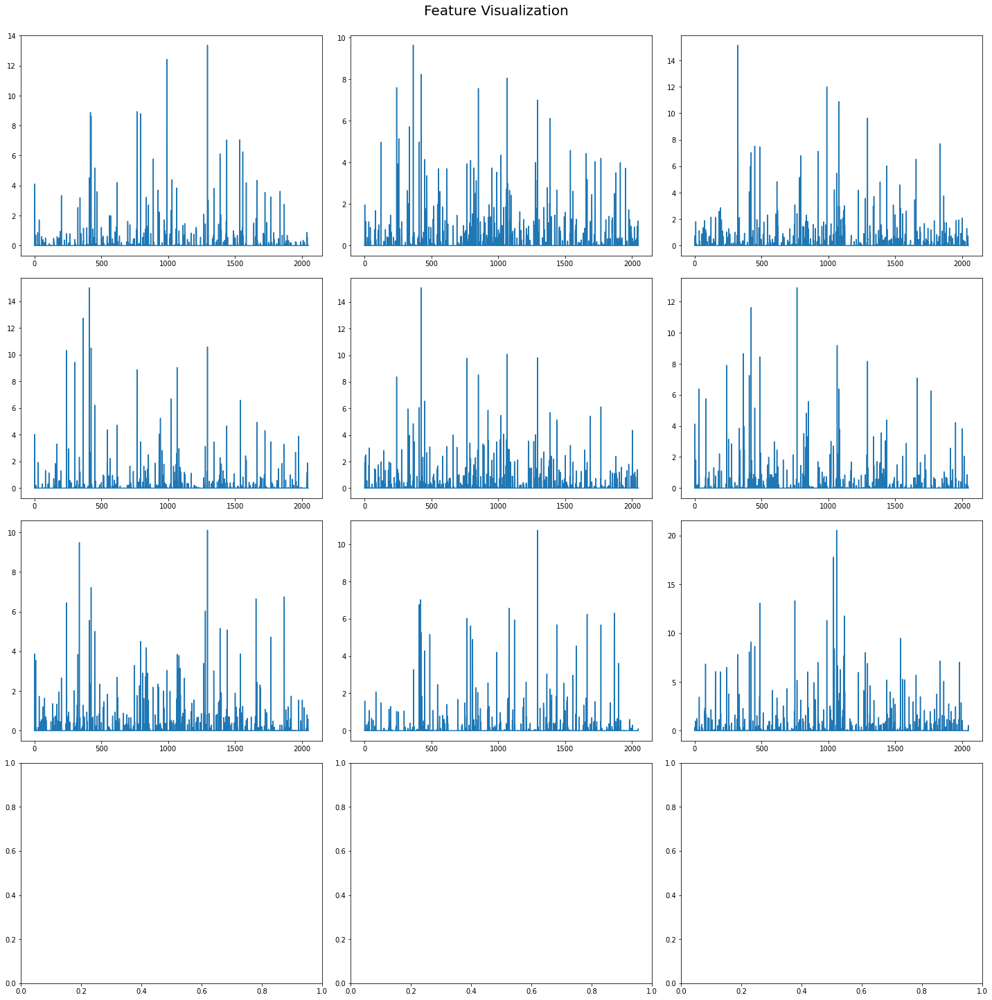

Kmeans cluster centers:  [[4.56633605e-03 1.35342360e-01 2.31954932e+00 ... 0.00000000e+00
  1.49011612e-08 1.81828514e-01]
 [3.31014395e-04 1.28649846e-02 2.54788733e+00 ... 0.00000000e+00
  8.78452137e-03 6.37029260e-02]
 [5.46153374e-02 1.04867995e-01 1.37085891e+00 ... 0.00000000e+00
  2.87174791e-01 7.32386649e-01]
 [1.22837536e-03 1.61109902e-02 1.64576936e+00 ... 0.00000000e+00
  8.02192539e-02 1.34718001e-01]]
Total number of rivers in cluster 0 :  (34, 2048)


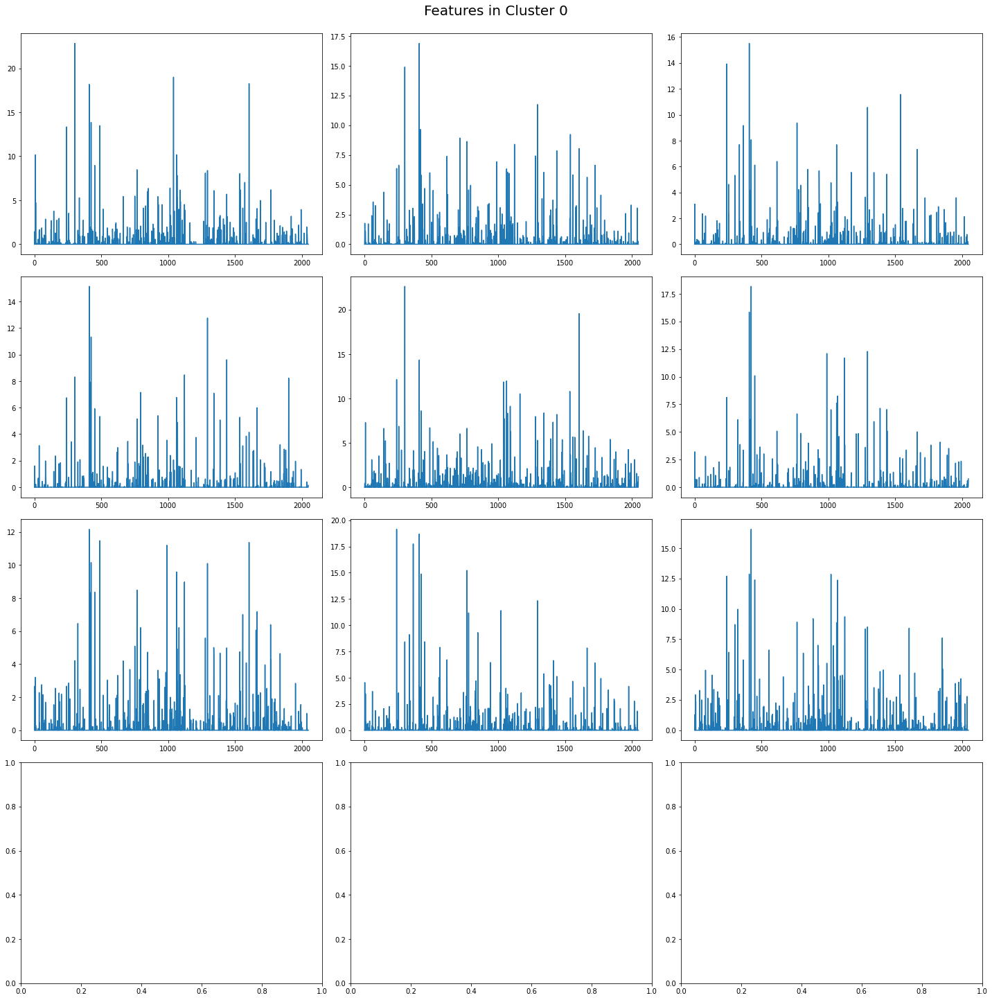

Total number of rivers in cluster 1 :  (164, 2048)


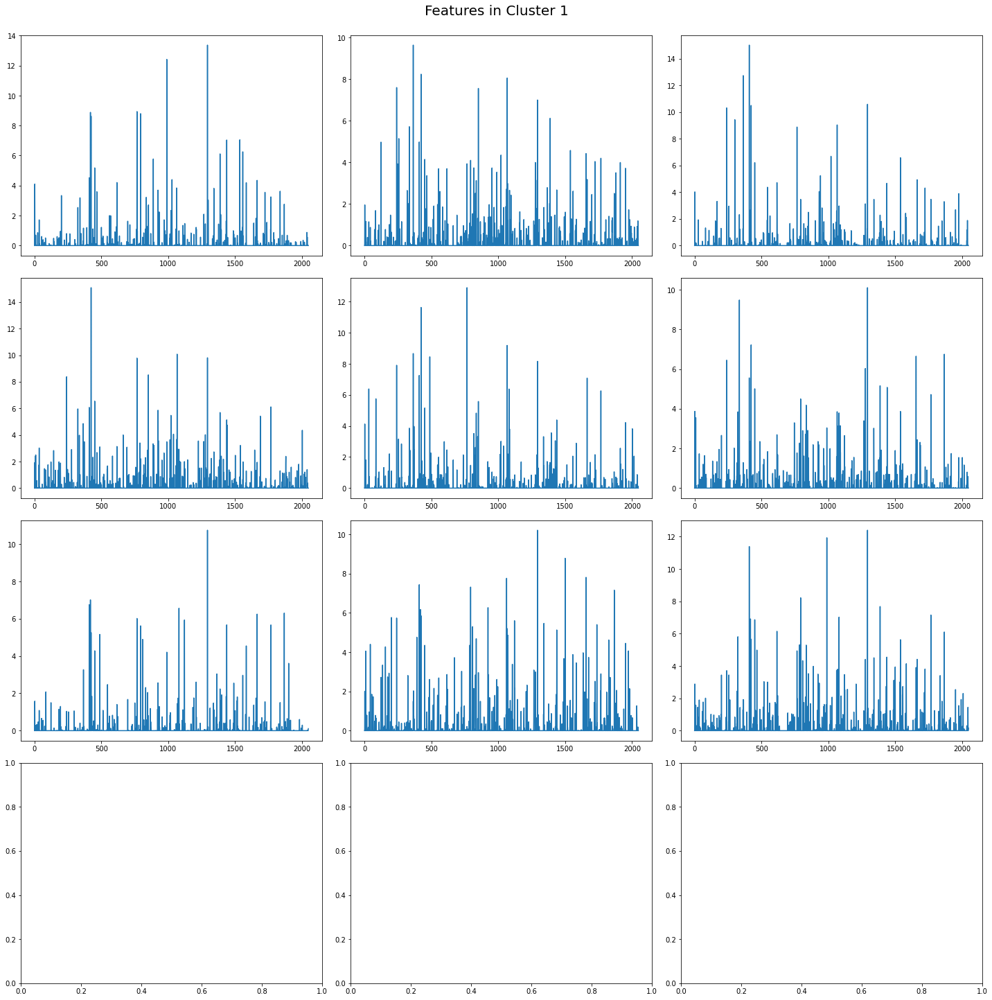

Total number of rivers in cluster 2 :  (55, 2048)


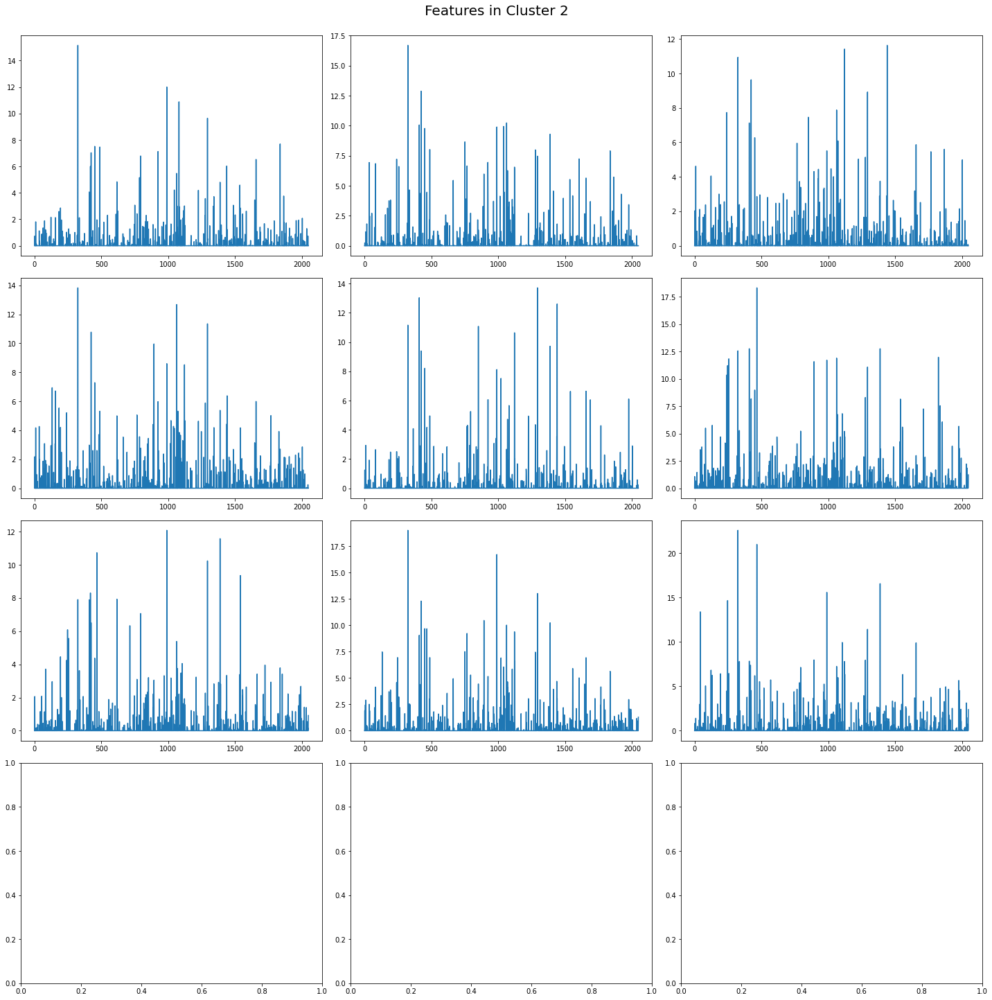

Total number of rivers in cluster 3 :  (64, 2048)


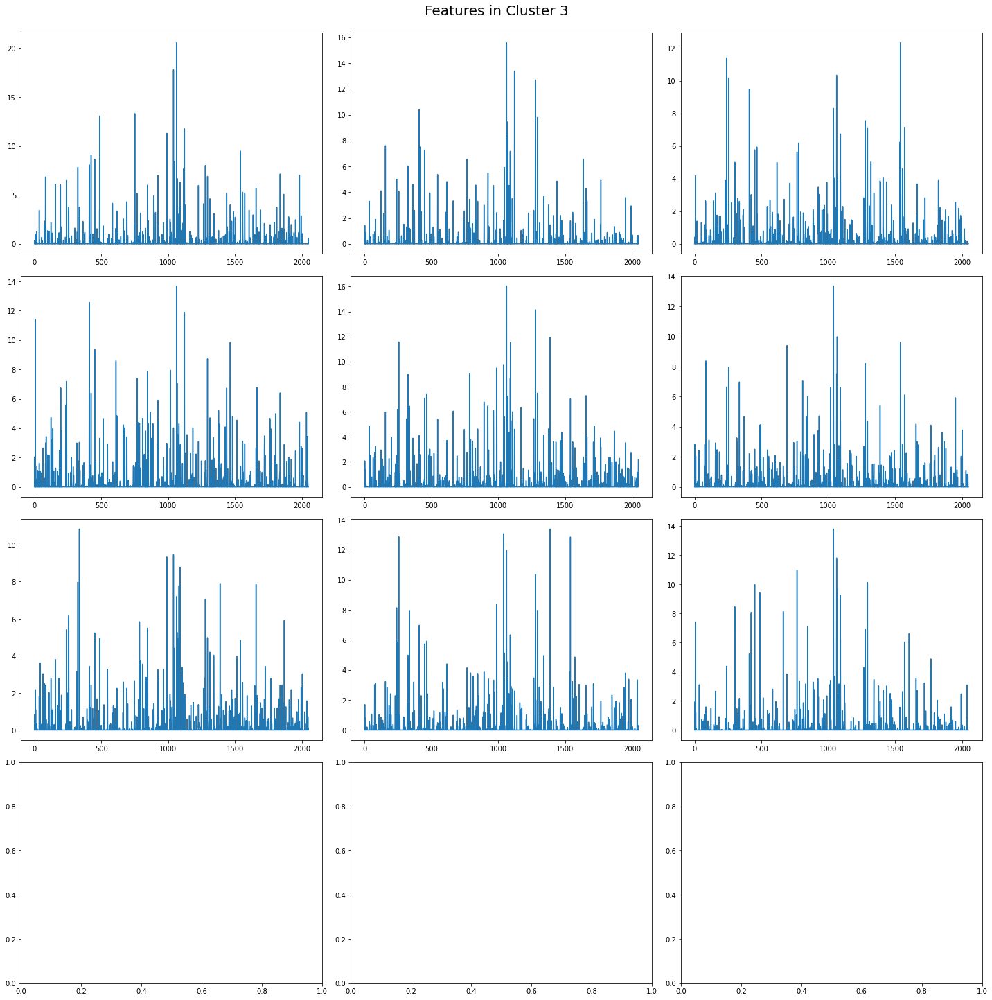

Similarity to centroid  0 :   [0.84871525 0.860942   0.8300319 ]
Similarity to centroid  1 :   [0.7523549 0.8361233 0.8370277]
Similarity to centroid  2 :   [0.8240215 0.8680516 0.8212942]
Similarity to centroid  3 :   [0.8073555 0.7492158 0.7592373]
Total features selected for centroid 0 :  (1, 33)
Total features selected for centroid 1 :  (1, 146)
Total features selected for centroid 2 :  (1, 55)
Total features selected for centroid 3 :  (1, 60)


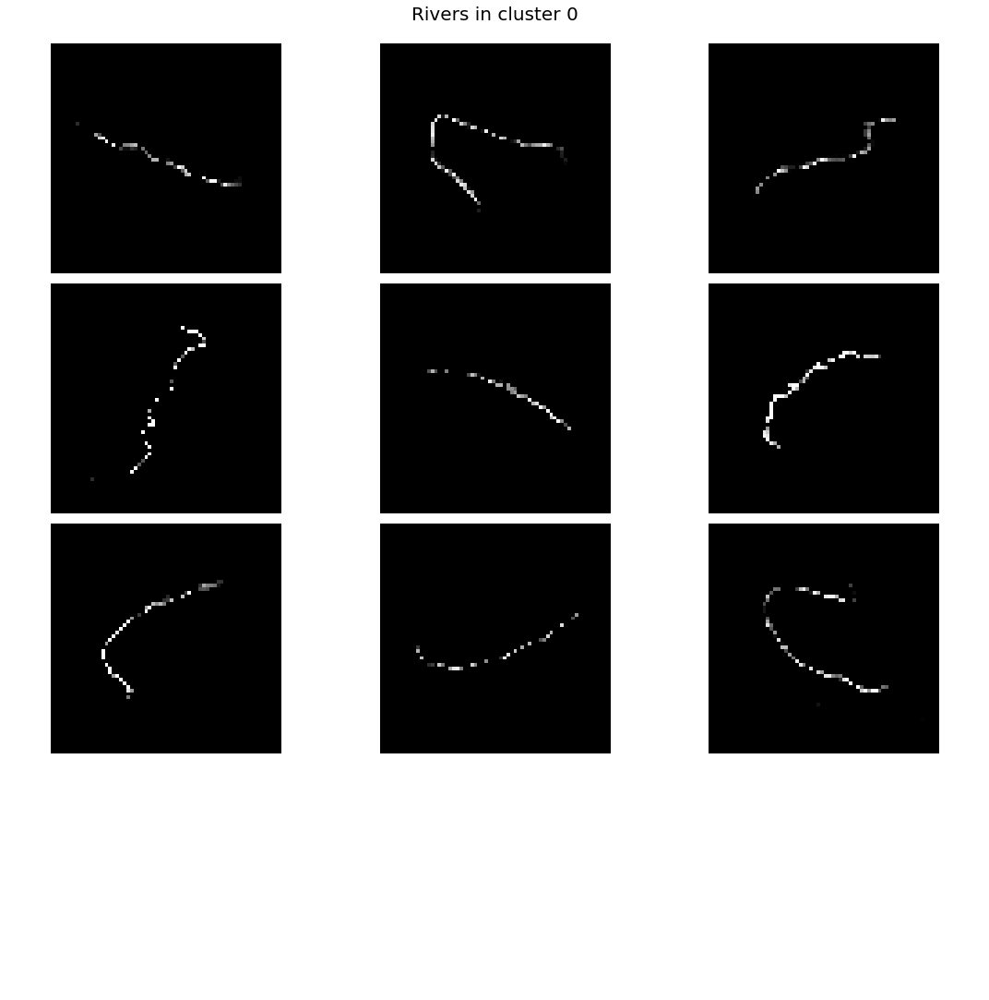

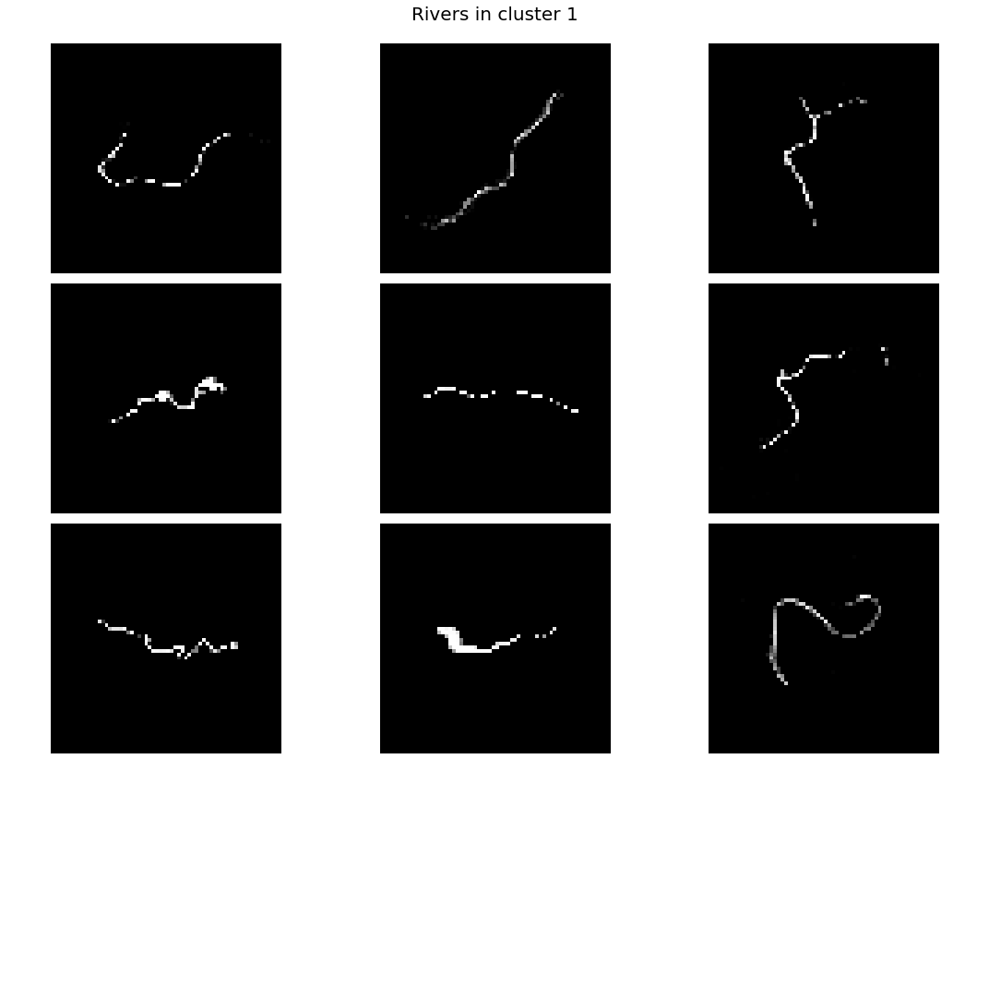

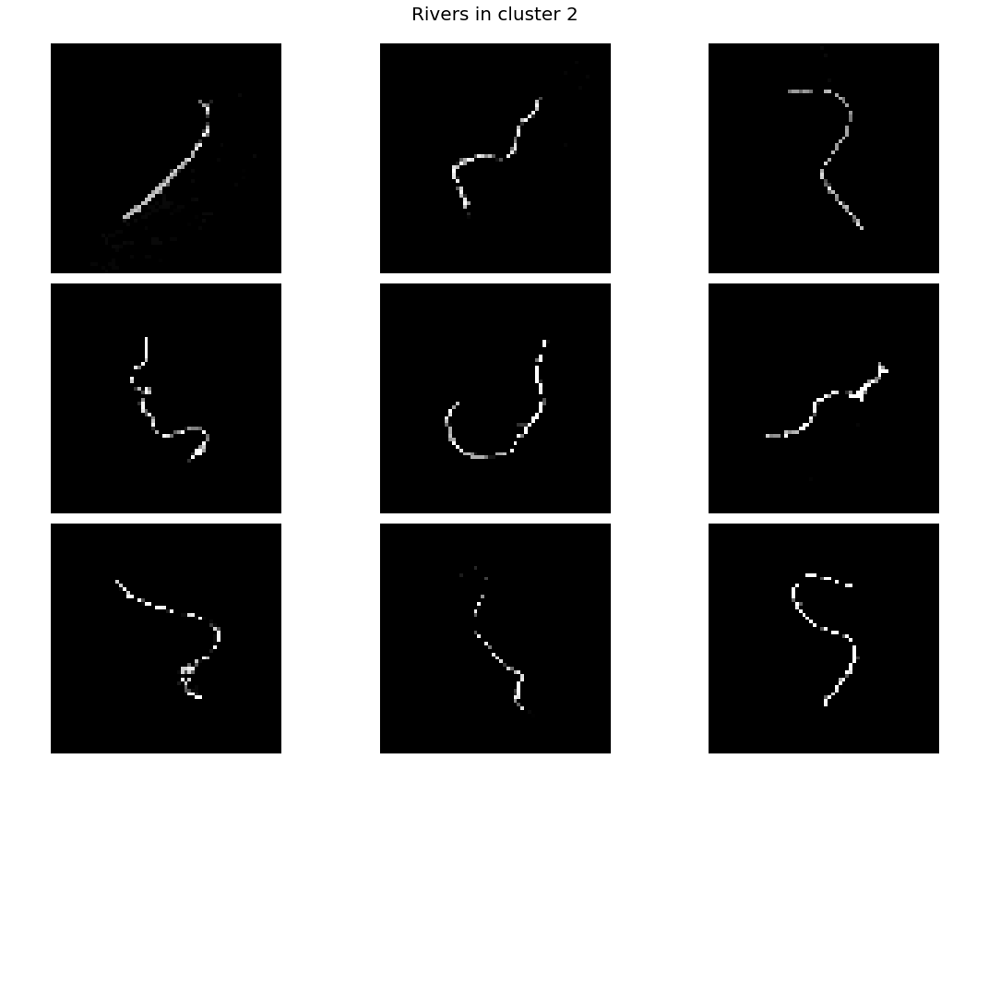

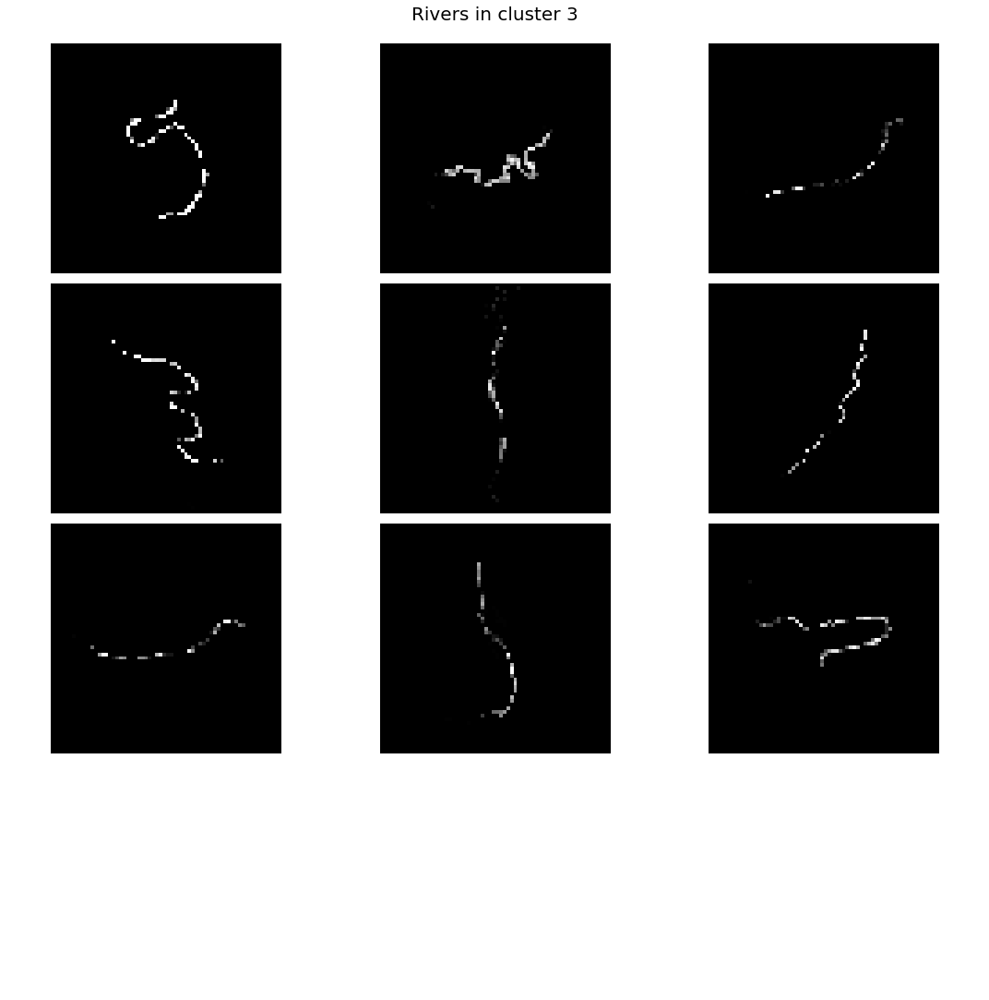

Training images :  (294, 64, 64, 3)
Labels : (294,)
Loss used: categorical_crossentropy, Optimizer used: adam
Epoch 1/5
15/15 [==============================] - 4s 97ms/step - loss: 0.2535 - categorical_crossentropy: 0.2535 - categorical_accuracy: 0.9082
Epoch 2/5
15/15 [==============================] - 1s 95ms/step - loss: 0.1744 - categorical_crossentropy: 0.1744 - categorical_accuracy: 0.9592
Epoch 3/5
15/15 [==============================] - 1s 90ms/step - loss: 0.1138 - categorical_crossentropy: 0.1138 - categorical_accuracy: 0.9796
Epoch 4/5
15/15 [==============================] - 1s 90ms/step - loss: 0.0915 - categorical_crossentropy: 0.0915 - categorical_accuracy: 0.9796
Epoch 5/5
15/15 [==============================] - 1s 89ms/step - loss: 0.0738 - categorical_crossentropy: 0.0738 - categorical_accuracy: 0.9932
Iteration is:  5


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP3_KR_317_UCL_70_4/model/assets


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP3_KR_317_UCL_70_4/model/assets


In [18]:
experiment = 'EXP3_KR_317_UCL_70_4'
threshold = 0.7
clusters = 4
epochs = 5
classes = clusters 
ucl_model = select_model(classes,'softmax')['ucl_model']


tot_iterations = 5
ucl_experiments(ucl_model, plt, clusters, threshold, epochs,tot_iterations)

KerasTensor(type_spec=TensorSpec(shape=(None, 2048), dtype=tf.float32, name=None), name='avg_pool/Mean:0', description="created by layer 'avg_pool'")
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_5 (Flatten)         (None, 2048)              0         
                                                                 
 dense_10 (Dense)            (None, 128)               262272    
                                                                 
 dense_11 (Dense)            (None, 5)                 645       
                                                                 
Total params: 23,827,717
Trainable params: 262,917
Non-trainable params: 23,564,800
_________________________________________________________________
None
 <function so

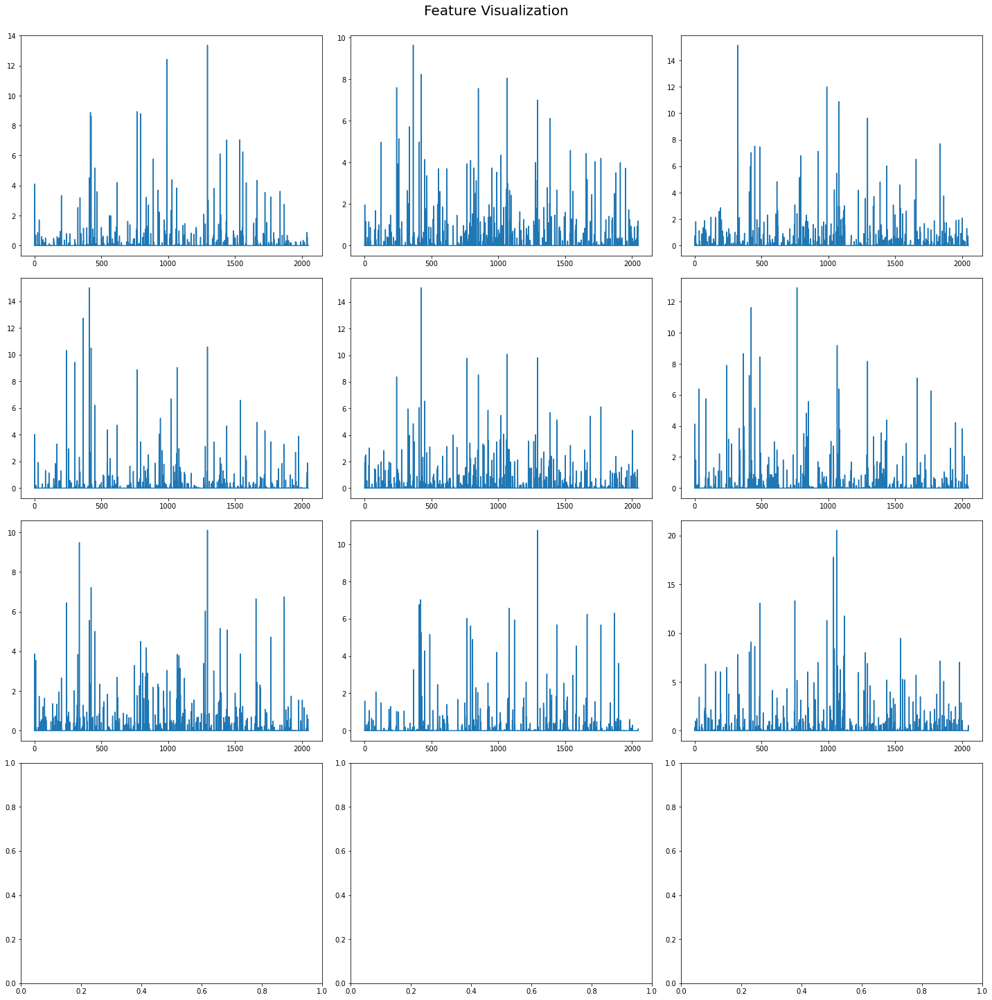

Kmeans cluster centers:  [[5.3536342e-03 1.5867725e-01 2.3652399e+00 ... 0.0000000e+00
  1.4901161e-08 1.6986482e-01]
 [5.3750444e-04 9.4542801e-03 2.6757631e+00 ... 0.0000000e+00
  1.4723465e-03 1.5616849e-02]
 [9.1025561e-02 1.4420879e-01 1.1477799e+00 ... 0.0000000e+00
  4.6545008e-01 9.6503472e-01]
 [1.3554478e-03 1.7777642e-02 1.5752246e+00 ... 0.0000000e+00
  9.0705812e-02 1.8763857e-01]
 [3.7252903e-09 2.2539873e-02 2.1808424e+00 ... 0.0000000e+00
  1.6664639e-02 1.6979280e-01]]
Total number of rivers in cluster 0 :  (29, 2048)


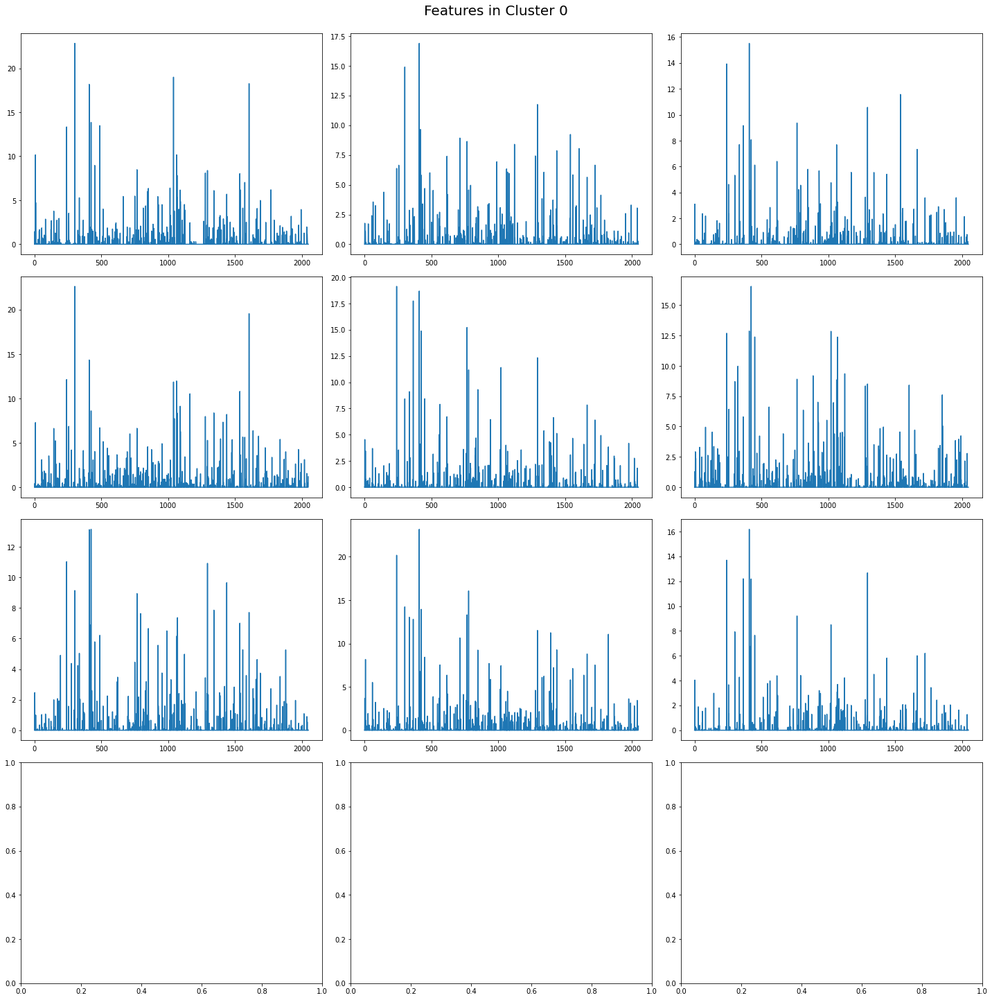

Total number of rivers in cluster 1 :  (101, 2048)


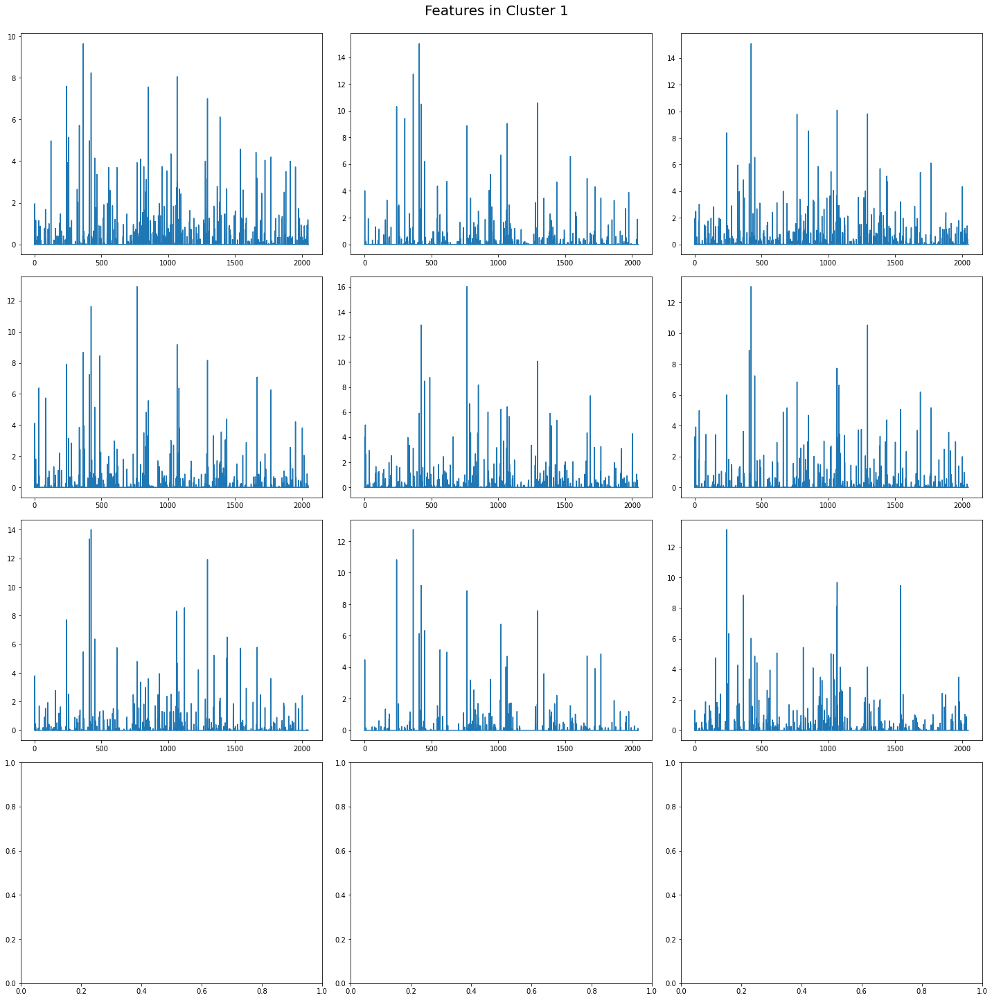

Total number of rivers in cluster 2 :  (33, 2048)


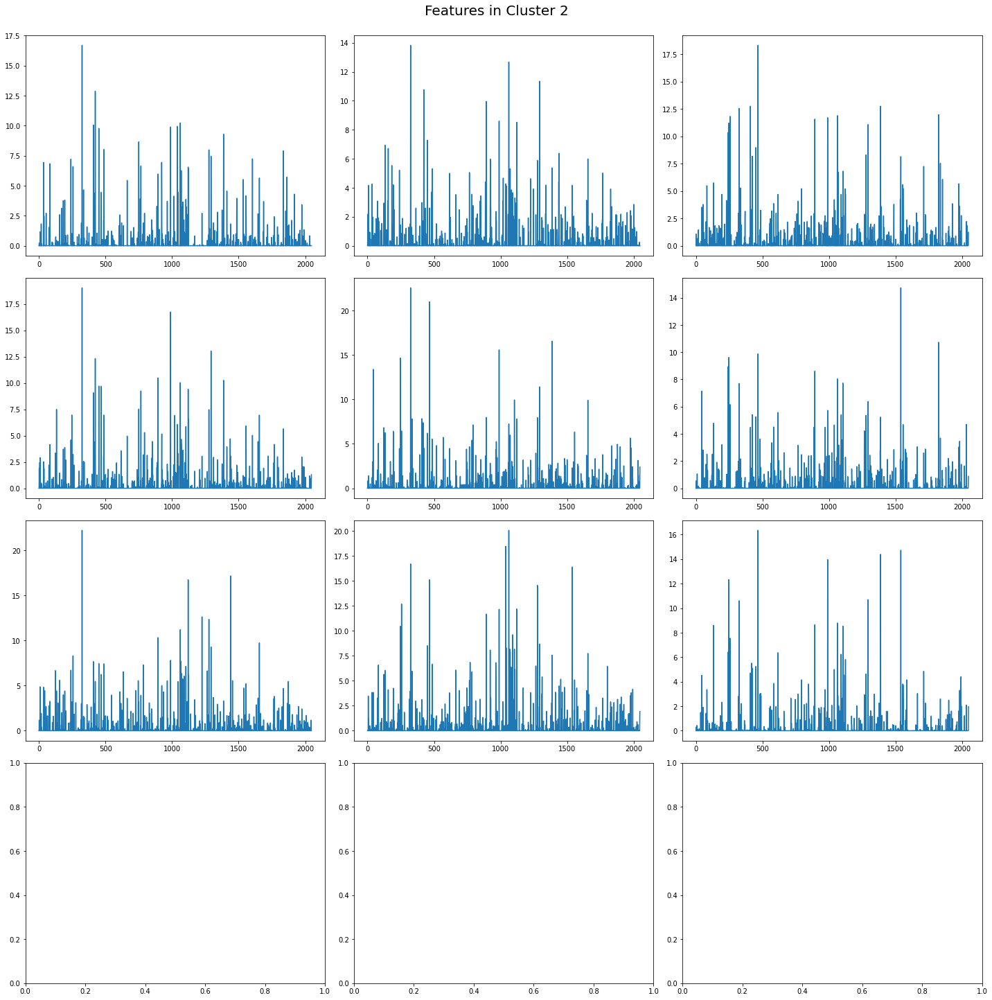

Total number of rivers in cluster 3 :  (58, 2048)


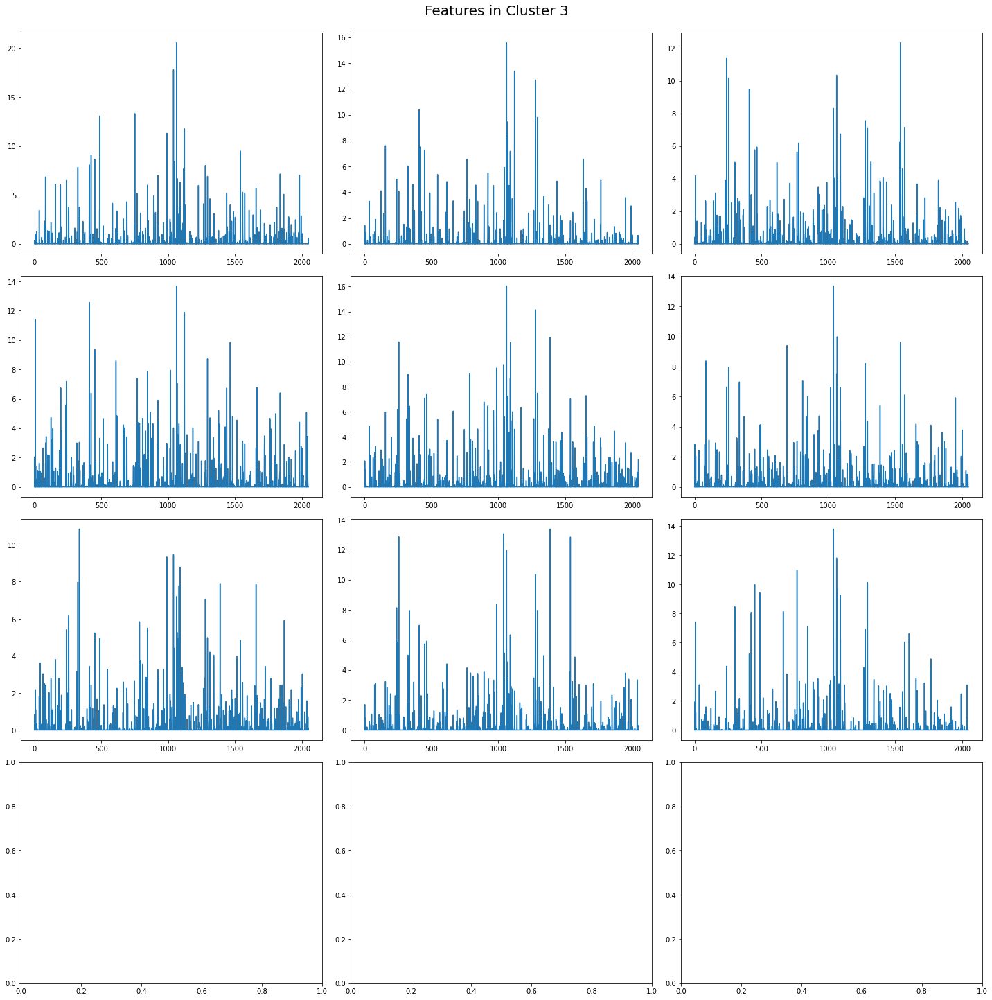

Total number of rivers in cluster 4 :  (96, 2048)


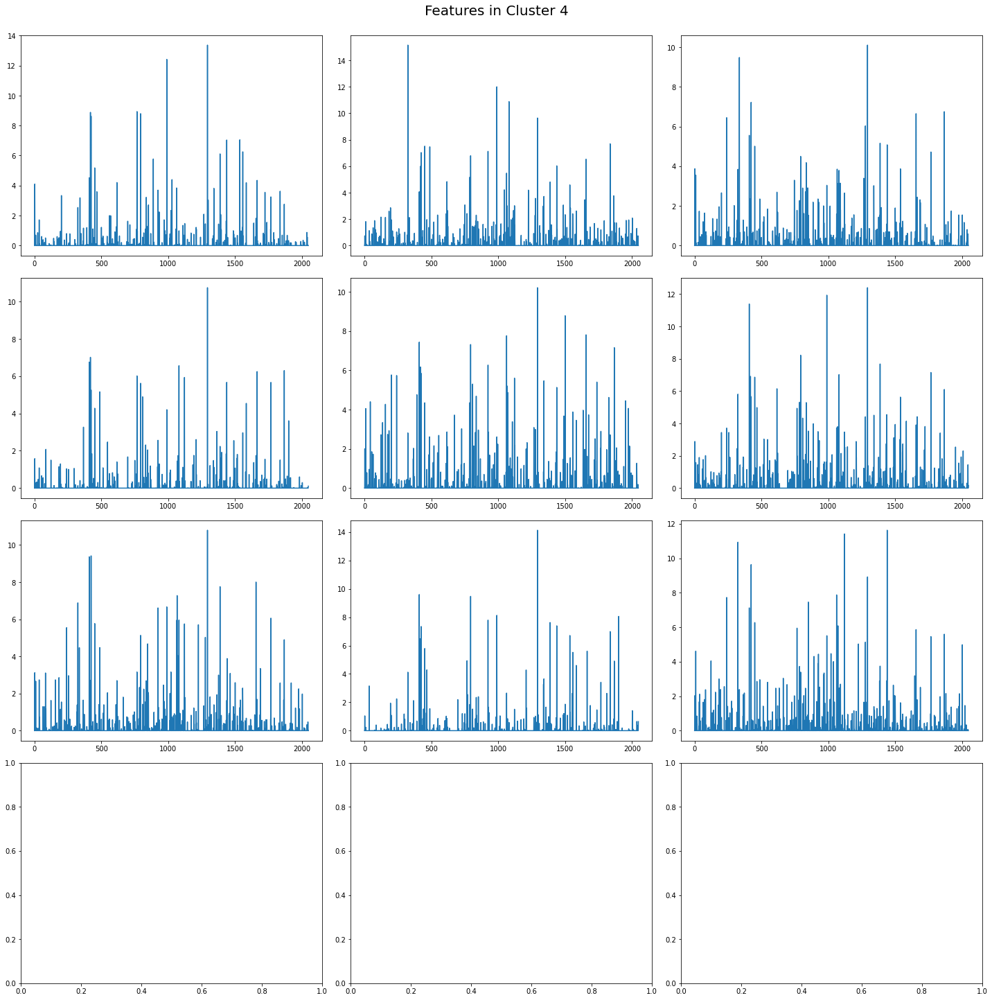

Similarity to centroid  0 :   [0.848166   0.8536696  0.84117967]
Similarity to centroid  1 :   [0.8461968 0.8605993 0.8717825]
Similarity to centroid  2 :   [0.86672235 0.86128646 0.8558292 ]
Similarity to centroid  3 :   [0.8133733 0.7567276 0.7587915]
Similarity to centroid  4 :   [0.8382804  0.8171252  0.81230694]
Total features selected for centroid 0 :  (1, 28)
Total features selected for centroid 1 :  (1, 97)
Total features selected for centroid 2 :  (1, 33)
Total features selected for centroid 3 :  (1, 54)
Total features selected for centroid 4 :  (1, 90)


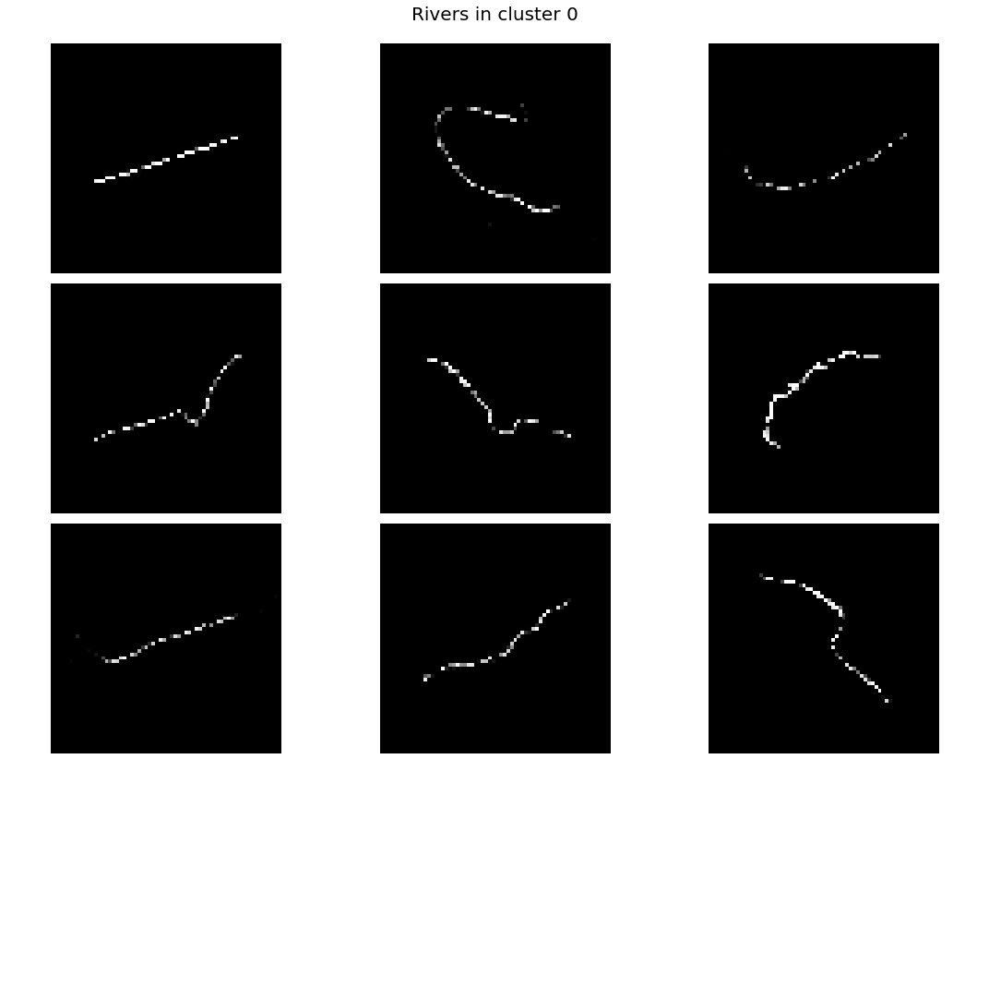

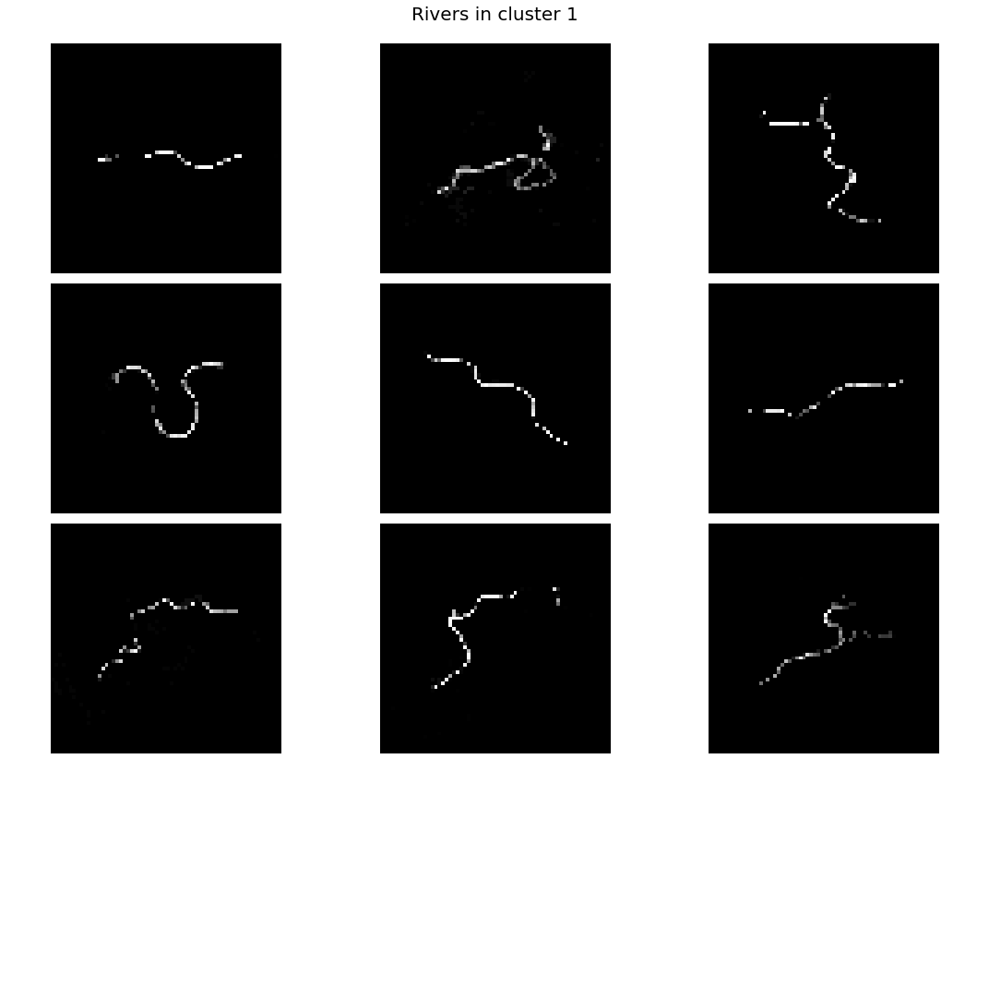

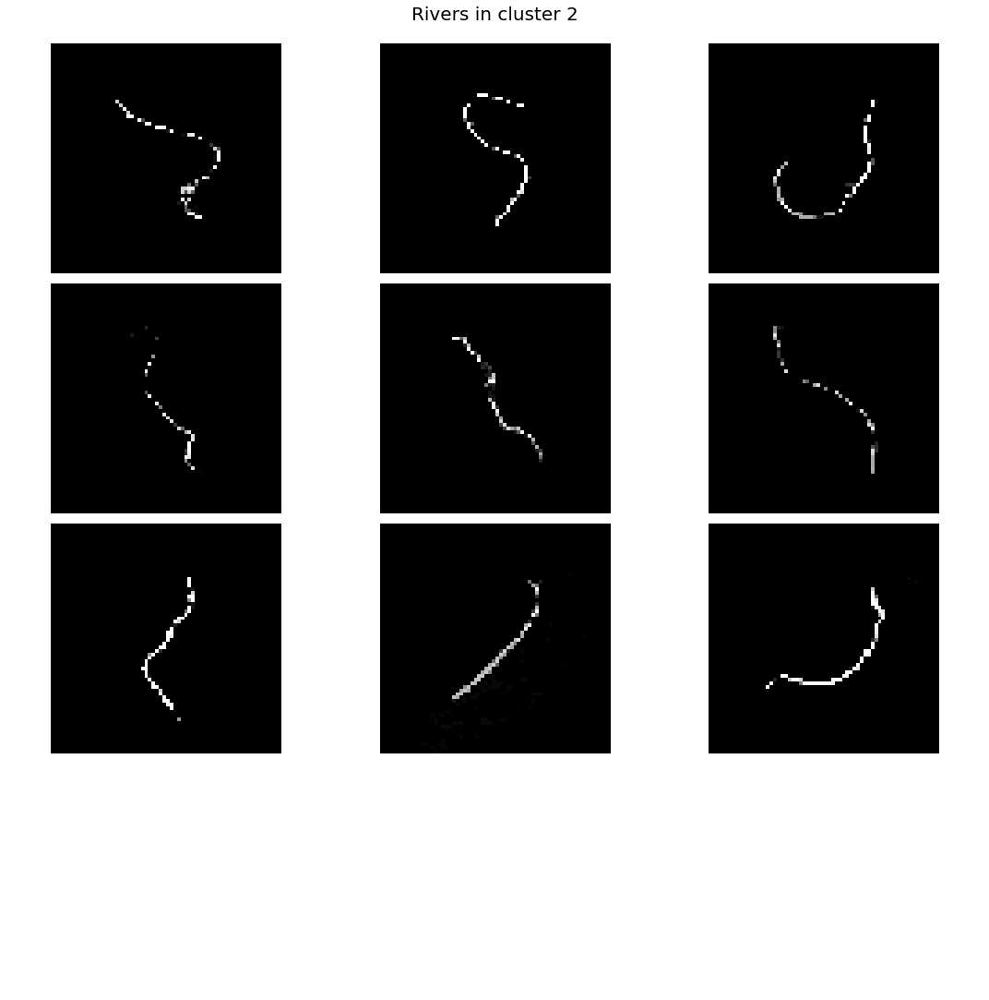

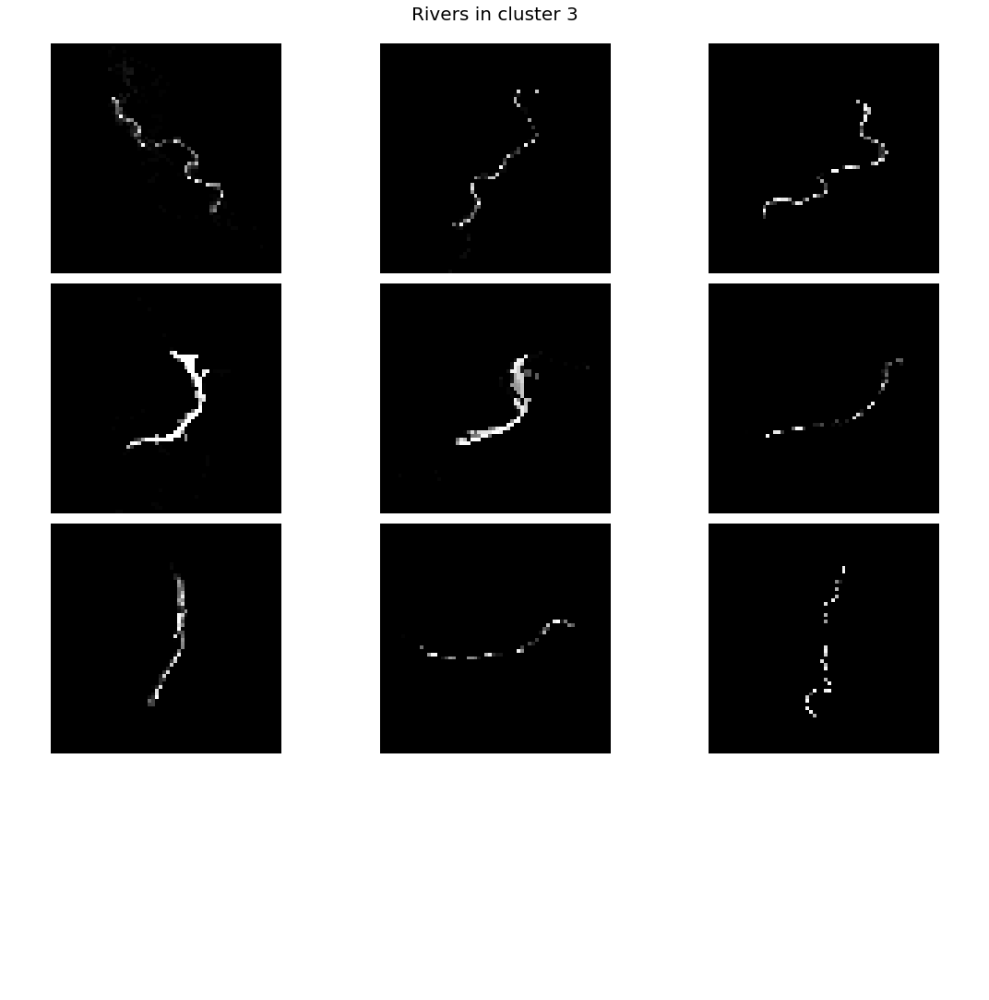

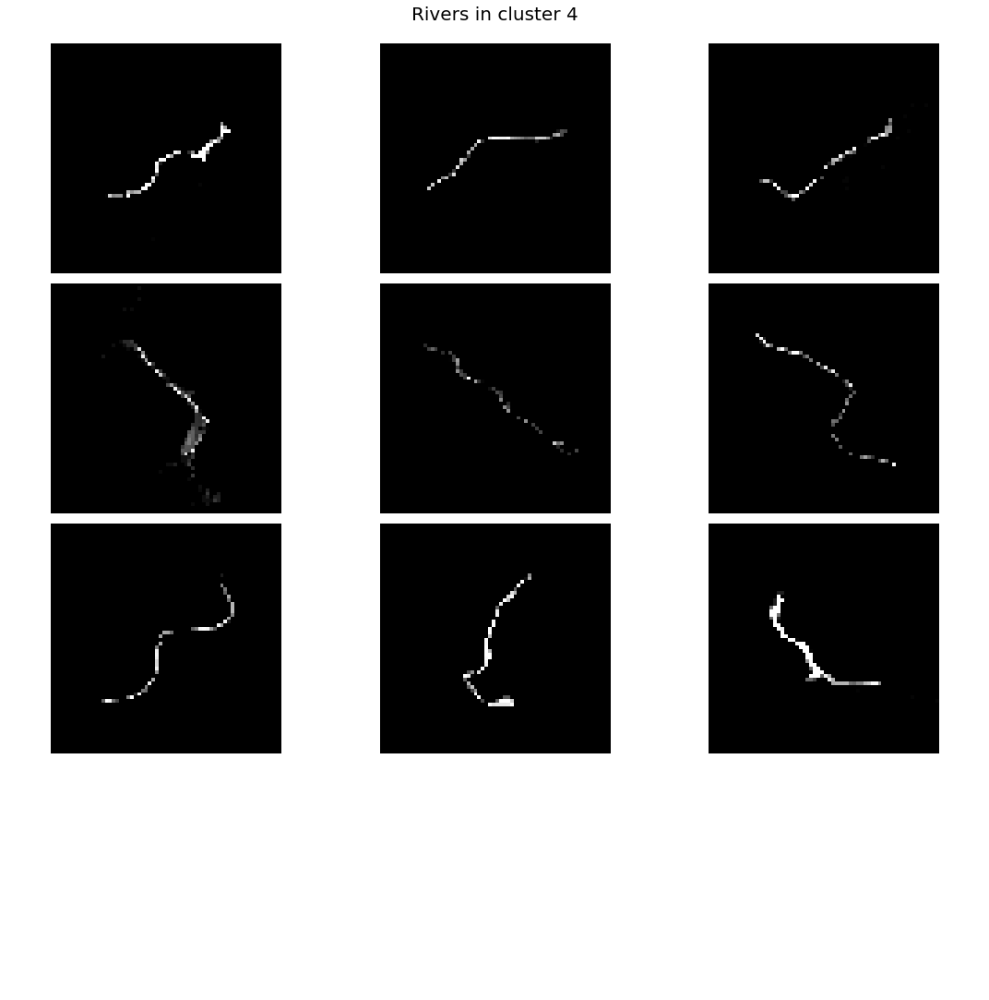

Training images :  (302, 64, 64, 3)
Labels : (302,)
Loss used: categorical_crossentropy, Optimizer used: adam
Epoch 1/5
16/16 [==============================] - 4s 99ms/step - loss: 5.3706 - categorical_crossentropy: 5.3706 - categorical_accuracy: 0.1689
Epoch 2/5
16/16 [==============================] - 1s 91ms/step - loss: 1.9726 - categorical_crossentropy: 1.9726 - categorical_accuracy: 0.3642
Epoch 3/5
16/16 [==============================] - 1s 86ms/step - loss: 0.8135 - categorical_crossentropy: 0.8135 - categorical_accuracy: 0.6887
Epoch 4/5
16/16 [==============================] - 1s 87ms/step - loss: 0.4862 - categorical_crossentropy: 0.4862 - categorical_accuracy: 0.8907
Epoch 5/5
16/16 [==============================] - 1s 86ms/step - loss: 0.3184 - categorical_crossentropy: 0.3184 - categorical_accuracy: 0.9338
Iteration is:  5


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP4_KR_317_UCL_70_5/model/assets


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP4_KR_317_UCL_70_5/model/assets


In [19]:
experiment = 'EXP4_KR_317_UCL_70_5'
threshold = 0.7
clusters = 5
epochs = 5
classes = clusters 
ucl_model = select_model(classes,'softmax')['ucl_model']

tot_iterations = 5
ucl_experiments(ucl_model, plt, clusters, threshold, epochs,tot_iterations)

KerasTensor(type_spec=TensorSpec(shape=(None, 2048), dtype=tf.float32, name=None), name='avg_pool/Mean:0', description="created by layer 'avg_pool'")
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_6 (Flatten)         (None, 2048)              0         
                                                                 
 dense_12 (Dense)            (None, 128)               262272    
                                                                 
 dense_13 (Dense)            (None, 6)                 774       
                                                                 
Total params: 23,827,846
Trainable params: 263,046
Non-trainable params: 23,564,800
_________________________________________________________________
None
 <function so

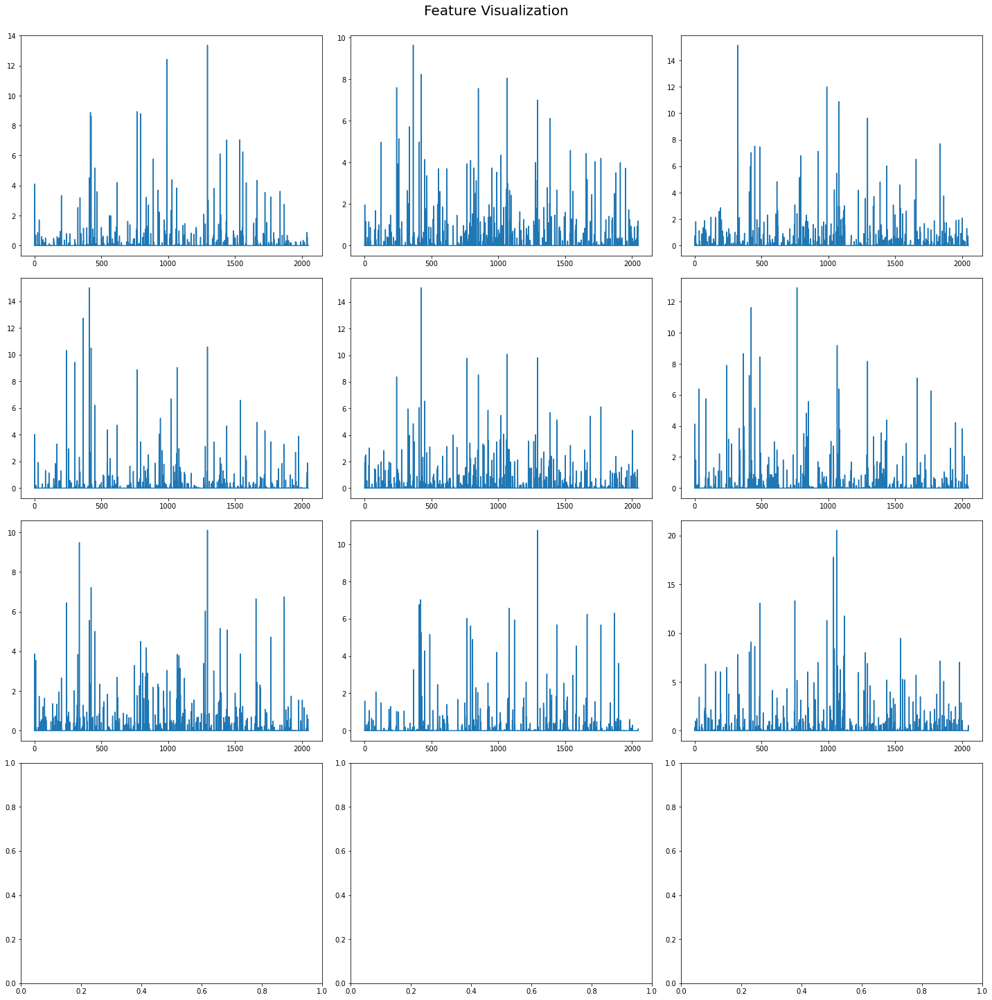

Kmeans cluster centers:  [[2.79396772e-09 1.37111947e-01 2.51296186e+00 ... 0.00000000e+00
  1.49011612e-08 1.71211466e-01]
 [7.64615834e-04 2.88717076e-03 2.29322624e+00 ... 0.00000000e+00
  2.99540088e-02 1.24843970e-01]
 [1.51184481e-03 1.98289063e-02 1.49435067e+00 ... 0.00000000e+00
  1.01171866e-01 1.96748435e-01]
 [9.87218395e-02 1.56888321e-01 1.10715306e+00 ... 0.00000000e+00
  4.63528991e-01 1.00074339e+00]
 [4.65661287e-09 9.57931951e-03 2.69574189e+00 ... 0.00000000e+00
  1.70928240e-03 6.68278337e-03]
 [4.65661287e-09 5.98525628e-02 2.08273768e+00 ... 0.00000000e+00
  0.00000000e+00 1.91047117e-01]]
Total number of rivers in cluster 0 :  (25, 2048)


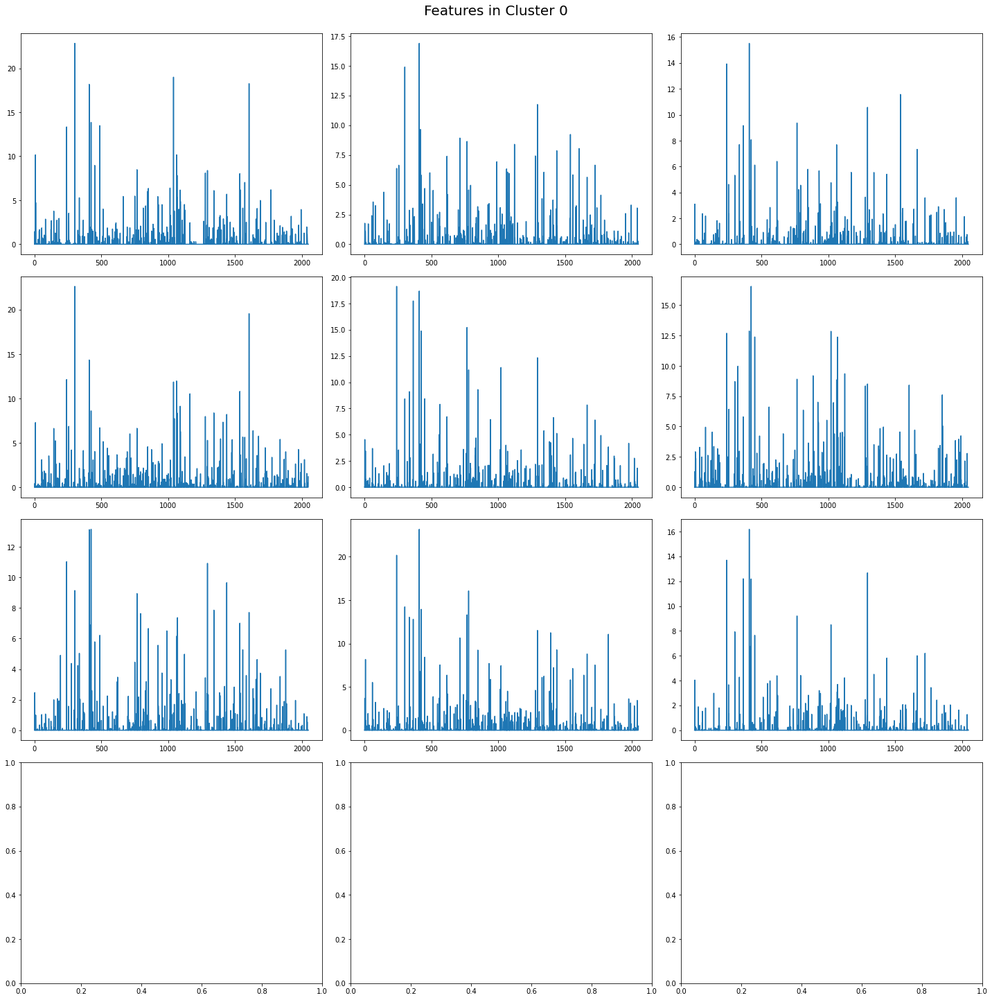

Total number of rivers in cluster 1 :  (71, 2048)


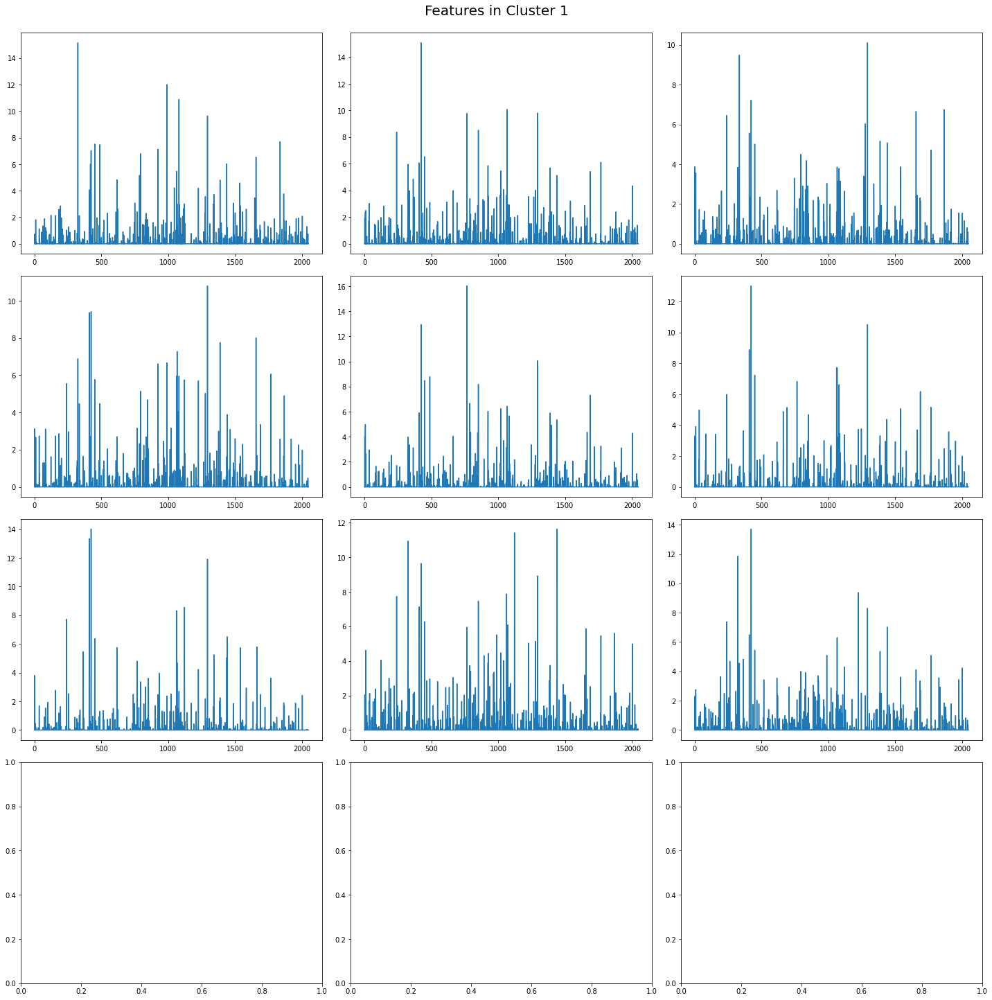

Total number of rivers in cluster 2 :  (52, 2048)


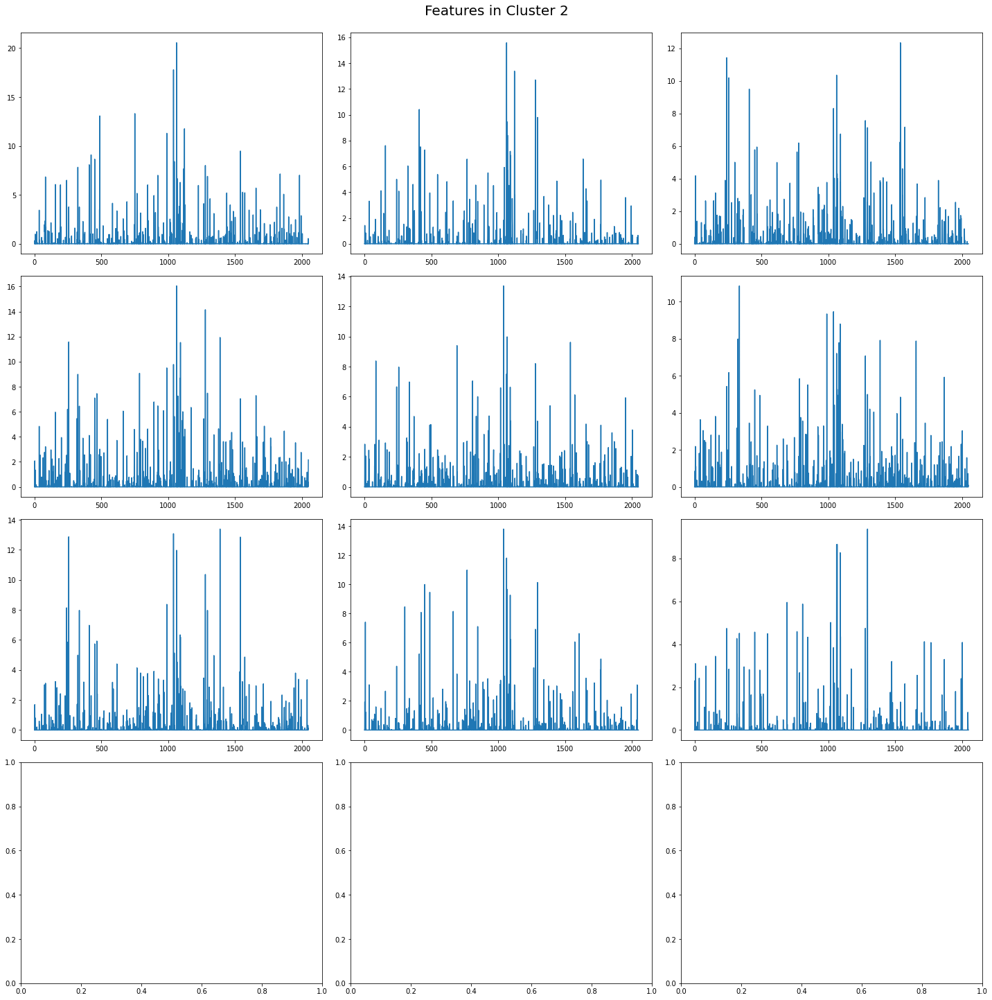

Total number of rivers in cluster 3 :  (32, 2048)


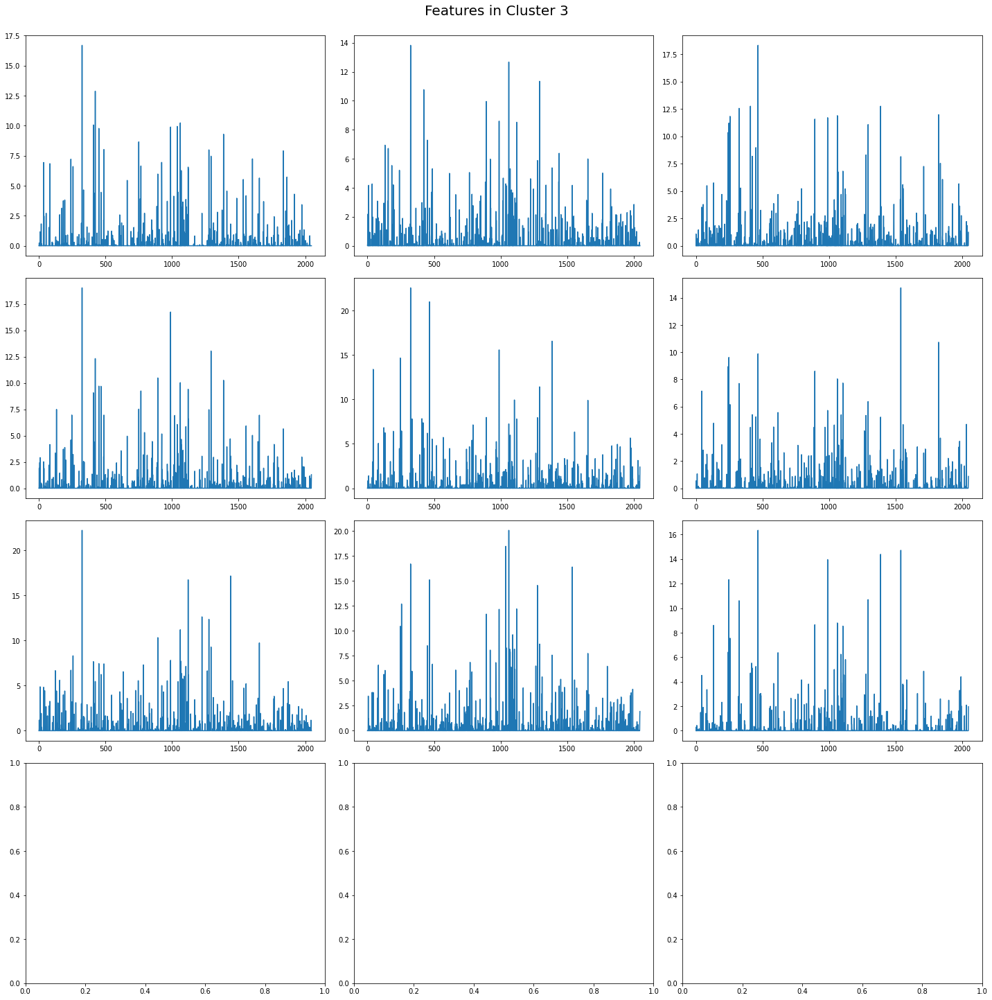

Total number of rivers in cluster 4 :  (87, 2048)


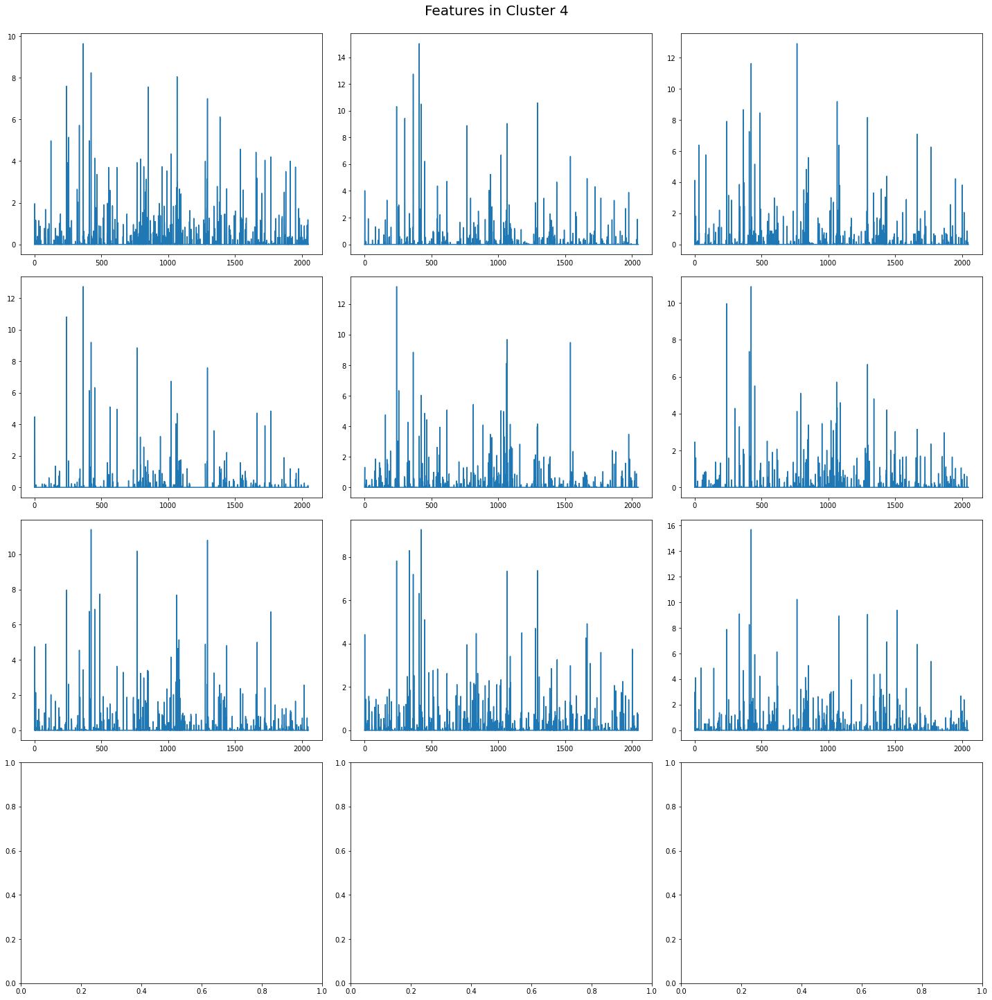

Total number of rivers in cluster 5 :  (50, 2048)


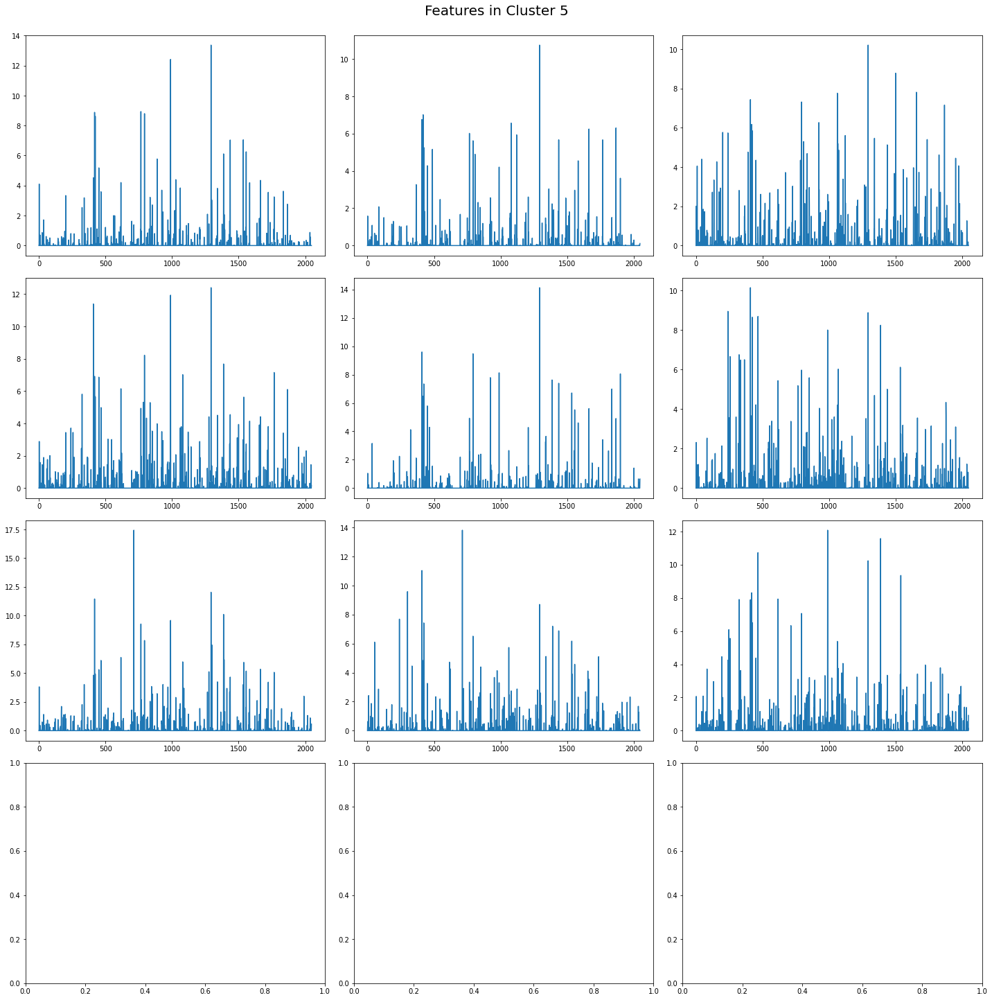

Similarity to centroid  0 :   [0.8514437 0.8418286 0.8437482]
Similarity to centroid  1 :   [0.7949104  0.89328647 0.83740664]
Similarity to centroid  2 :   [0.8135337 0.7586458 0.7663148]
Similarity to centroid  3 :   [0.8633784 0.8560308 0.8609147]
Similarity to centroid  4 :   [0.8479665  0.86253715 0.8822615 ]
Similarity to centroid  5 :   [0.8735739  0.76844203 0.7115994 ]
Total features selected for centroid 0 :  (1, 25)
Total features selected for centroid 1 :  (1, 67)
Total features selected for centroid 2 :  (1, 48)
Total features selected for centroid 3 :  (1, 31)
Total features selected for centroid 4 :  (1, 84)
Total features selected for centroid 5 :  (1, 48)


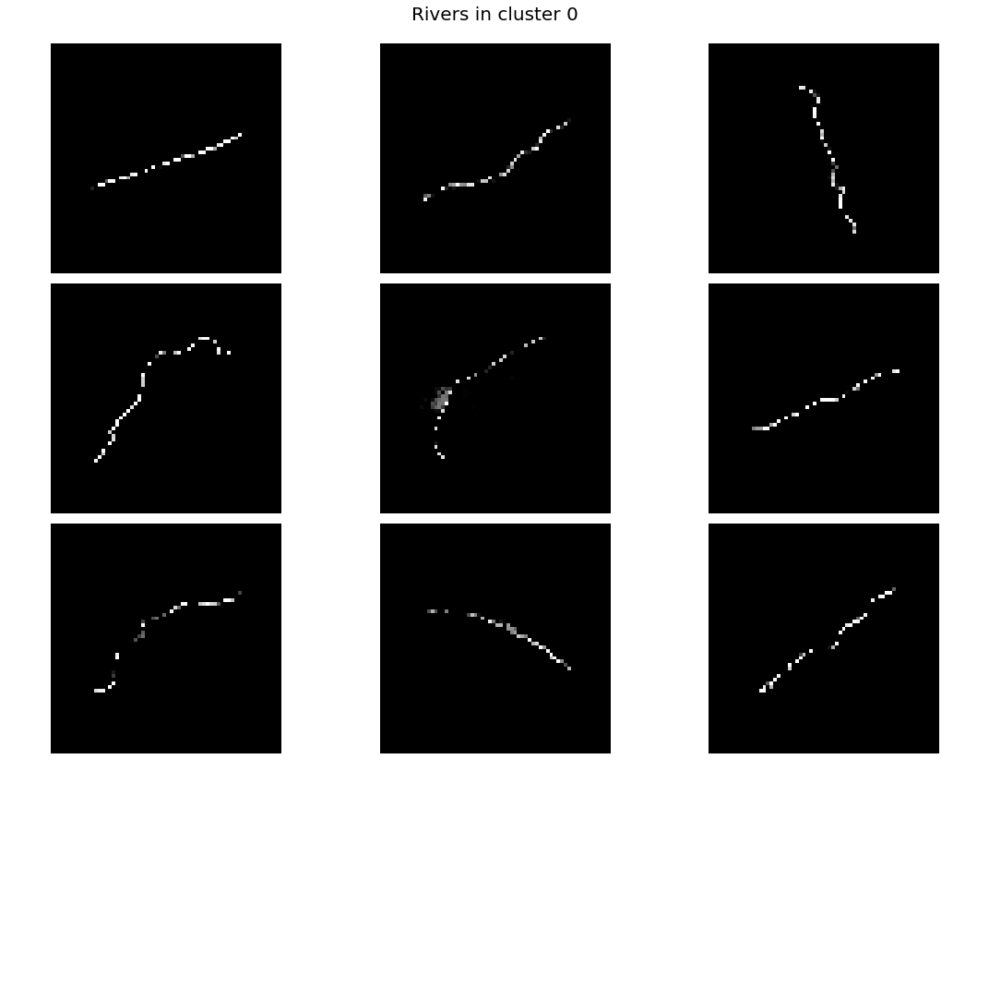

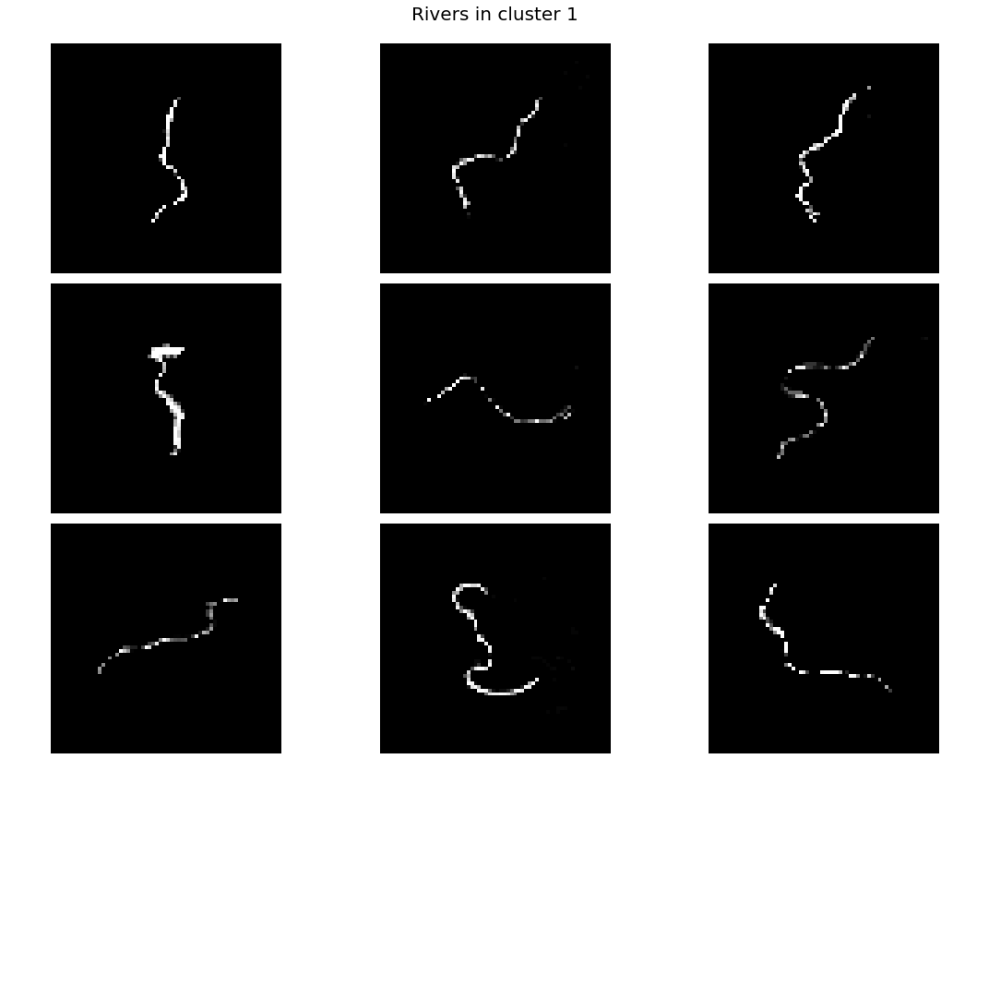

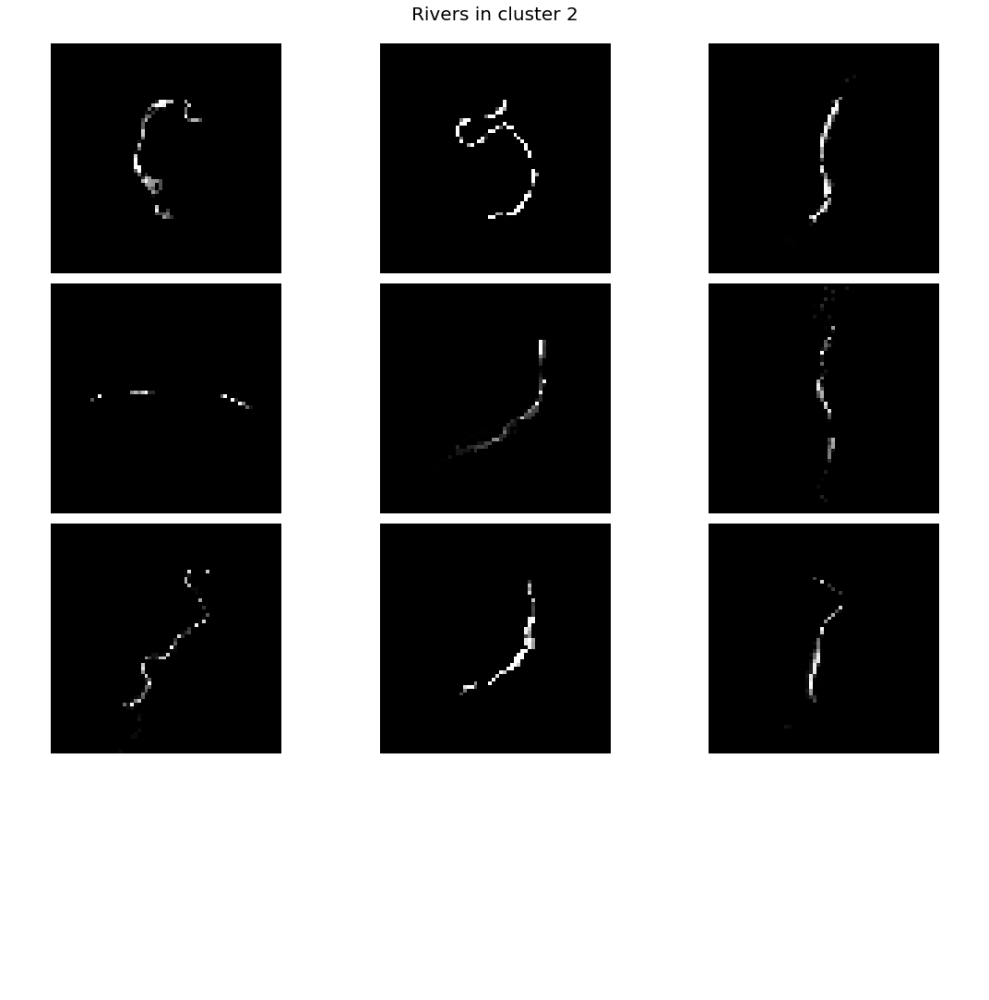

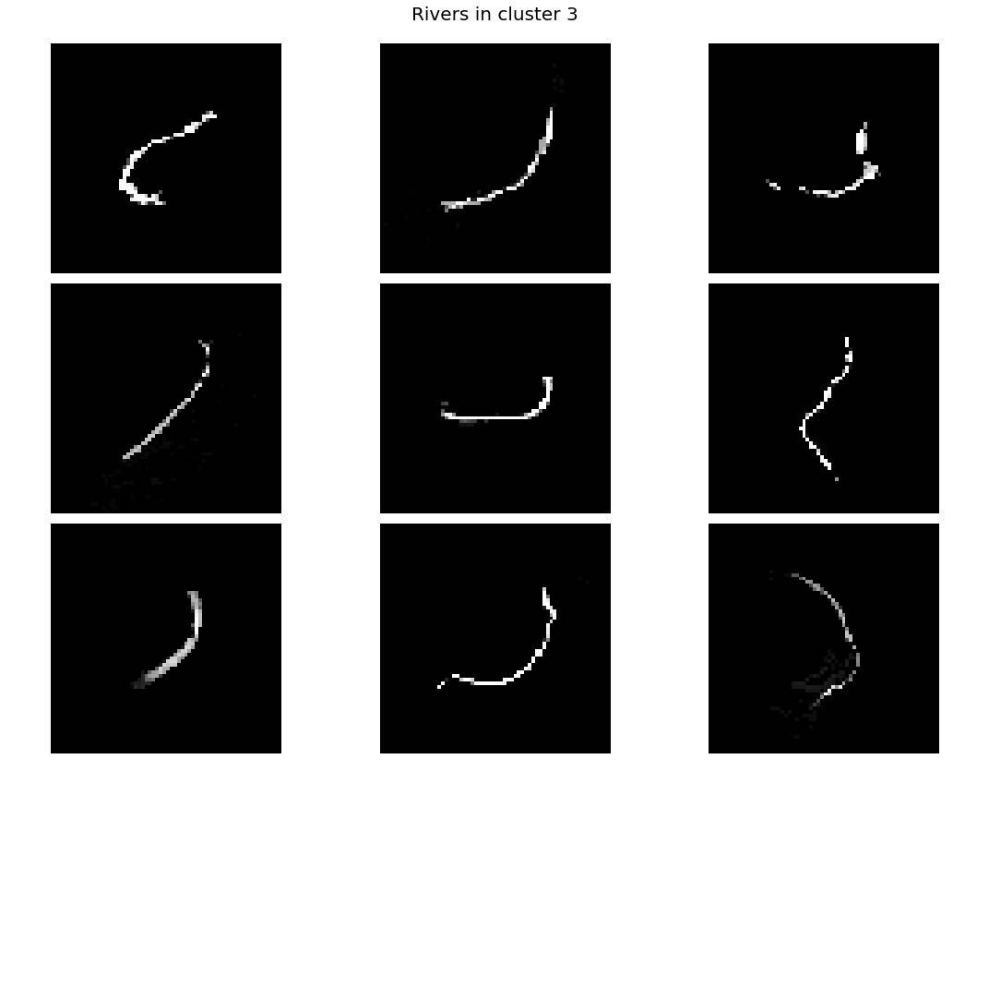

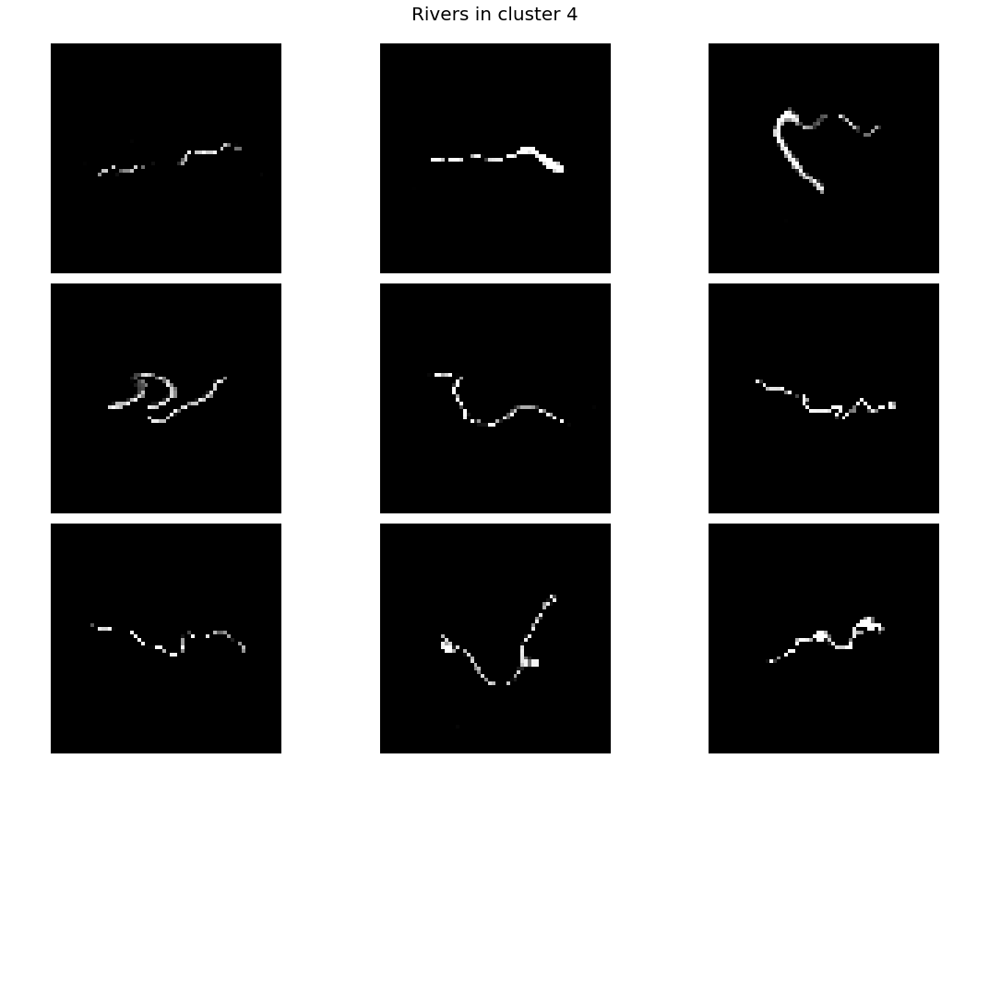

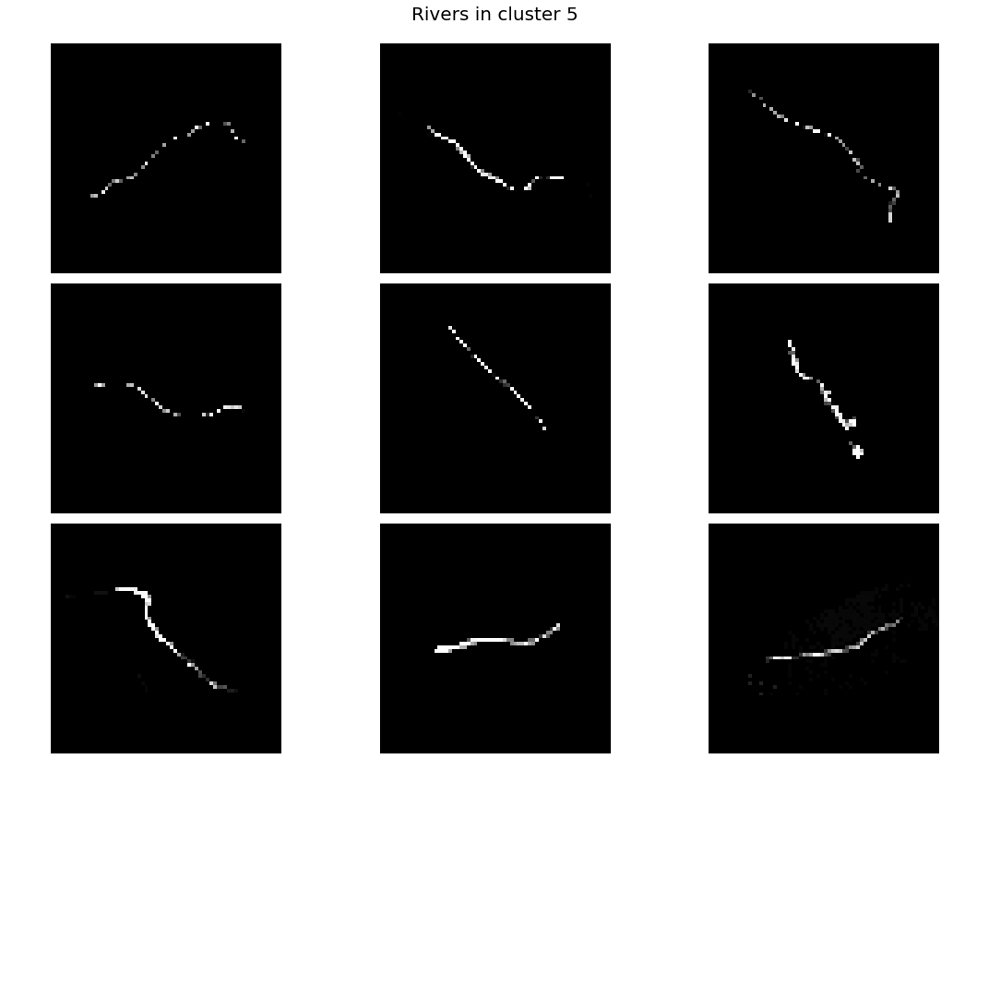

Training images :  (303, 64, 64, 3)
Labels : (303,)
Loss used: categorical_crossentropy, Optimizer used: adam
Epoch 1/5
16/16 [==============================] - 4s 94ms/step - loss: 2.8279 - categorical_crossentropy: 2.8279 - categorical_accuracy: 0.2475
Epoch 2/5
16/16 [==============================] - 1s 96ms/step - loss: 1.0179 - categorical_crossentropy: 1.0179 - categorical_accuracy: 0.6865
Epoch 3/5
16/16 [==============================] - 1s 87ms/step - loss: 0.5319 - categorical_crossentropy: 0.5319 - categorical_accuracy: 0.8680
Epoch 4/5
16/16 [==============================] - 1s 87ms/step - loss: 0.3489 - categorical_crossentropy: 0.3489 - categorical_accuracy: 0.9472
Epoch 5/5
16/16 [==============================] - 1s 87ms/step - loss: 0.2327 - categorical_crossentropy: 0.2327 - categorical_accuracy: 0.9736
Iteration is:  5


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP4_KR_317_UCL_70_6/model/assets


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP4_KR_317_UCL_70_6/model/assets


In [20]:
experiment = 'EXP4_KR_317_UCL_70_6'
threshold = 0.7
clusters = 6
epochs = 5
classes = clusters 
ucl_model = select_model(classes,'softmax')['ucl_model']

tot_iterations = 5
ucl_experiments(ucl_model, plt, clusters, threshold, epochs,tot_iterations)

KerasTensor(type_spec=TensorSpec(shape=(None, 2048), dtype=tf.float32, name=None), name='avg_pool/Mean:0', description="created by layer 'avg_pool'")
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_7 (Flatten)         (None, 2048)              0         
                                                                 
 dense_14 (Dense)            (None, 128)               262272    
                                                                 
 dense_15 (Dense)            (None, 7)                 903       
                                                                 
Total params: 23,827,975
Trainable params: 263,175
Non-trainable params: 23,564,800
_________________________________________________________________
None
 <function so

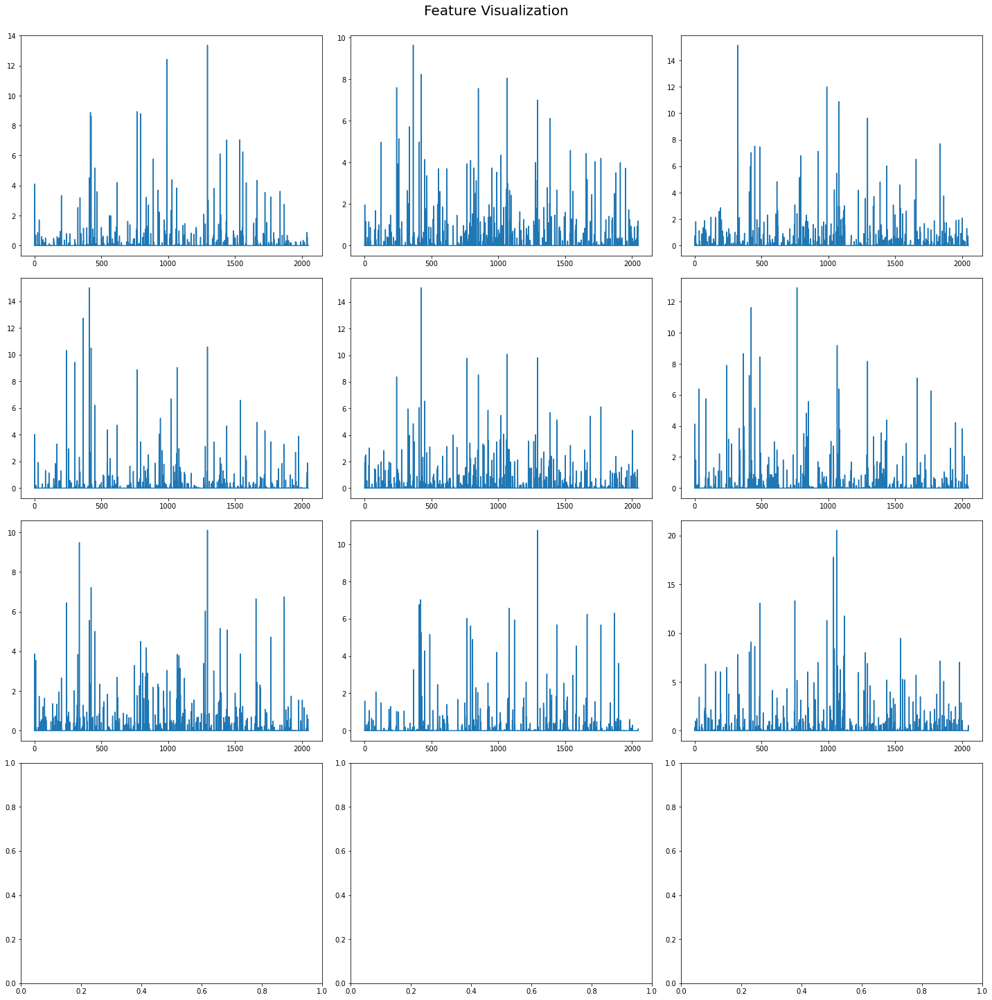

Kmeans cluster centers:  [[4.3084398e-02 2.9668219e-02 2.2458019e+00 ... 0.0000000e+00
  3.3188215e-01 1.0764022e-01]
 [1.9174609e-03 2.5148852e-02 1.3246213e+00 ... 0.0000000e+00
  8.2911327e-02 1.8675126e-01]
 [6.0319714e-04 9.2600062e-03 2.7442124e+00 ... 0.0000000e+00
  3.9719045e-05 8.6136609e-03]
 ...
 [3.7591439e-04 1.0059364e-03 2.0366950e+00 ... 0.0000000e+00
  9.4464630e-02 1.4648056e-01]
 [2.7939677e-09 4.6488374e-02 2.1993372e+00 ... 0.0000000e+00
  2.5916398e-03 1.7913172e-01]
 [1.8626451e-09 1.4131001e-01 2.4188266e+00 ... 0.0000000e+00
  7.4505806e-09 1.5286738e-01]]
Total number of rivers in cluster 0 :  (13, 2048)


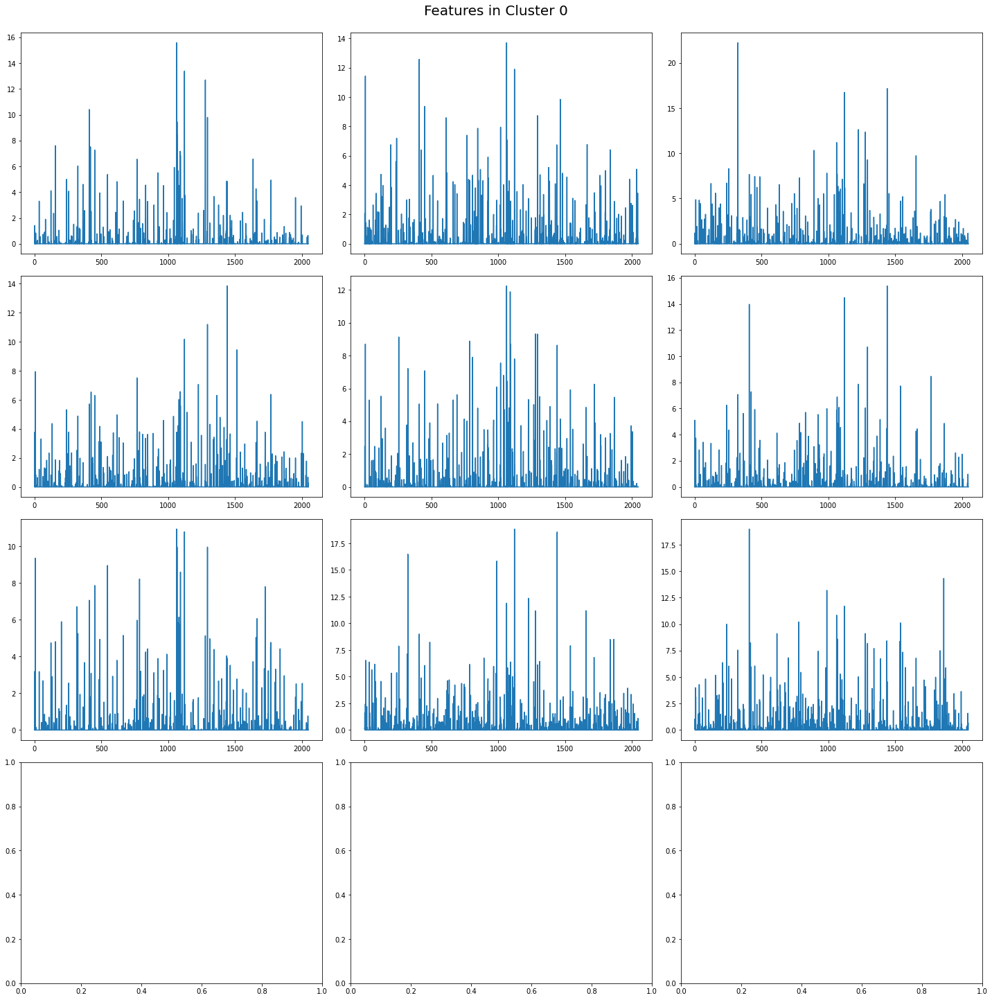

Total number of rivers in cluster 1 :  (41, 2048)


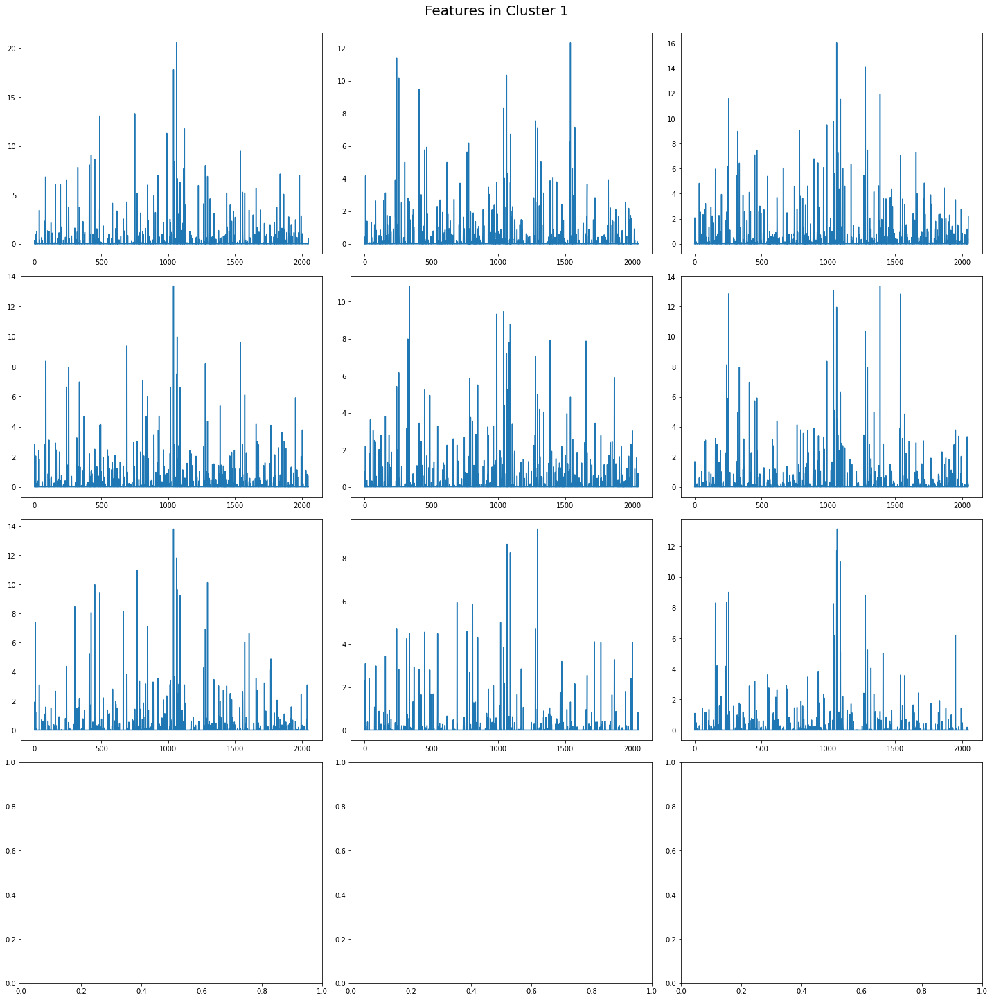

Total number of rivers in cluster 2 :  (90, 2048)


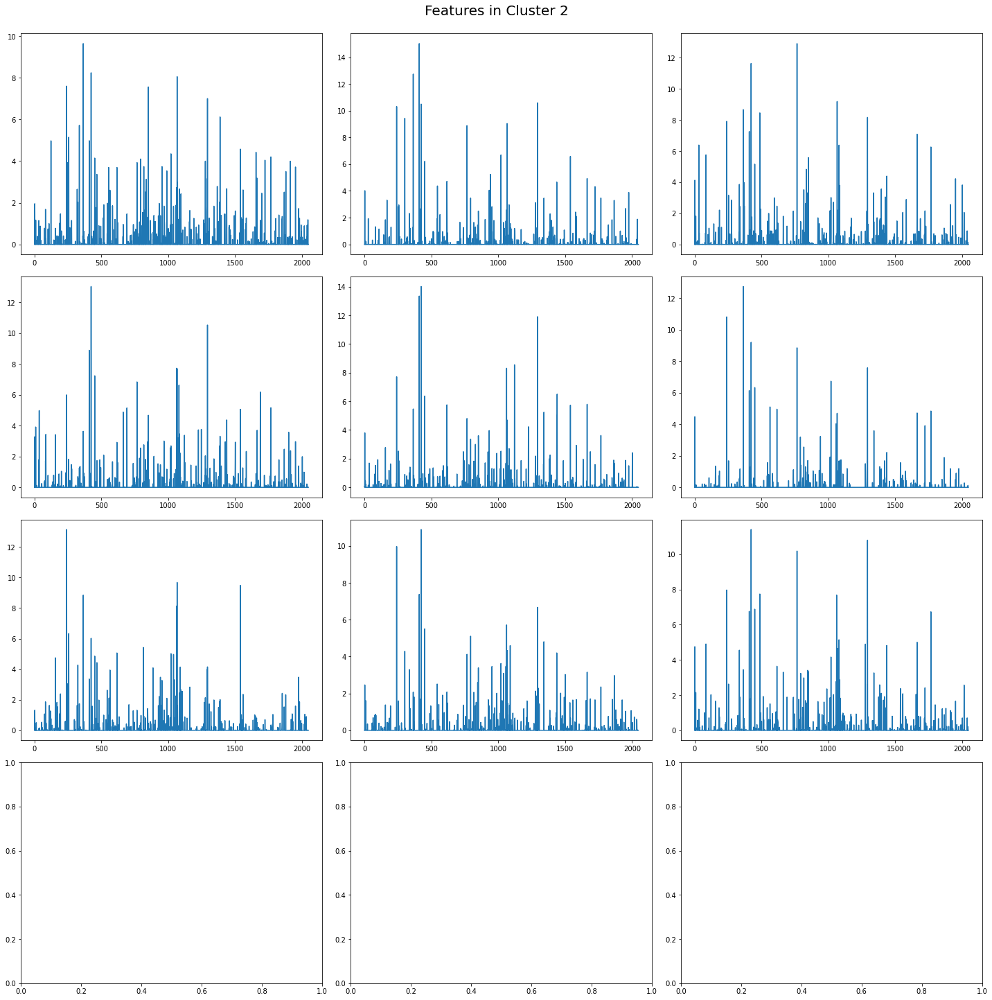

Total number of rivers in cluster 3 :  (24, 2048)


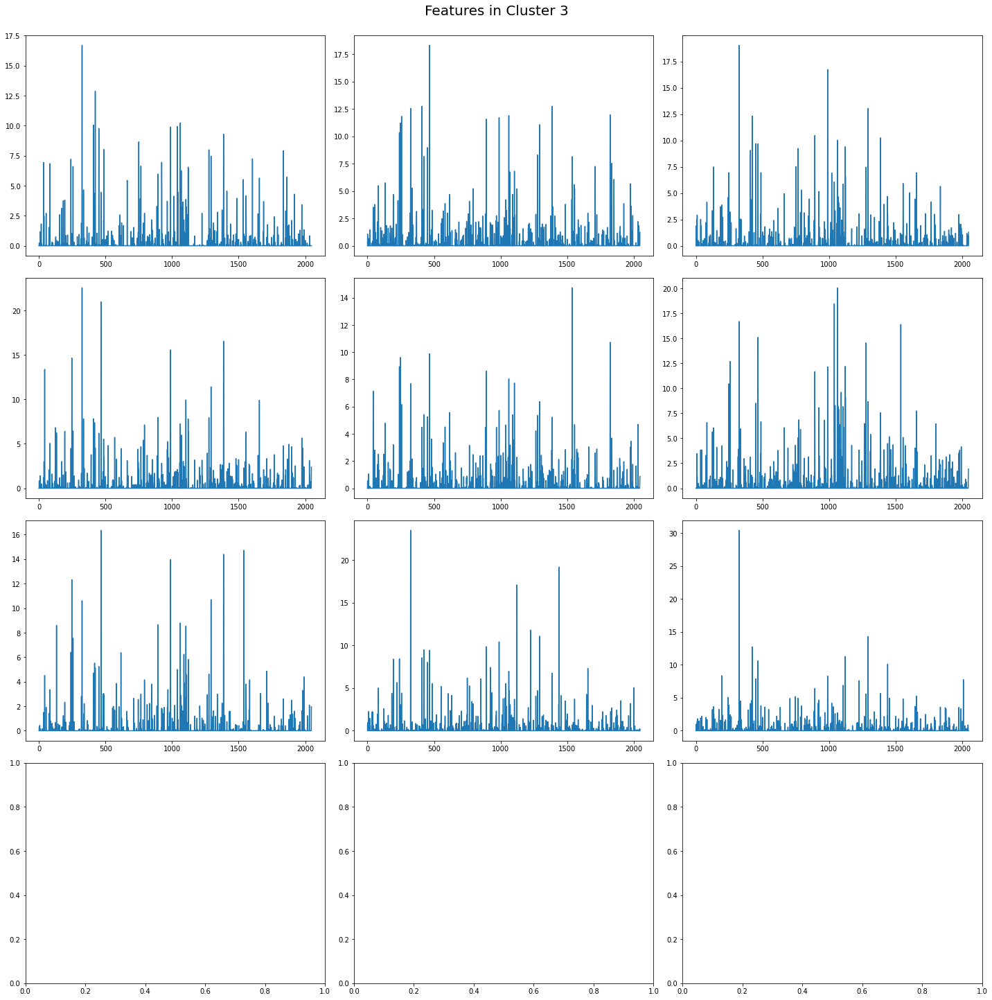

Total number of rivers in cluster 4 :  (65, 2048)


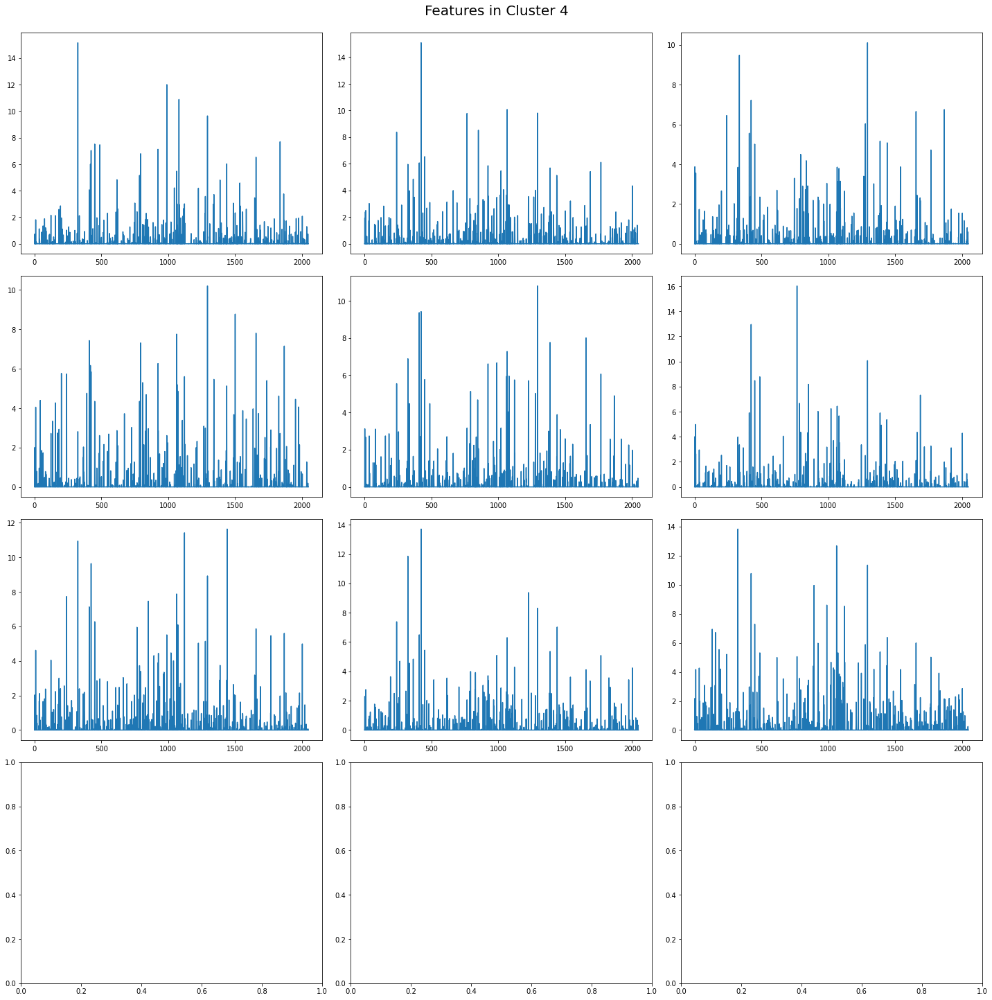

Total number of rivers in cluster 5 :  (56, 2048)


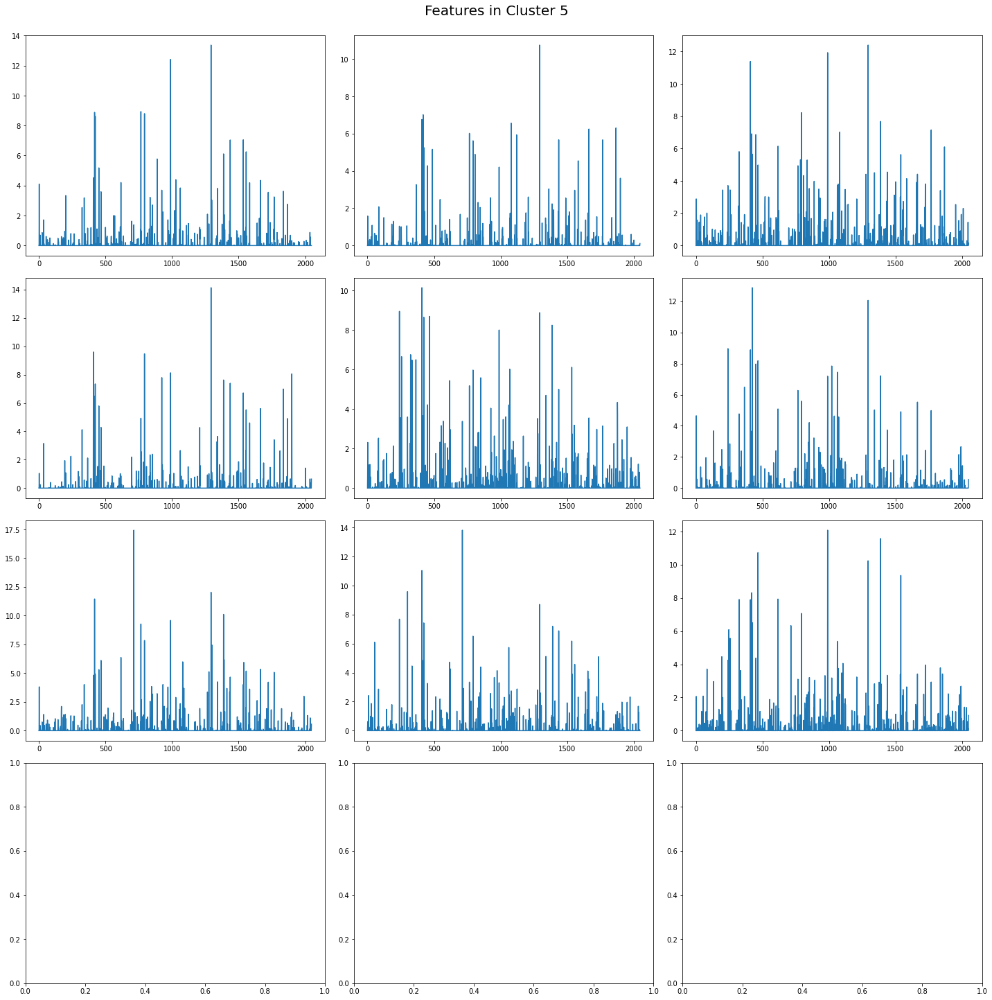

Total number of rivers in cluster 6 :  (28, 2048)


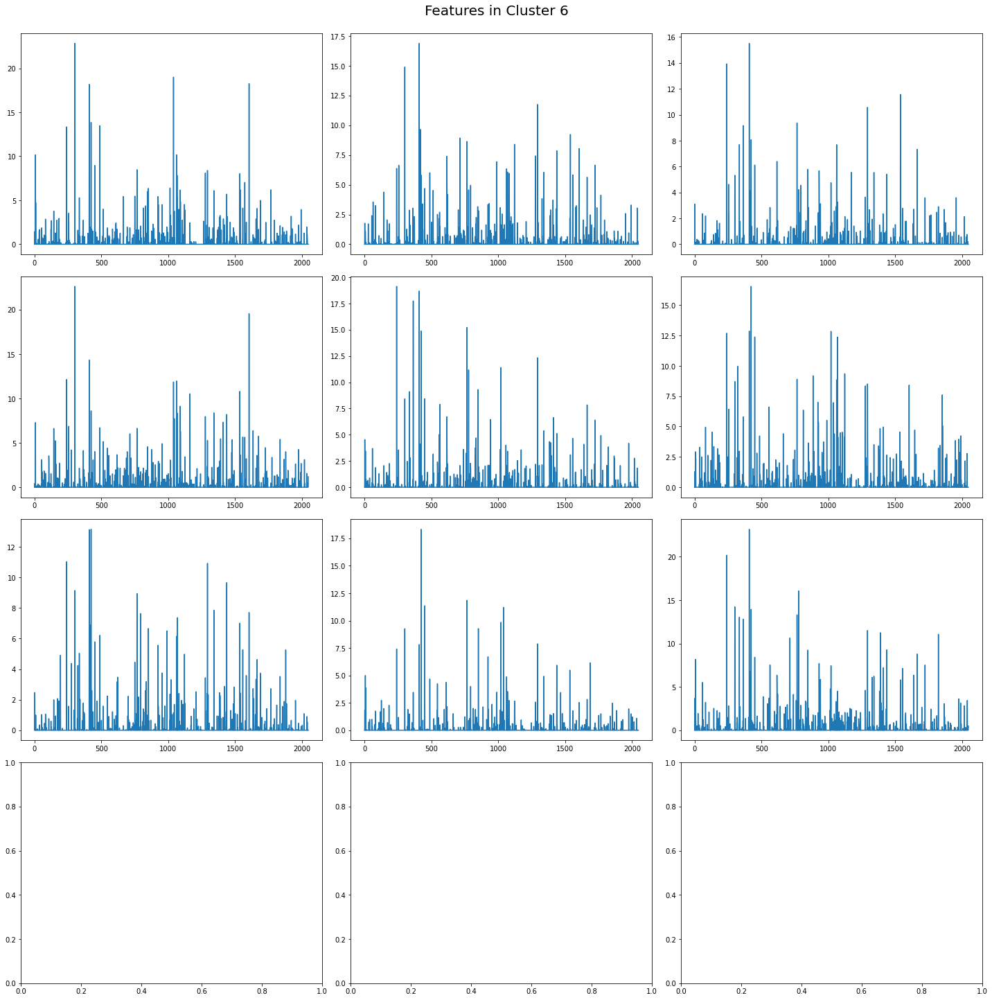

Similarity to centroid  0 :   [0.84743714 0.7434035  0.8851154 ]
Similarity to centroid  1 :   [0.803852   0.77484006 0.8221176 ]
Similarity to centroid  2 :   [0.84427893 0.86085546 0.88527405]
Similarity to centroid  3 :   [0.83312964 0.89356834 0.9225004 ]
Similarity to centroid  4 :   [0.82852095 0.8674367  0.83718216]
Similarity to centroid  5 :   [0.87519187 0.7586554  0.90022147]
Similarity to centroid  6 :   [0.8583231  0.84636766 0.83525014]
Total features selected for centroid 0 :  (1, 13)
Total features selected for centroid 1 :  (1, 40)
Total features selected for centroid 2 :  (1, 87)
Total features selected for centroid 3 :  (1, 24)
Total features selected for centroid 4 :  (1, 63)
Total features selected for centroid 5 :  (1, 53)
Total features selected for centroid 6 :  (1, 28)


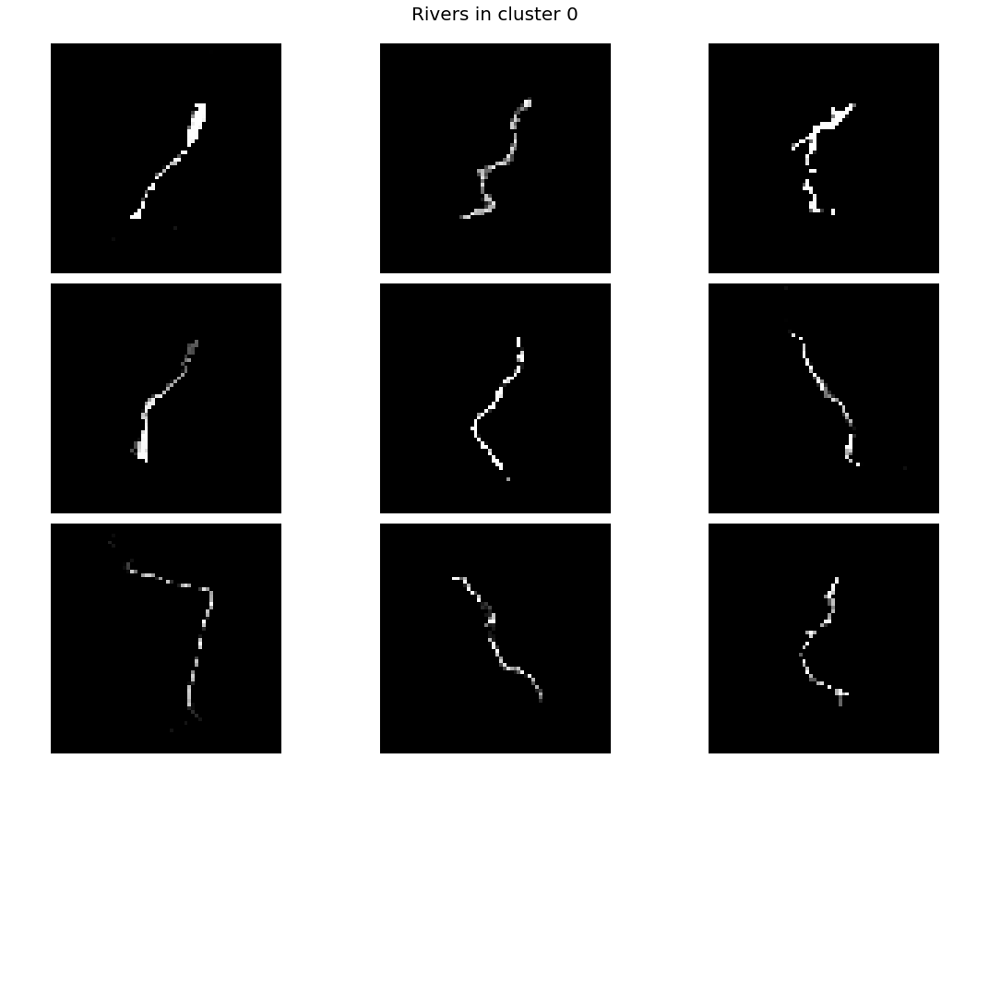

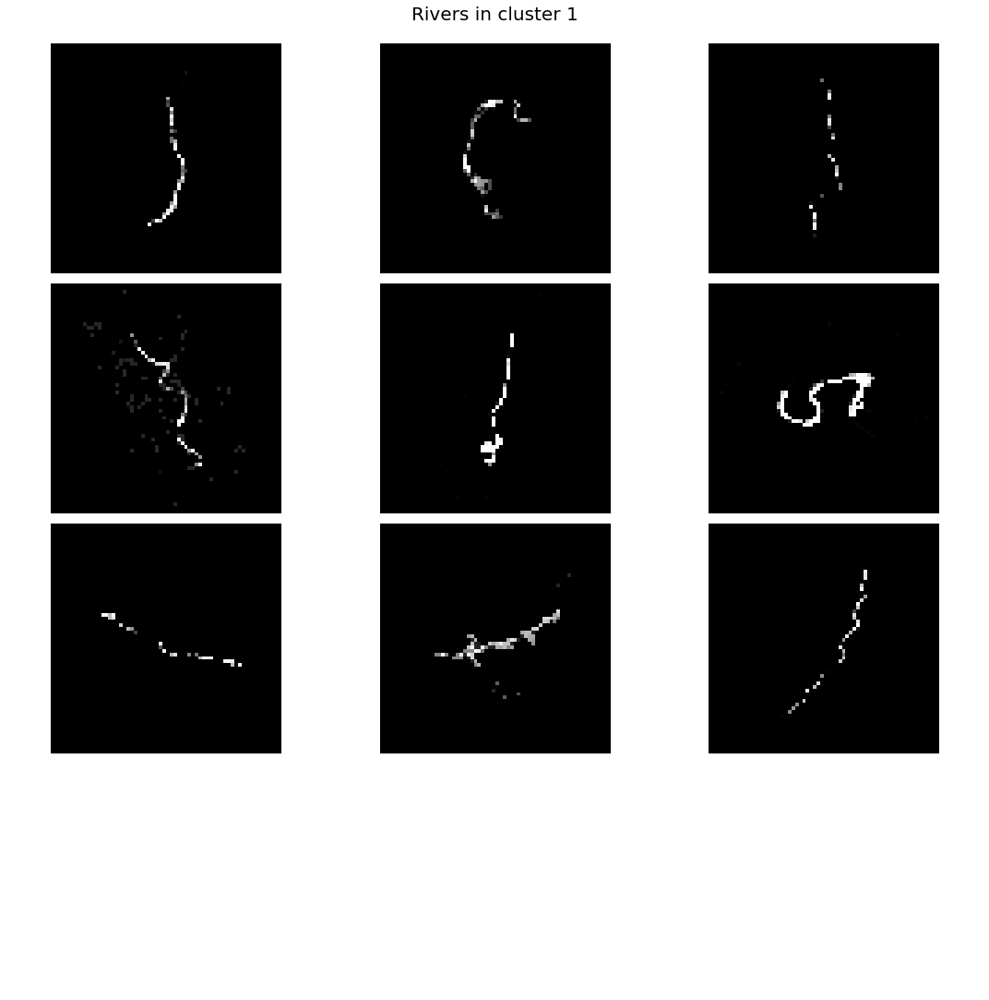

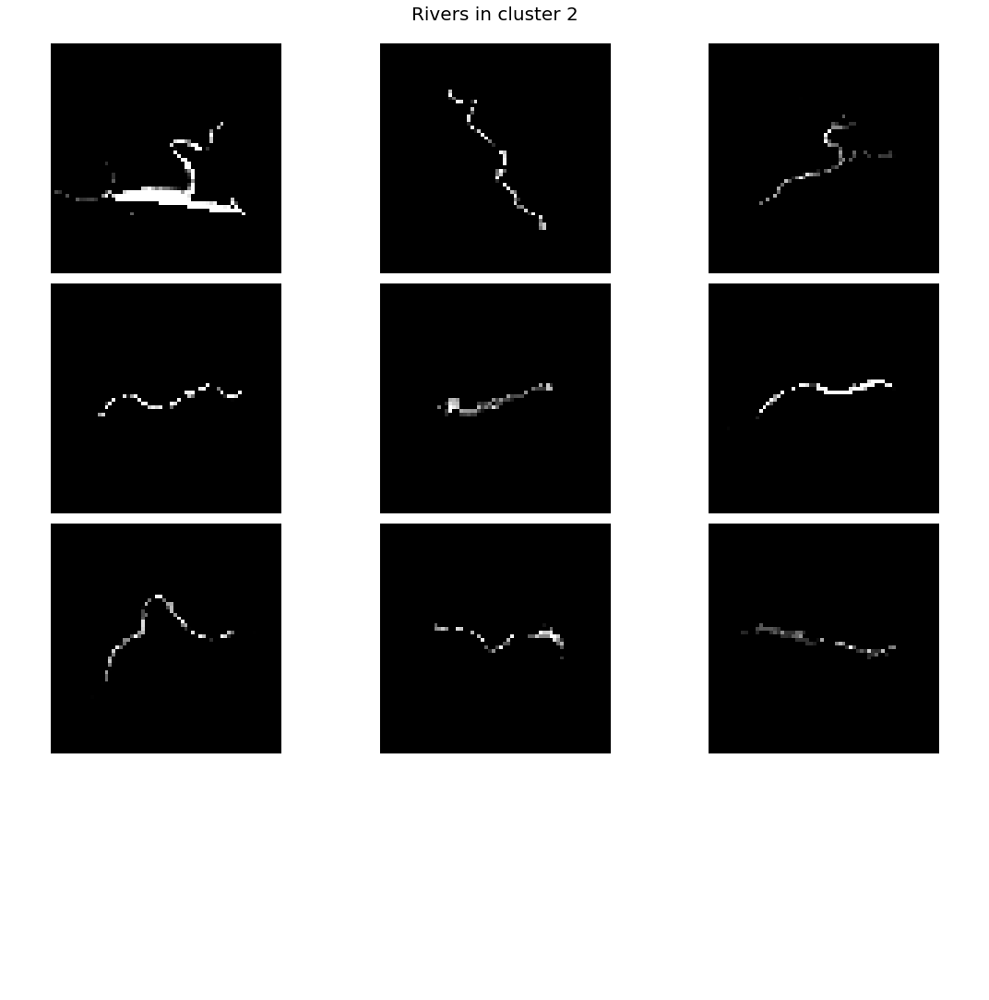

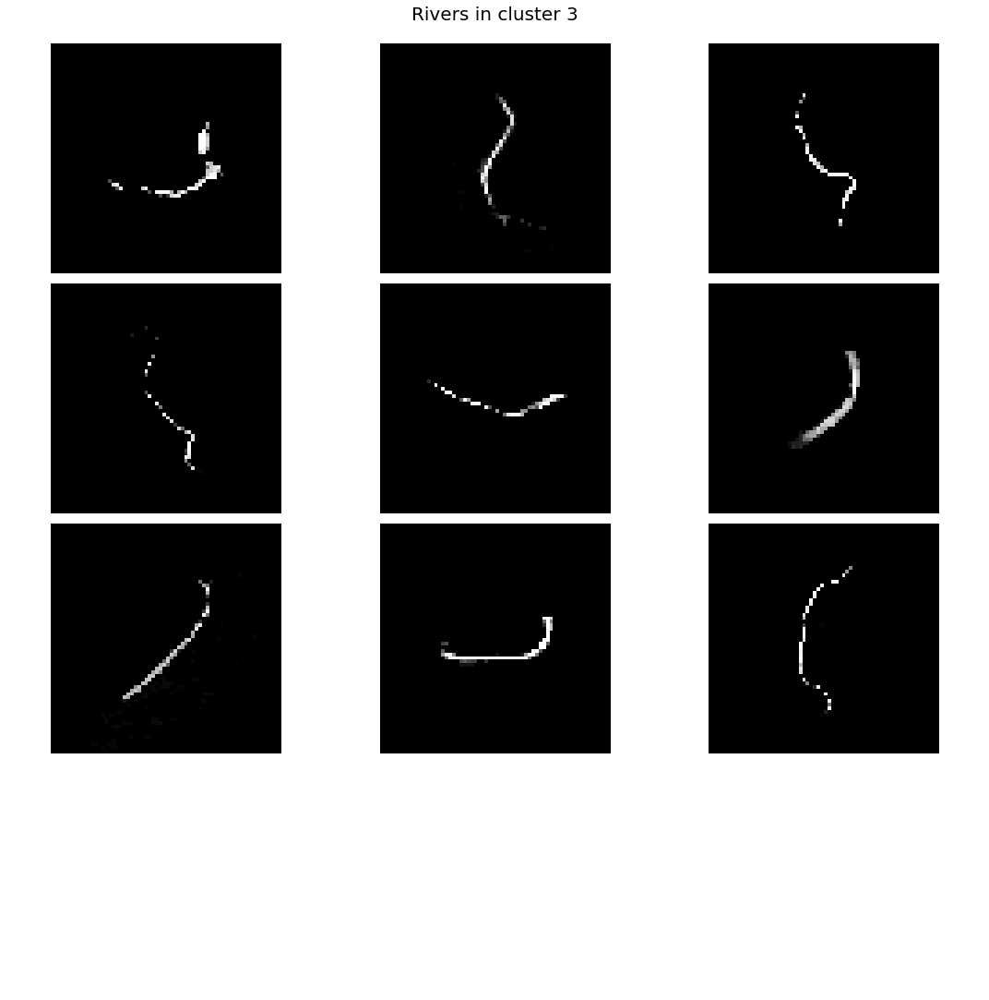

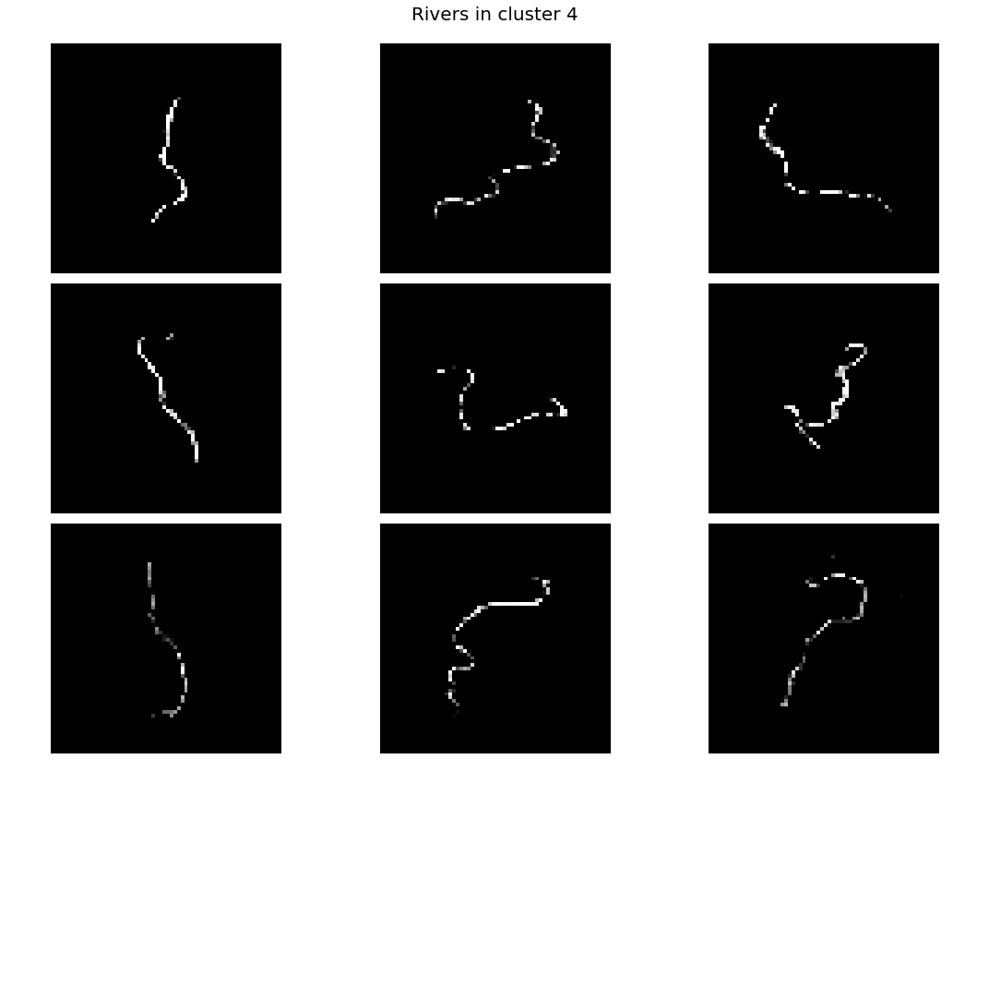

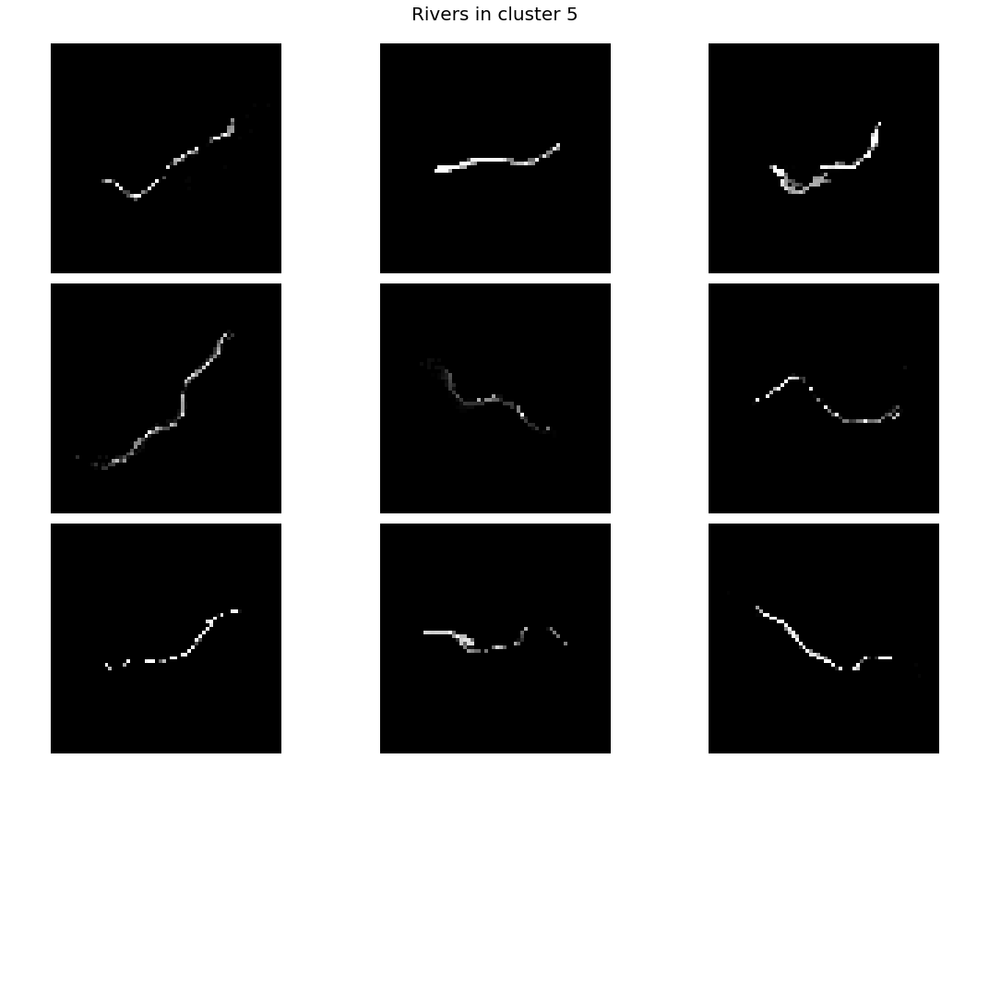

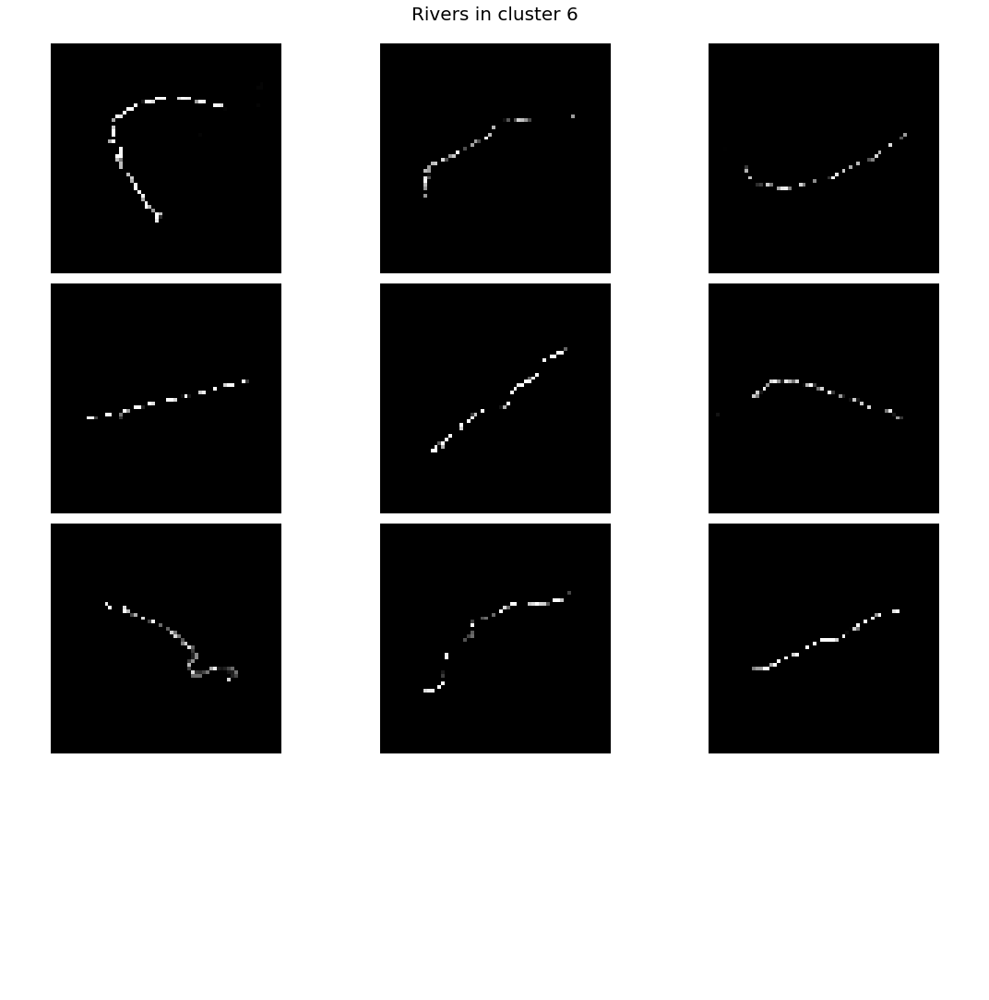

Training images :  (308, 64, 64, 3)
Labels : (308,)
Loss used: categorical_crossentropy, Optimizer used: adam
Epoch 1/5
16/16 [==============================] - 4s 96ms/step - loss: 2.8086 - categorical_crossentropy: 2.8086 - categorical_accuracy: 0.3701
Epoch 2/5
16/16 [==============================] - 2s 94ms/step - loss: 1.1478 - categorical_crossentropy: 1.1478 - categorical_accuracy: 0.6494
Epoch 3/5
16/16 [==============================] - 1s 88ms/step - loss: 0.6764 - categorical_crossentropy: 0.6764 - categorical_accuracy: 0.8539
Epoch 4/5
16/16 [==============================] - 1s 87ms/step - loss: 0.4631 - categorical_crossentropy: 0.4631 - categorical_accuracy: 0.8961
Epoch 5/5
16/16 [==============================] - 1s 88ms/step - loss: 0.3292 - categorical_crossentropy: 0.3292 - categorical_accuracy: 0.9351
Iteration is:  5


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP4_KR_317_UCL_70_7/model/assets


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP4_KR_317_UCL_70_7/model/assets


In [21]:
experiment = 'EXP4_KR_317_UCL_70_7'
threshold = 0.7
clusters = 7
epochs = 5
classes = clusters 
ucl_model = select_model(classes,'softmax')['ucl_model']

tot_iterations = 5
ucl_experiments(ucl_model, plt, clusters, threshold, epochs,tot_iterations)

KerasTensor(type_spec=TensorSpec(shape=(None, 2048), dtype=tf.float32, name=None), name='avg_pool/Mean:0', description="created by layer 'avg_pool'")
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_8 (Flatten)         (None, 2048)              0         
                                                                 
 dense_16 (Dense)            (None, 128)               262272    
                                                                 
 dense_17 (Dense)            (None, 1)                 129       
                                                                 
Total params: 23,827,201
Trainable params: 262,401
Non-trainable params: 23,564,800
_________________________________________________________________
None
 <function so

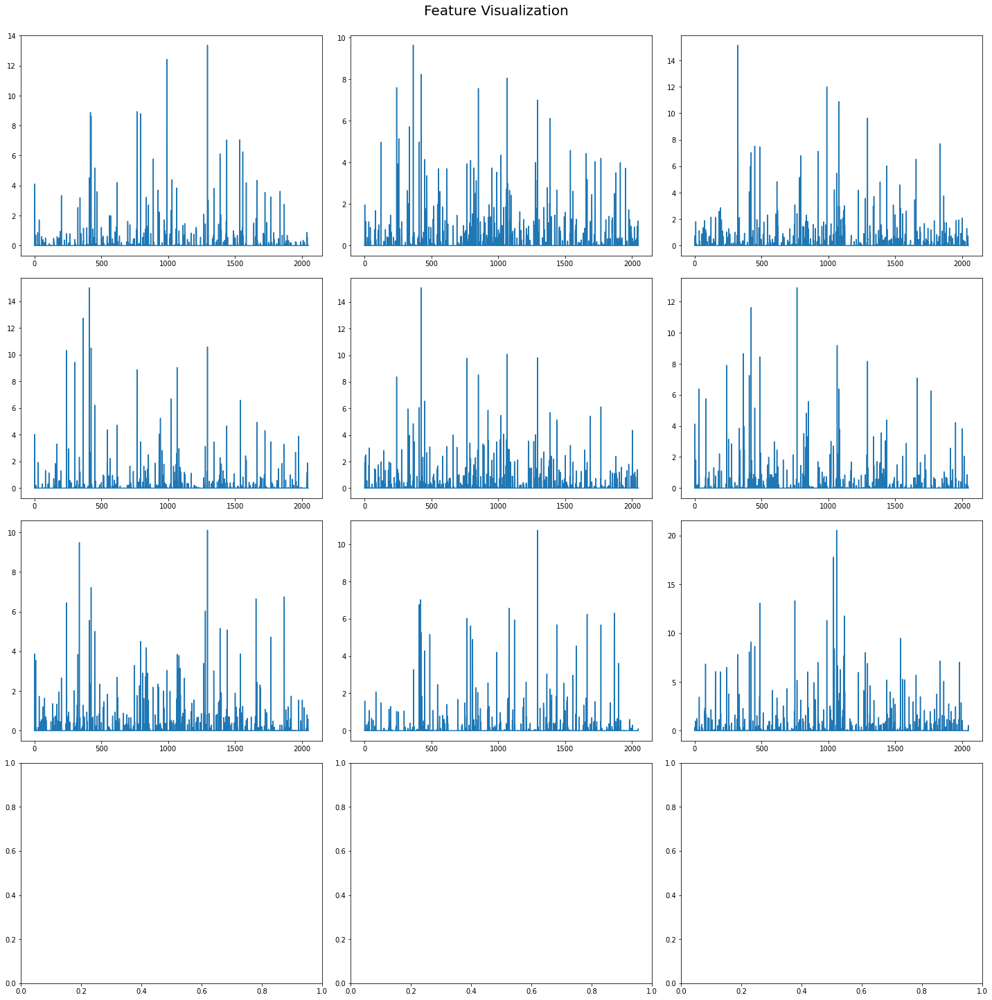

Kmeans cluster centers:  [[3.5495490e-02 7.0562363e-02 1.5272963e+00 ... 0.0000000e+00
  2.1787184e-01 5.4779458e-01]
 [5.8289617e-04 3.1711832e-02 2.3750672e+00 ... 0.0000000e+00
  1.3064593e-02 7.3591784e-02]]
Total number of rivers in cluster 0 :  (89, 2048)


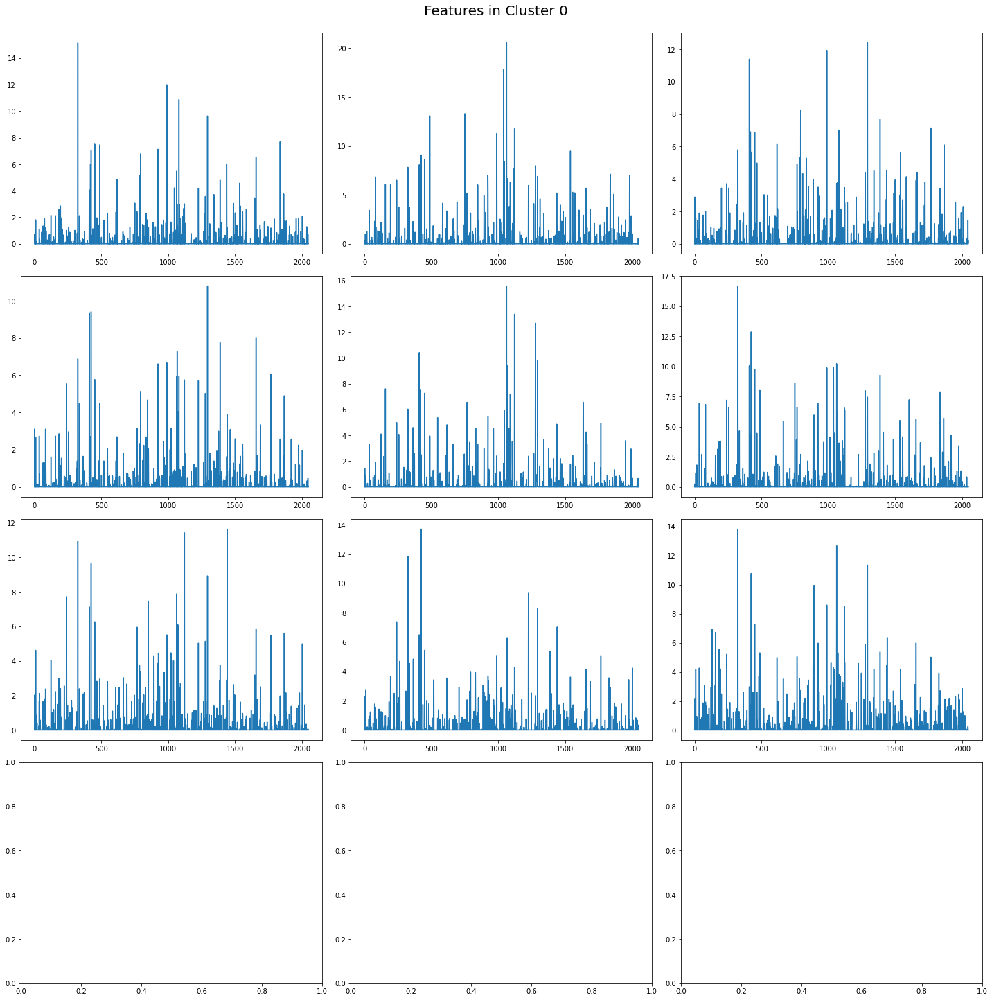

Total number of rivers in cluster 1 :  (228, 2048)


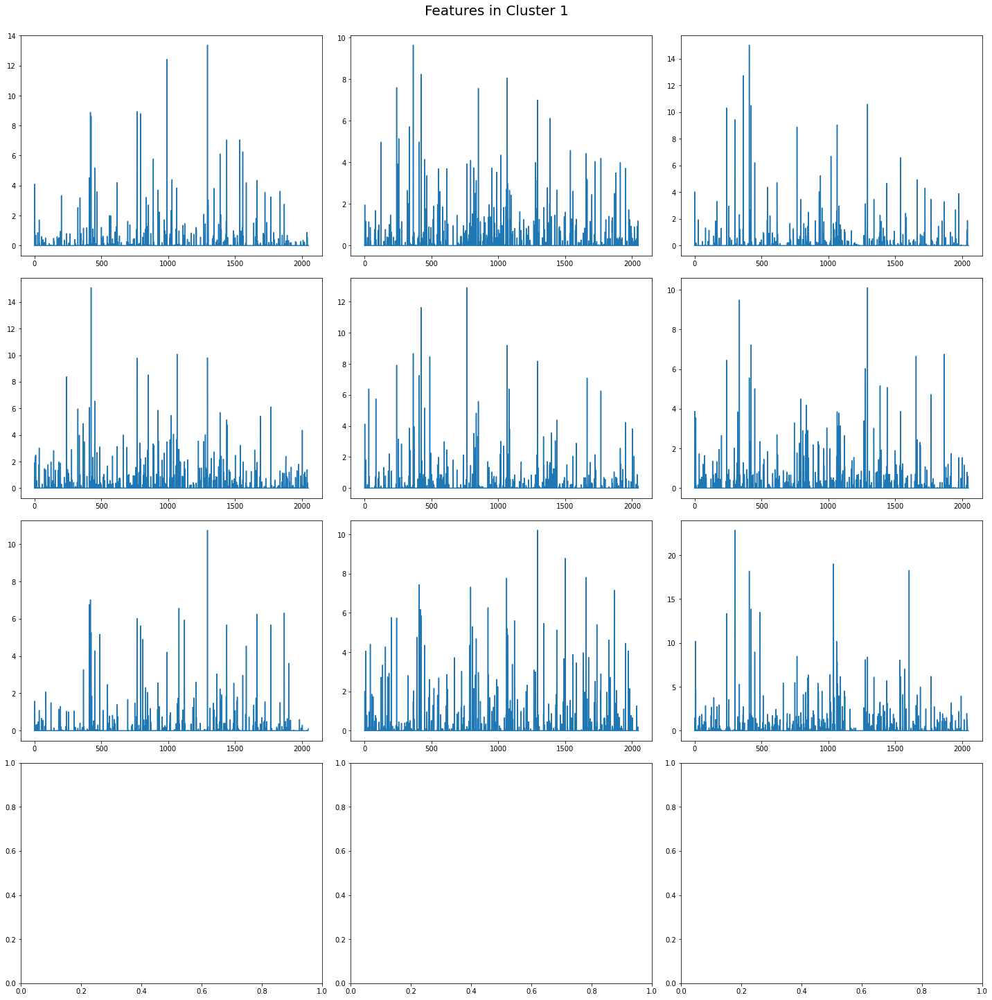

Similarity to centroid  0 :   [0.8272183  0.80039835 0.8014546 ]
Similarity to centroid  1 :   [0.6973561 0.8283762 0.8446409]
Total features selected for centroid 0 :  (1, 51)
Total features selected for centroid 1 :  (1, 95)


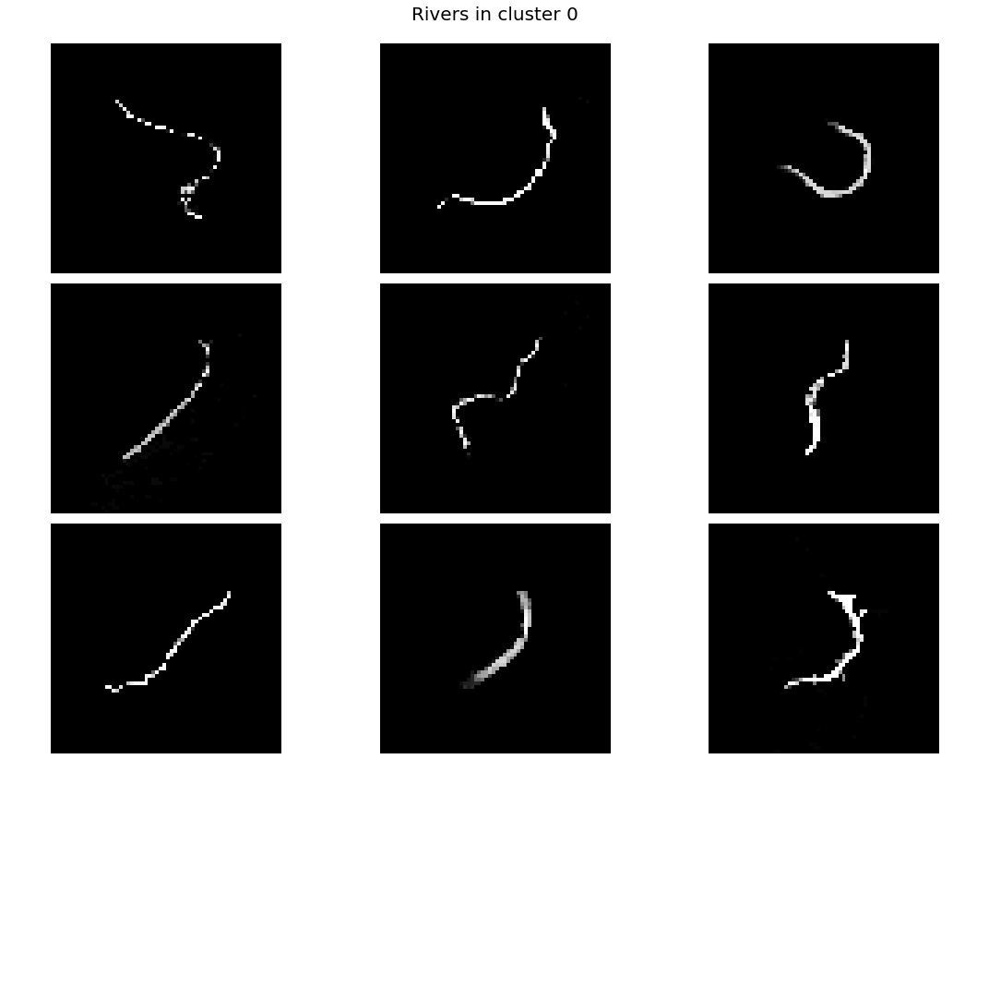

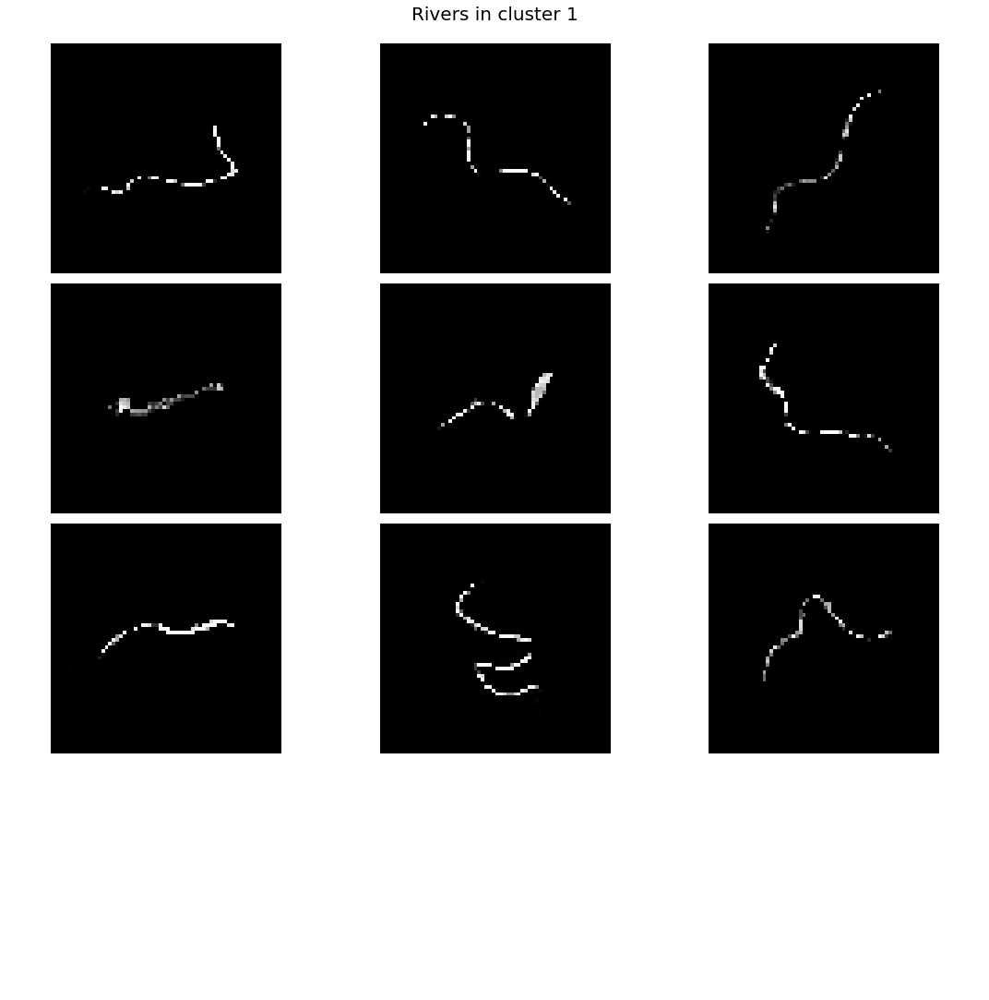

Training images :  (146, 64, 64, 3)
Labels : (146,)
Loss used: binary_crossentropy, Optimizer used: adam
Metrics Chosen:  [<keras.metrics.metrics.BinaryCrossentropy object at 0x7fb93188db10>, <keras.metrics.metrics.BinaryAccuracy object at 0x7fb9138bea10>]
Epoch 1/5
8/8 [==============================] - 3s 91ms/step - loss: 0.6998 - binary_crossentropy: 0.6998 - binary_accuracy: 0.5000
Epoch 2/5
8/8 [==============================] - 1s 101ms/step - loss: 0.6980 - binary_crossentropy: 0.6980 - binary_accuracy: 0.5000
Epoch 3/5
8/8 [==============================] - 1s 91ms/step - loss: 0.6963 - binary_crossentropy: 0.6963 - binary_accuracy: 0.5000
Epoch 4/5
8/8 [==============================] - 1s 90ms/step - loss: 0.6947 - binary_crossentropy: 0.6947 - binary_accuracy: 0.5000
Epoch 5/5
8/8 [==============================] - 1s 92ms/step - loss: 0.6949 - binary_crossentropy: 0.6949 - binary_accuracy: 0.5000
Iteration is:  5


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP5_KR_317_UCL_80_2/model/assets


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP5_KR_317_UCL_80_2/model/assets


In [22]:
experiment = 'EXP5_KR_317_UCL_80_2'
threshold = 0.8
clusters = 2
epochs = 5
classes = clusters - 1
ucl_model = select_model(classes,'softmax')['ucl_model']

tot_iterations = 5
ucl_experiments(ucl_model, plt, clusters, threshold, epochs,tot_iterations)

KerasTensor(type_spec=TensorSpec(shape=(None, 2048), dtype=tf.float32, name=None), name='avg_pool/Mean:0', description="created by layer 'avg_pool'")
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_9 (Flatten)         (None, 2048)              0         
                                                                 
 dense_18 (Dense)            (None, 128)               262272    
                                                                 
 dense_19 (Dense)            (None, 3)                 387       
                                                                 
Total params: 23,827,459
Trainable params: 262,659
Non-trainable params: 23,564,800
_________________________________________________________________
None
 <function so

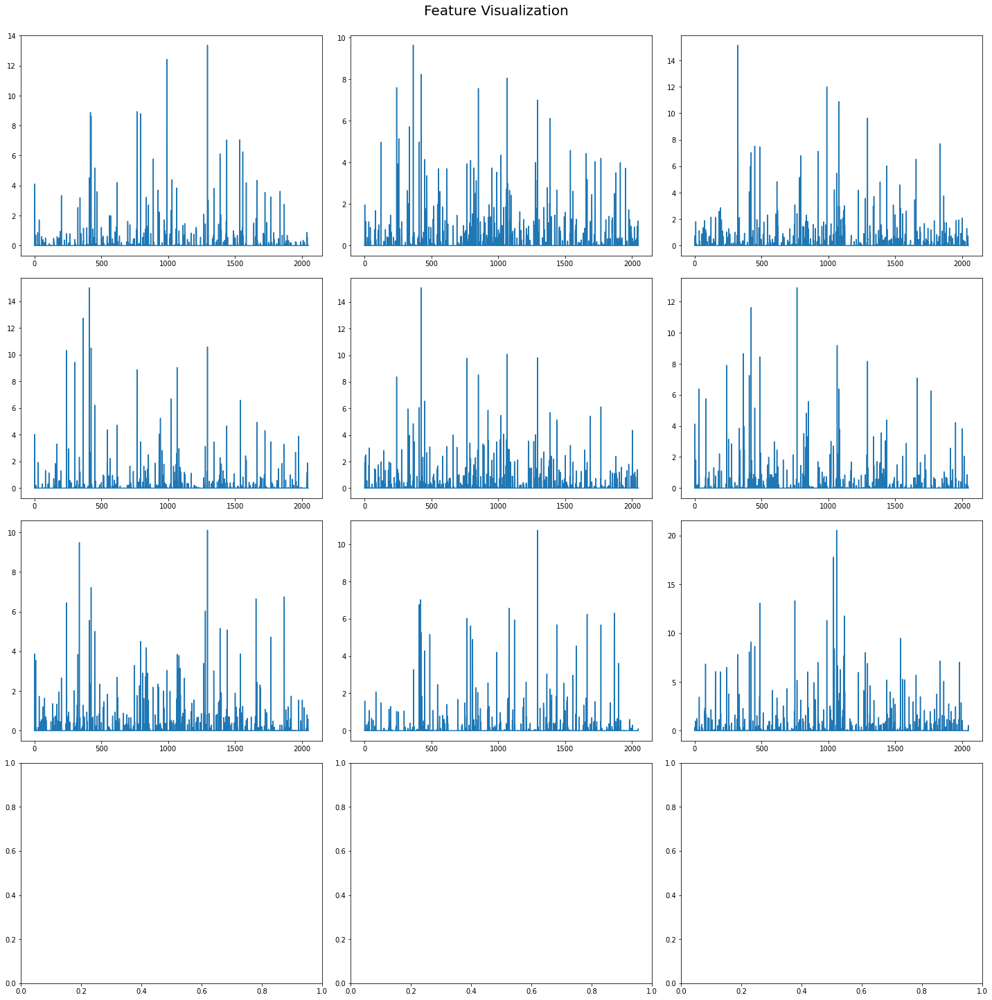

Kmeans cluster centers:  [[1.1393633e-03 2.9205929e-02 1.5799866e+00 ... 0.0000000e+00
  7.4458115e-02 1.4210121e-01]
 [3.0327309e-04 2.9134568e-02 2.5941043e+00 ... 0.0000000e+00
  4.0620491e-03 7.1195051e-02]
 [4.5784049e-02 9.1015205e-02 1.5084192e+00 ... 0.0000000e+00
  2.3919711e-01 6.2295306e-01]]
Total number of rivers in cluster 0 :  (69, 2048)


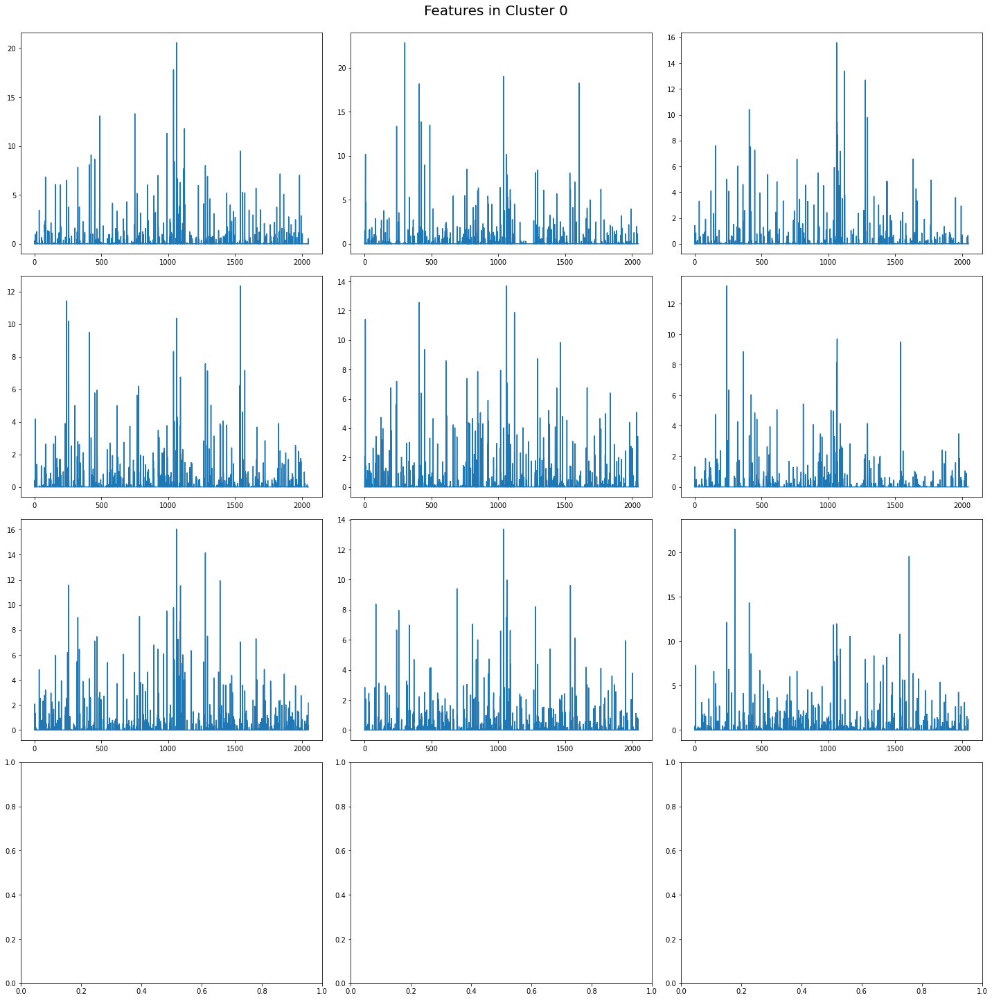

Total number of rivers in cluster 1 :  (179, 2048)


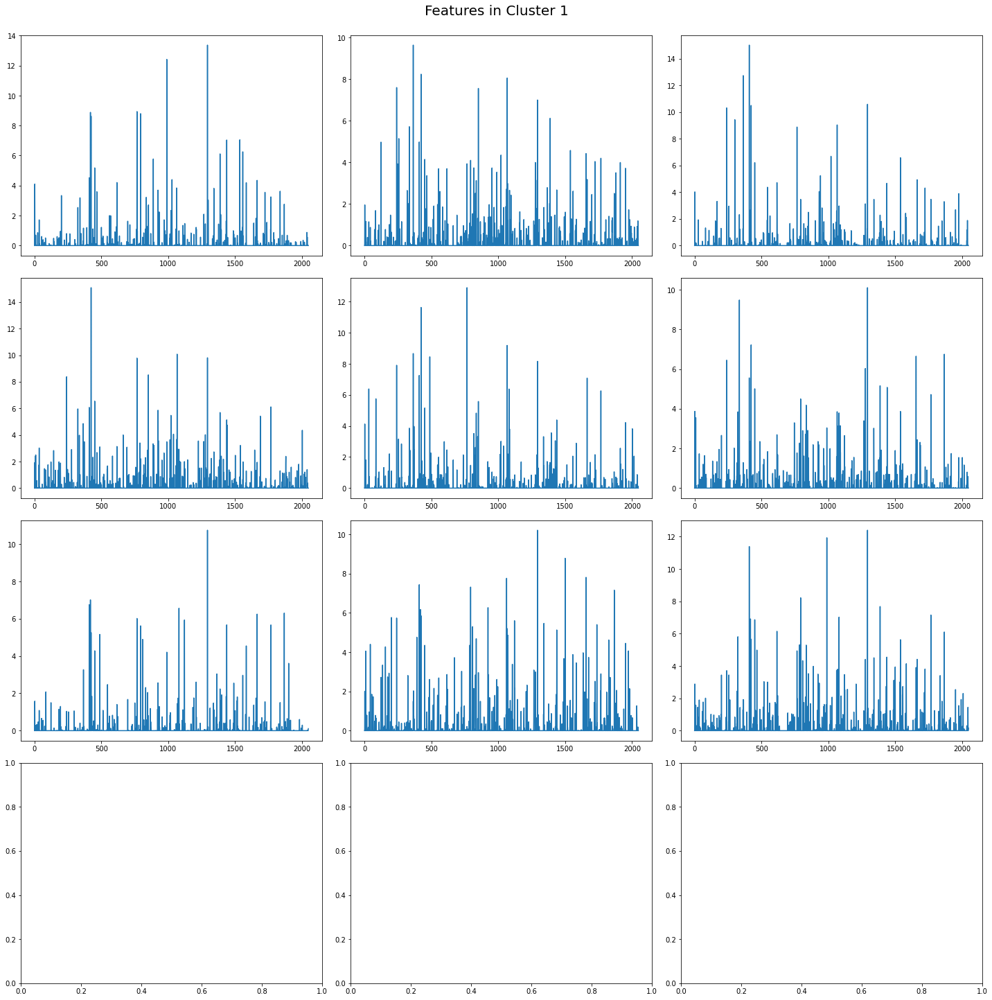

Total number of rivers in cluster 2 :  (69, 2048)


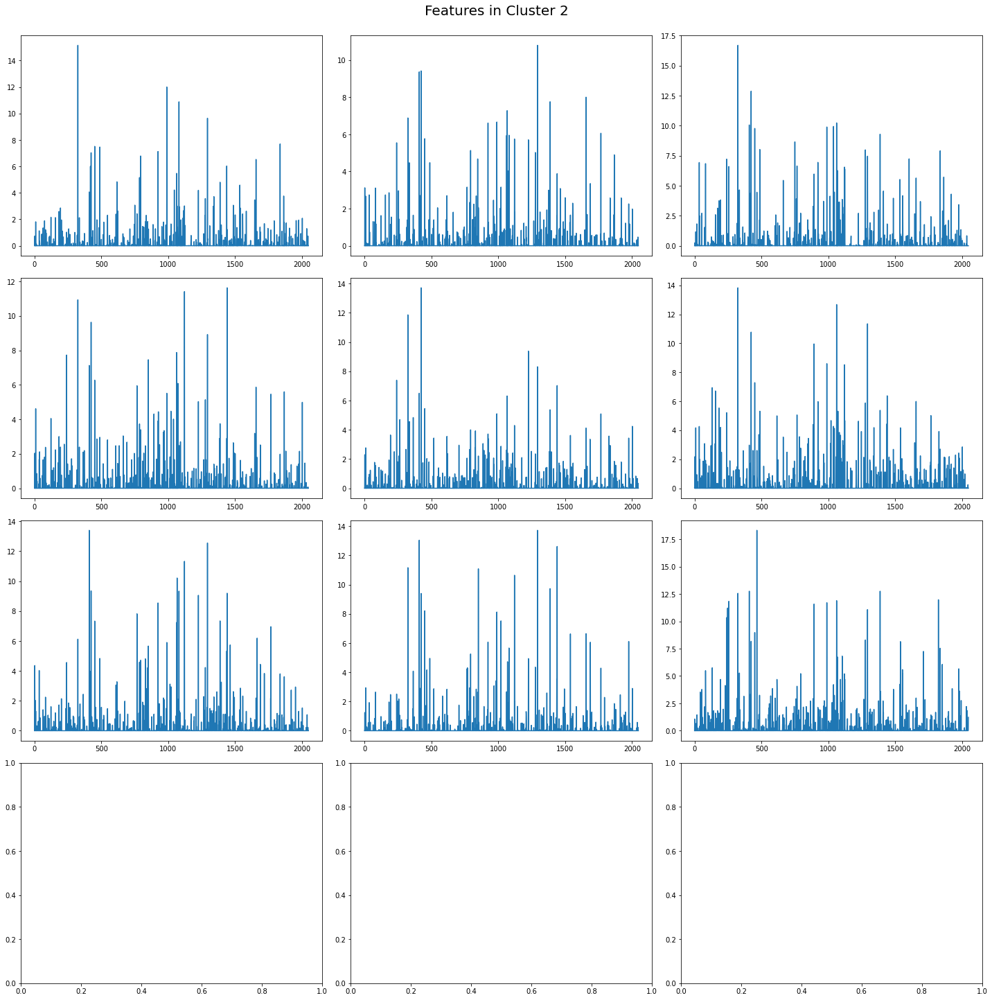

Similarity to centroid  0 :   [0.8101811  0.77310216 0.75282943]
Similarity to centroid  1 :   [0.74255836 0.82544804 0.8625    ]
Similarity to centroid  2 :   [0.8326806 0.8615604 0.8794697]
Total features selected for centroid 0 :  (1, 31)
Total features selected for centroid 1 :  (1, 100)
Total features selected for centroid 2 :  (1, 47)


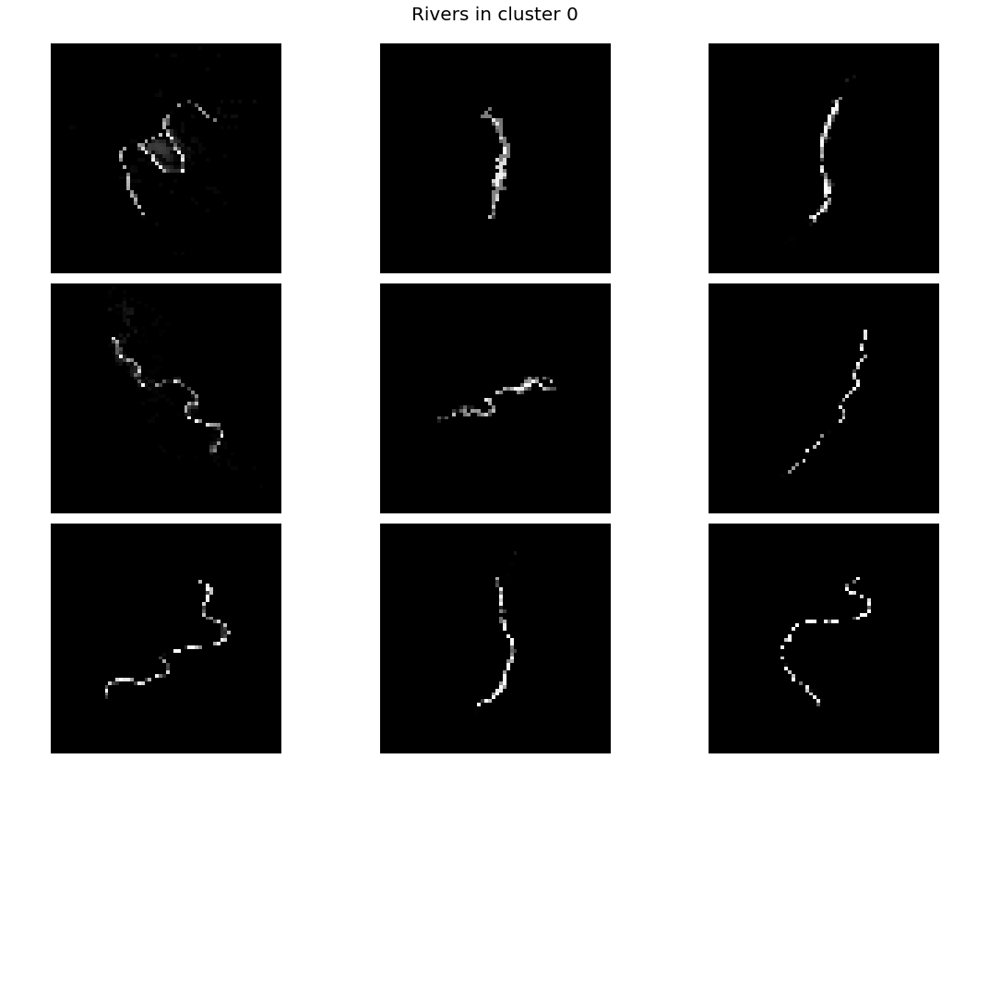

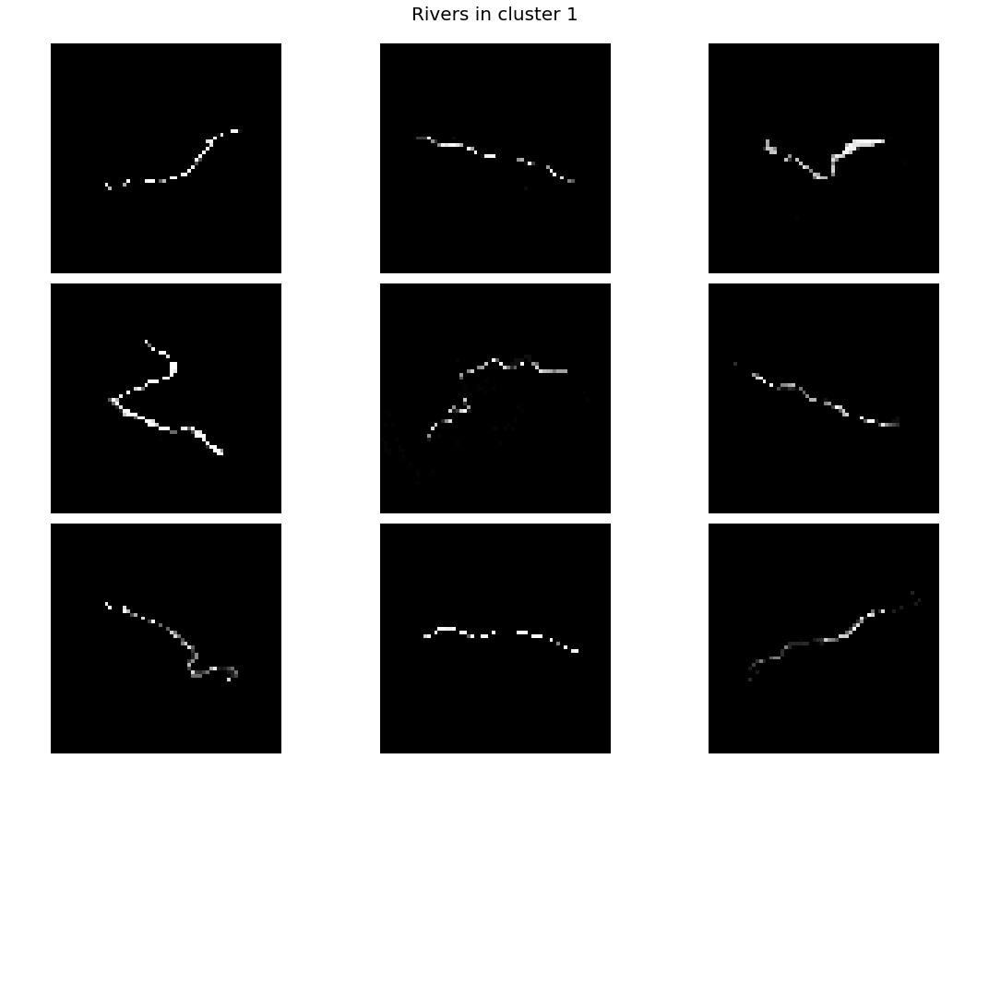

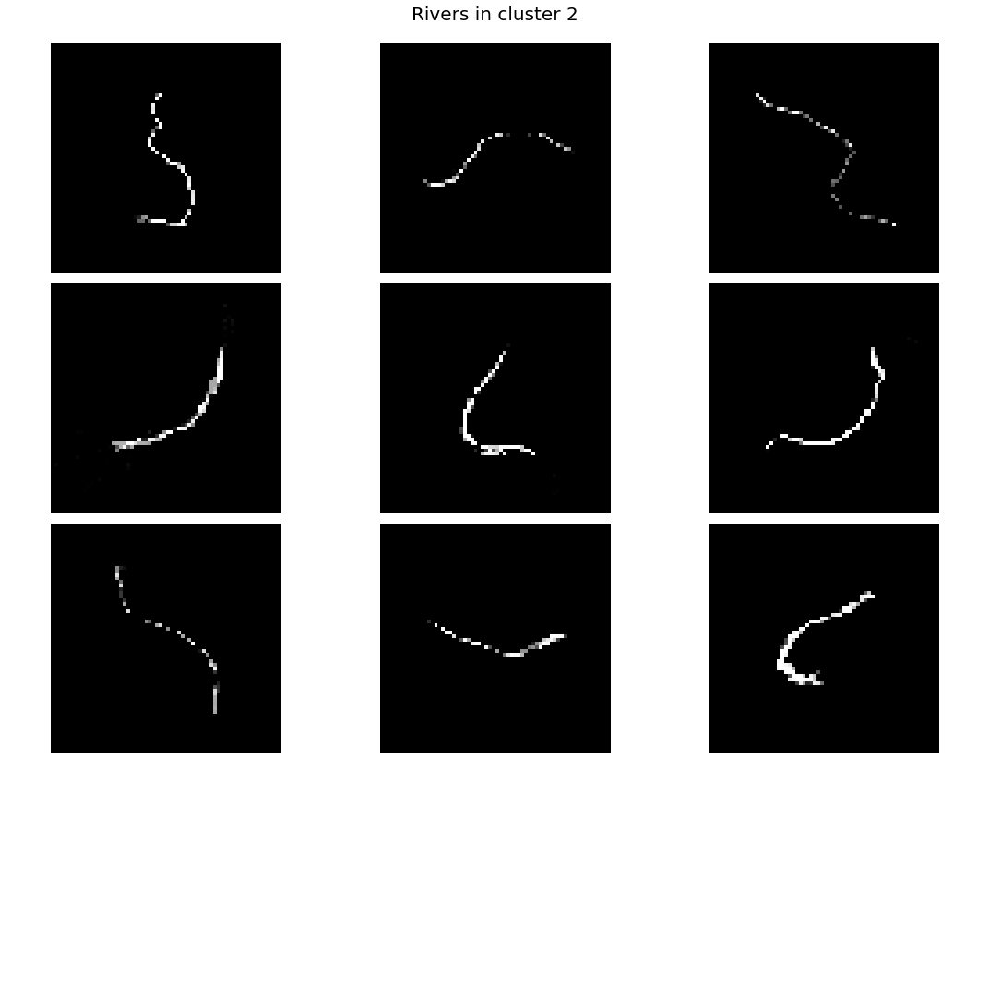

Training images :  (178, 64, 64, 3)
Labels : (178,)
Loss used: categorical_crossentropy, Optimizer used: adam
Epoch 1/5
9/9 [==============================] - 3s 99ms/step - loss: 2.0930 - categorical_crossentropy: 2.0930 - categorical_accuracy: 0.3483
Epoch 2/5
9/9 [==============================] - 1s 99ms/step - loss: 1.0731 - categorical_crossentropy: 1.0731 - categorical_accuracy: 0.6685
Epoch 3/5
9/9 [==============================] - 1s 98ms/step - loss: 0.7285 - categorical_crossentropy: 0.7285 - categorical_accuracy: 0.8034
Epoch 4/5
9/9 [==============================] - 1s 91ms/step - loss: 0.5095 - categorical_crossentropy: 0.5095 - categorical_accuracy: 0.8146
Epoch 5/5
9/9 [==============================] - 1s 91ms/step - loss: 0.3479 - categorical_crossentropy: 0.3479 - categorical_accuracy: 0.8820
Iteration is:  5


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP6_KR_317_UCL_80_3/model/assets


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP6_KR_317_UCL_80_3/model/assets


In [23]:
experiment = 'EXP6_KR_317_UCL_80_3'
threshold = 0.8
clusters = 3
epochs = 5
classes = clusters 
ucl_model = select_model(classes,'softmax')['ucl_model']

tot_iterations = 5
ucl_experiments(ucl_model, plt, clusters, threshold, epochs,tot_iterations)

KerasTensor(type_spec=TensorSpec(shape=(None, 2048), dtype=tf.float32, name=None), name='avg_pool/Mean:0', description="created by layer 'avg_pool'")
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_10 (Flatten)        (None, 2048)              0         
                                                                 
 dense_20 (Dense)            (None, 128)               262272    
                                                                 
 dense_21 (Dense)            (None, 4)                 516       
                                                                 
Total params: 23,827,588
Trainable params: 262,788
Non-trainable params: 23,564,800
_________________________________________________________________
None
 <function s

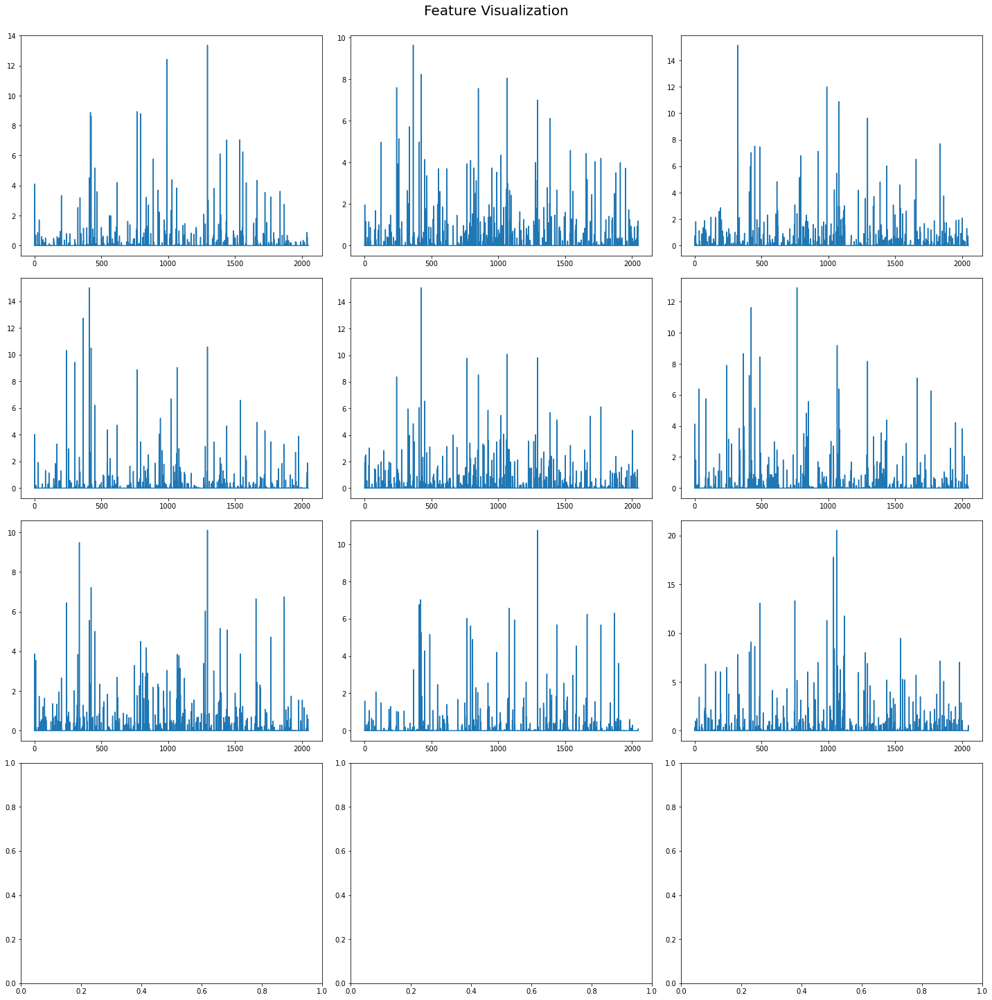

Kmeans cluster centers:  [[3.9809090e-03 1.2523828e-01 2.3668067e+00 ... 0.0000000e+00
  7.4505806e-09 1.5851715e-01]
 [5.4615337e-02 1.0486801e-01 1.3442955e+00 ... 0.0000000e+00
  2.9968467e-01 7.6431173e-01]
 [1.2283754e-03 2.8372511e-02 1.6295656e+00 ... 0.0000000e+00
  6.7254953e-02 1.0101577e-01]
 [3.4142565e-04 6.5563992e-03 2.5591872e+00 ... 0.0000000e+00
  9.9517517e-03 6.8228573e-02]]
Total number of rivers in cluster 0 :  (39, 2048)


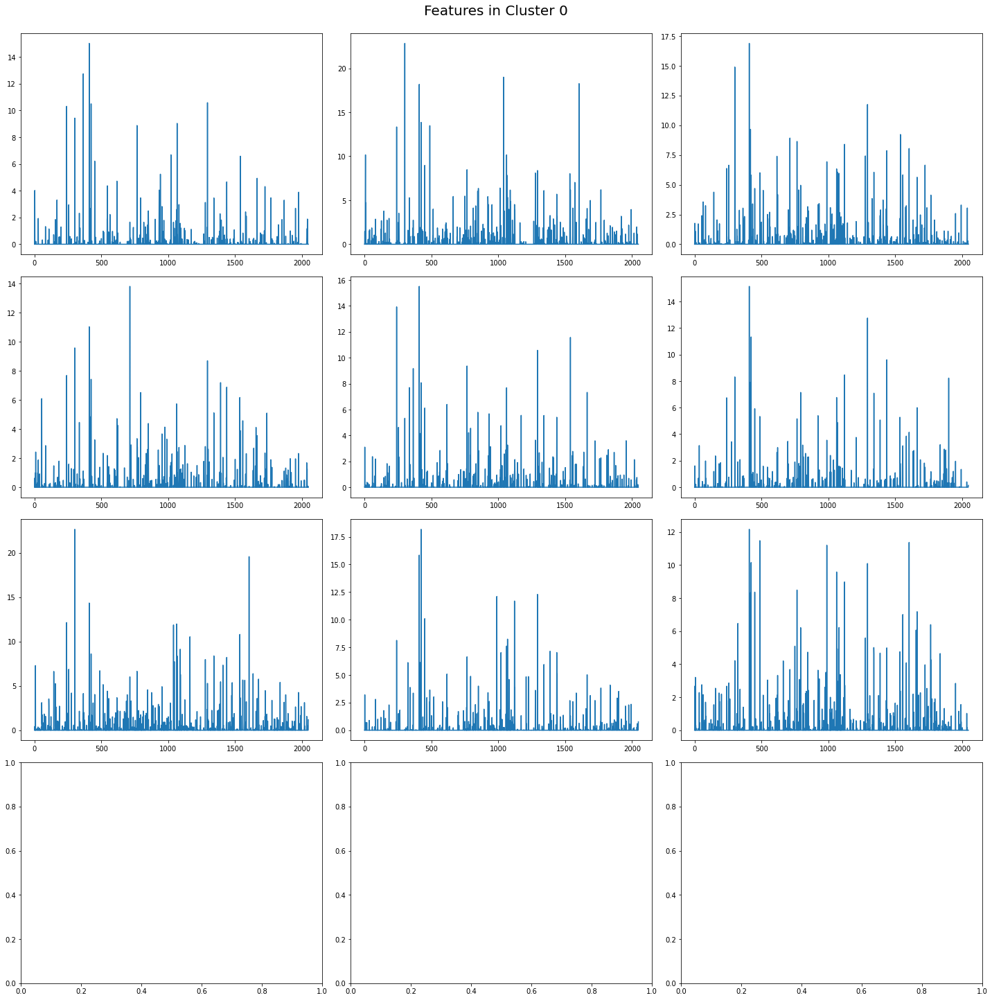

Total number of rivers in cluster 1 :  (55, 2048)


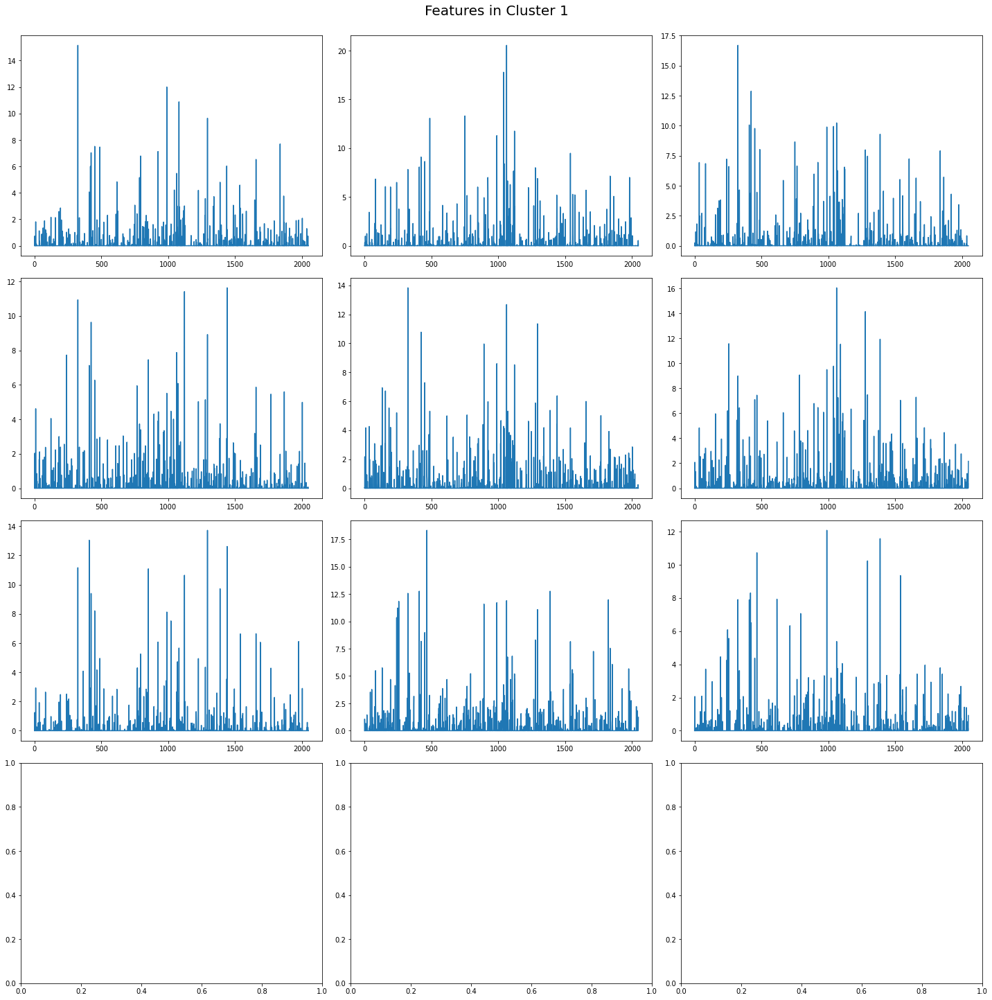

Total number of rivers in cluster 2 :  (64, 2048)


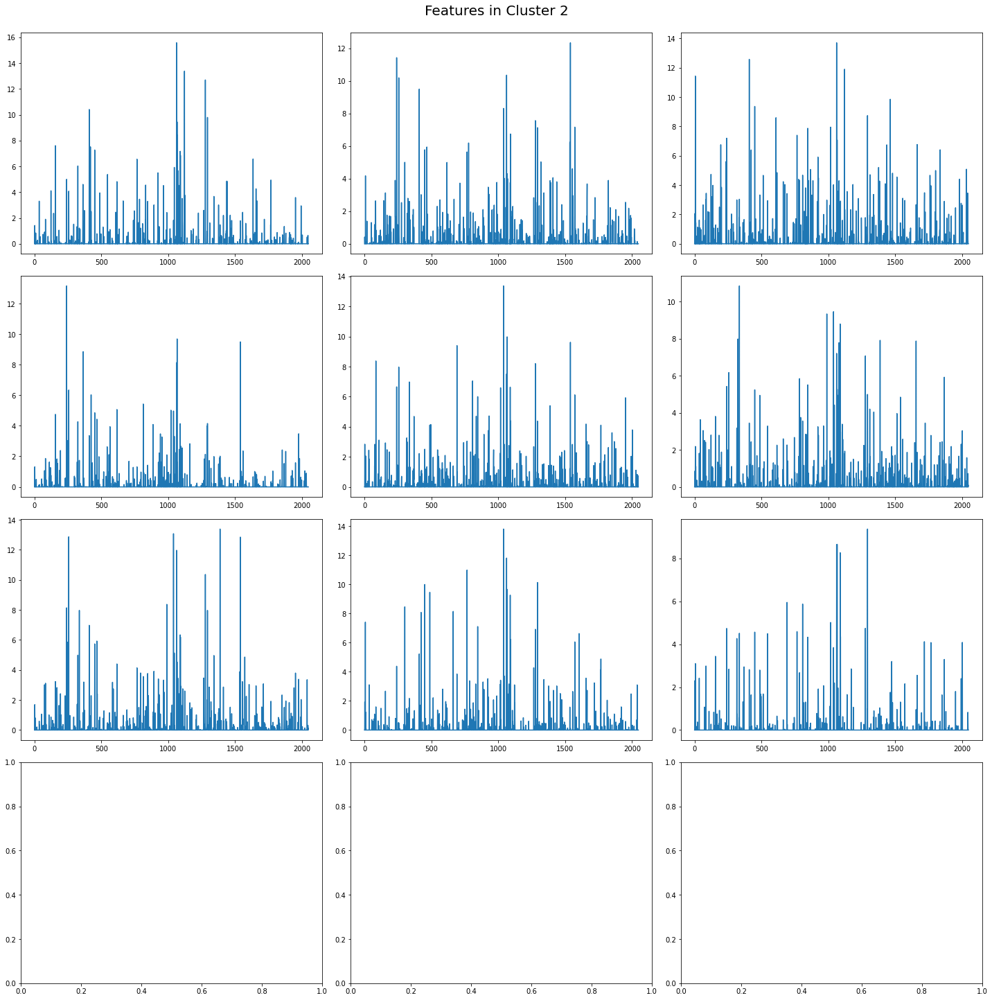

Total number of rivers in cluster 3 :  (159, 2048)


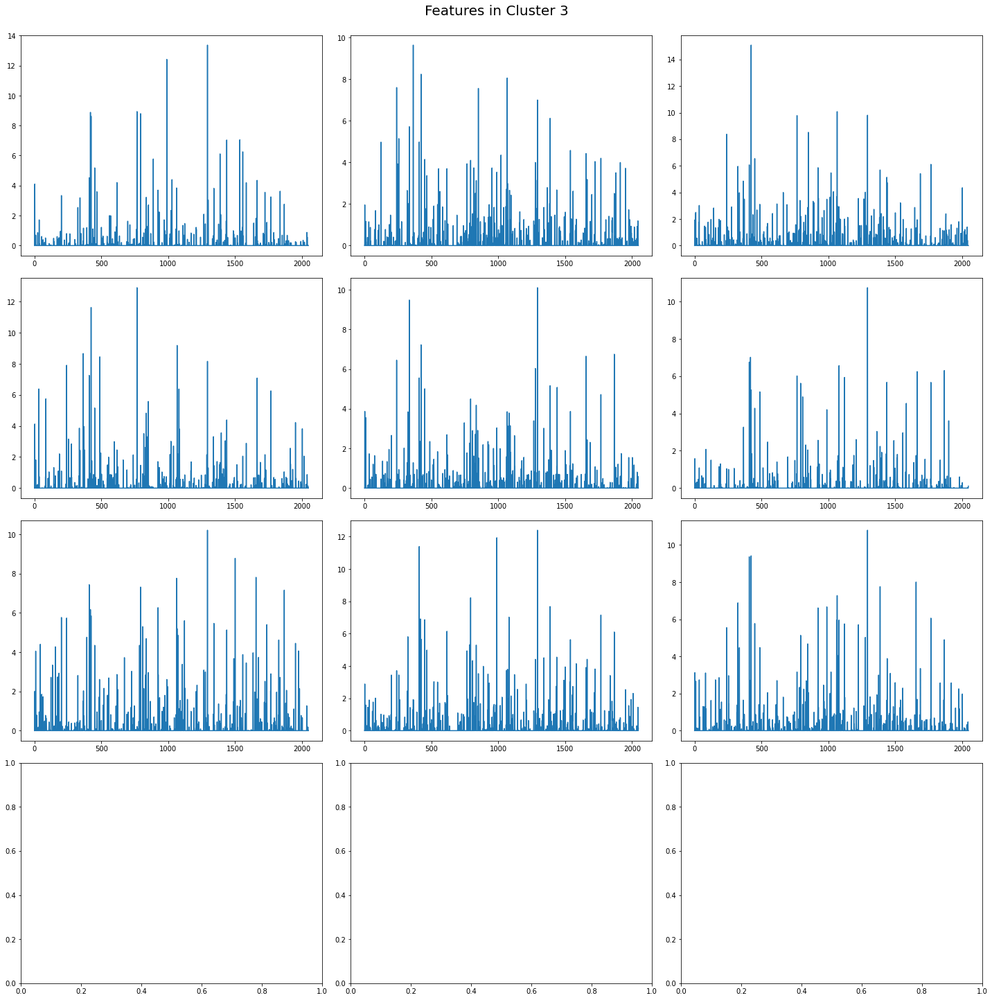

Similarity to centroid  0 :   [0.85460633 0.84414035 0.8620058 ]
Similarity to centroid  1 :   [0.82104677 0.7684204  0.8726306 ]
Similarity to centroid  2 :   [0.7409912  0.7618171  0.68315023]
Similarity to centroid  3 :   [0.75763345 0.83547556 0.8694866 ]
Total features selected for centroid 0 :  (1, 29)
Total features selected for centroid 1 :  (1, 38)
Total features selected for centroid 2 :  (1, 33)
Total features selected for centroid 3 :  (1, 89)


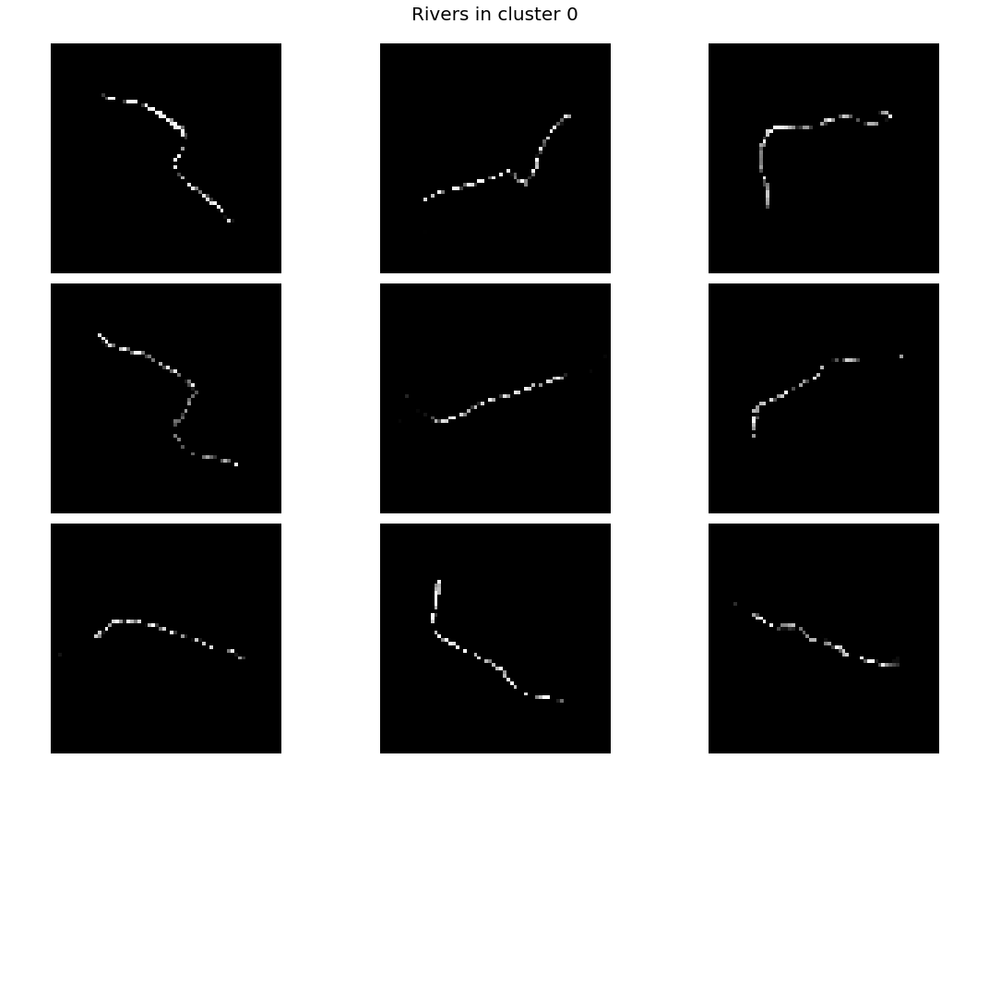

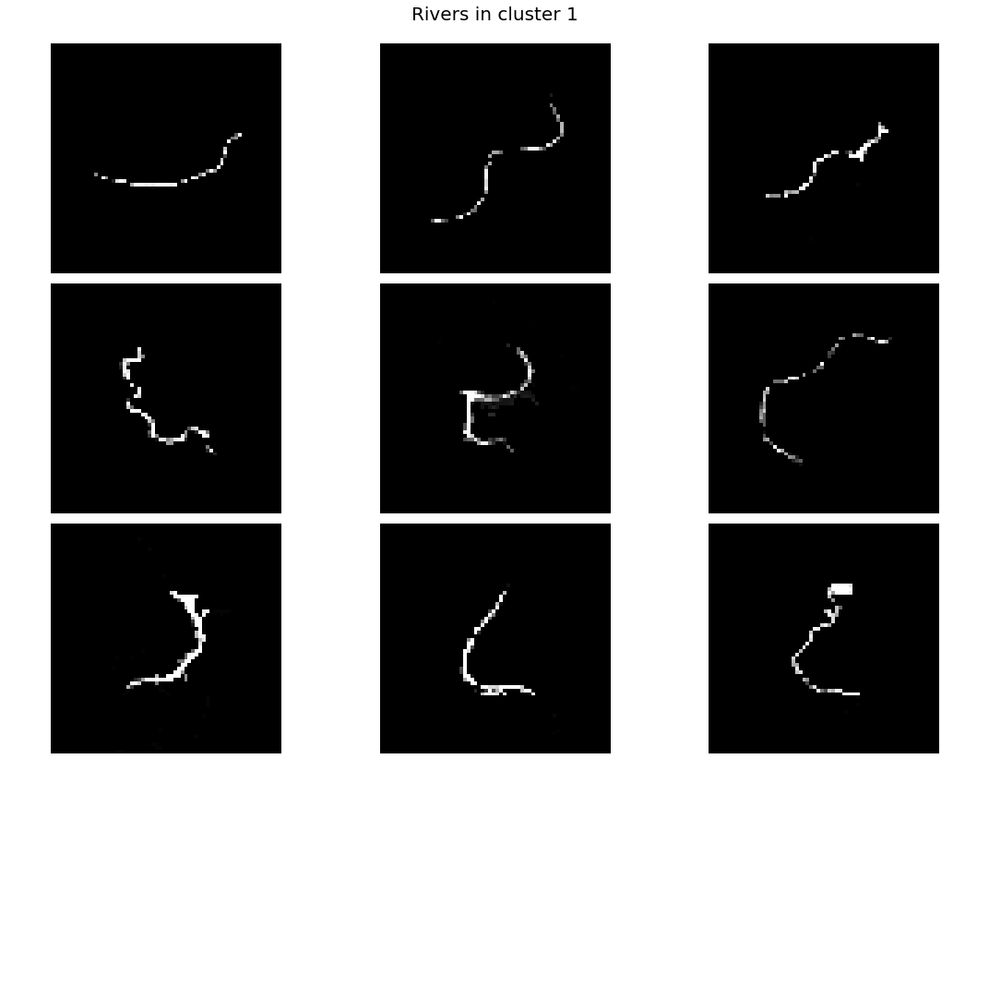

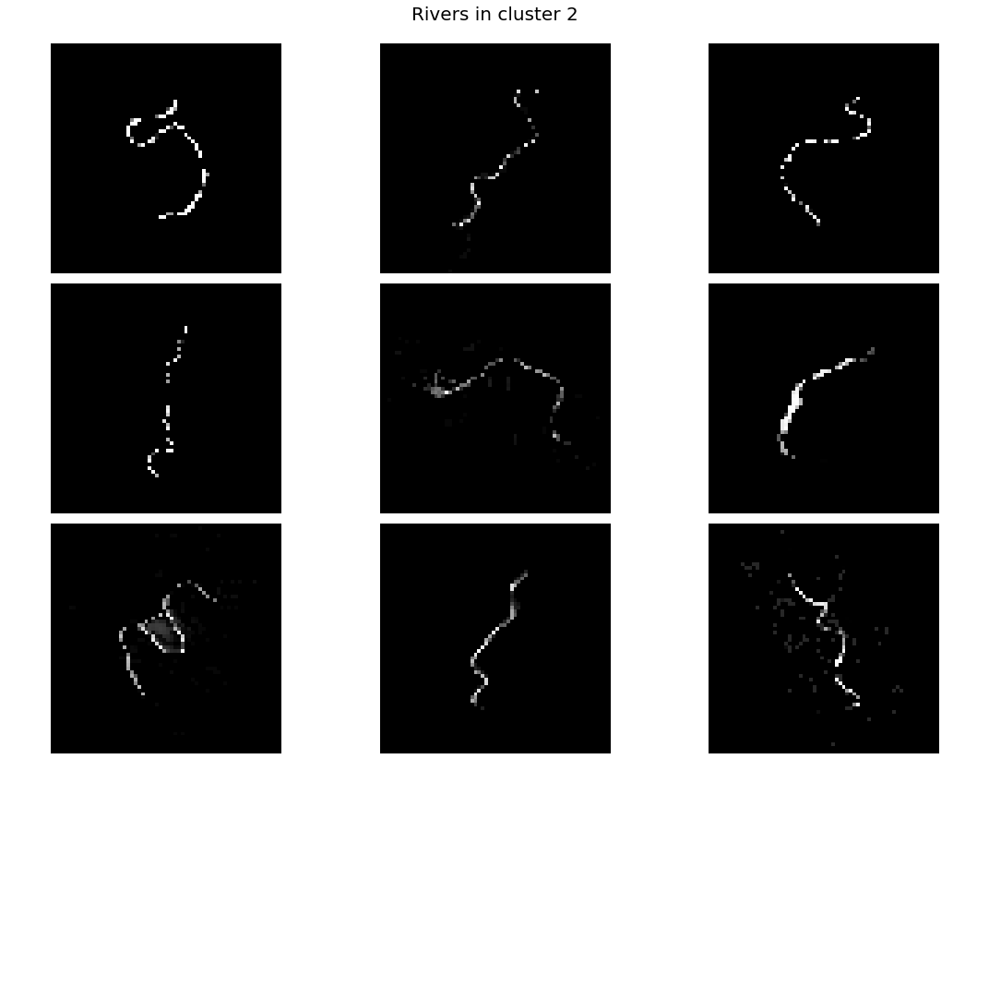

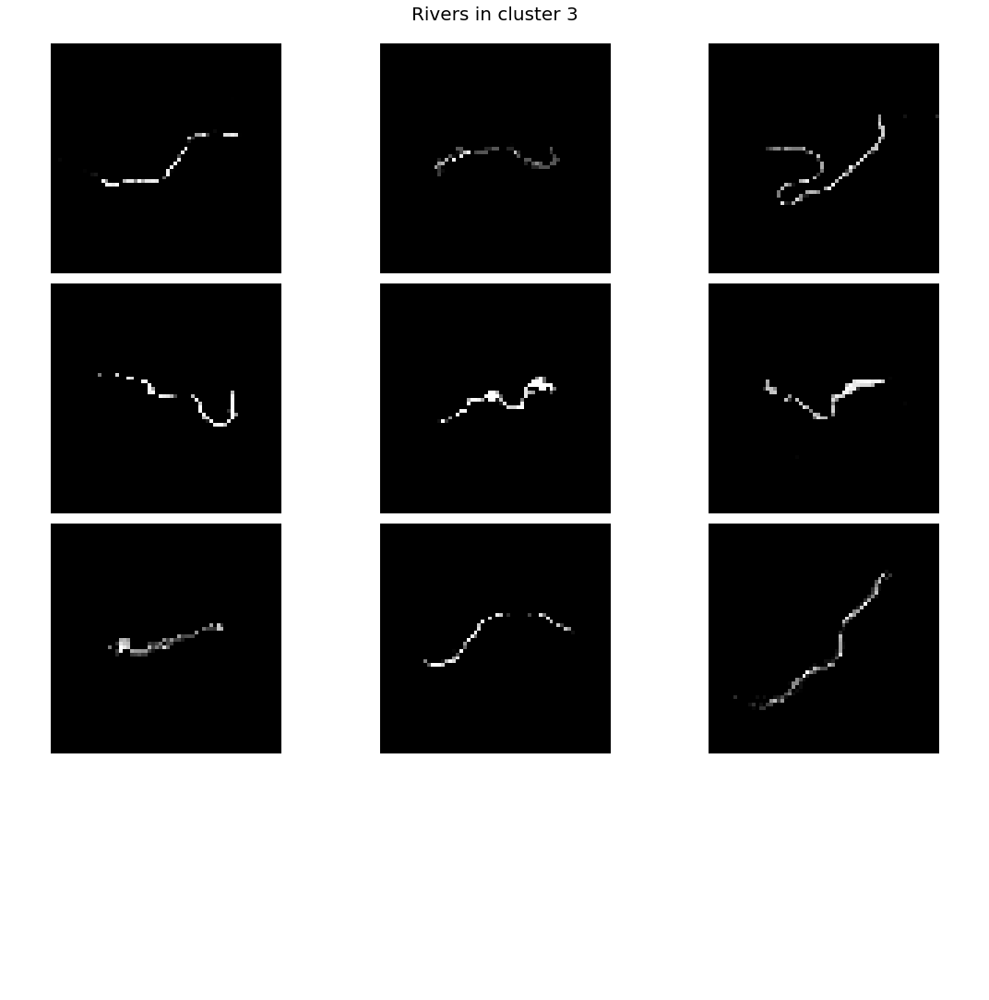

Training images :  (189, 64, 64, 3)
Labels : (189,)
Loss used: categorical_crossentropy, Optimizer used: adam
Epoch 1/5
10/10 [==============================] - 4s 94ms/step - loss: 2.7936 - categorical_crossentropy: 2.7936 - categorical_accuracy: 0.2646
Epoch 2/5
10/10 [==============================] - 1s 94ms/step - loss: 1.1964 - categorical_crossentropy: 1.1964 - categorical_accuracy: 0.6402
Epoch 3/5
10/10 [==============================] - 1s 91ms/step - loss: 0.4691 - categorical_crossentropy: 0.4691 - categorical_accuracy: 0.8254
Epoch 4/5
10/10 [==============================] - 1s 85ms/step - loss: 0.2572 - categorical_crossentropy: 0.2572 - categorical_accuracy: 0.9365
Epoch 5/5
10/10 [==============================] - 1s 84ms/step - loss: 0.1845 - categorical_crossentropy: 0.1845 - categorical_accuracy: 0.9577
Iteration is:  5


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP7_KR_317_UCL_80_4/model/assets


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP7_KR_317_UCL_80_4/model/assets


In [24]:
experiment = 'EXP7_KR_317_UCL_80_4'
threshold = 0.8
clusters = 4
epochs = 5
classes = clusters 
ucl_model = select_model(classes,'softmax')['ucl_model']

tot_iterations = 5
ucl_experiments(ucl_model, plt, clusters, threshold, epochs,tot_iterations)

KerasTensor(type_spec=TensorSpec(shape=(None, 2048), dtype=tf.float32, name=None), name='avg_pool/Mean:0', description="created by layer 'avg_pool'")
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_11 (Flatten)        (None, 2048)              0         
                                                                 
 dense_22 (Dense)            (None, 128)               262272    
                                                                 
 dense_23 (Dense)            (None, 5)                 645       
                                                                 
Total params: 23,827,717
Trainable params: 262,917
Non-trainable params: 23,564,800
_________________________________________________________________
None
 <function s

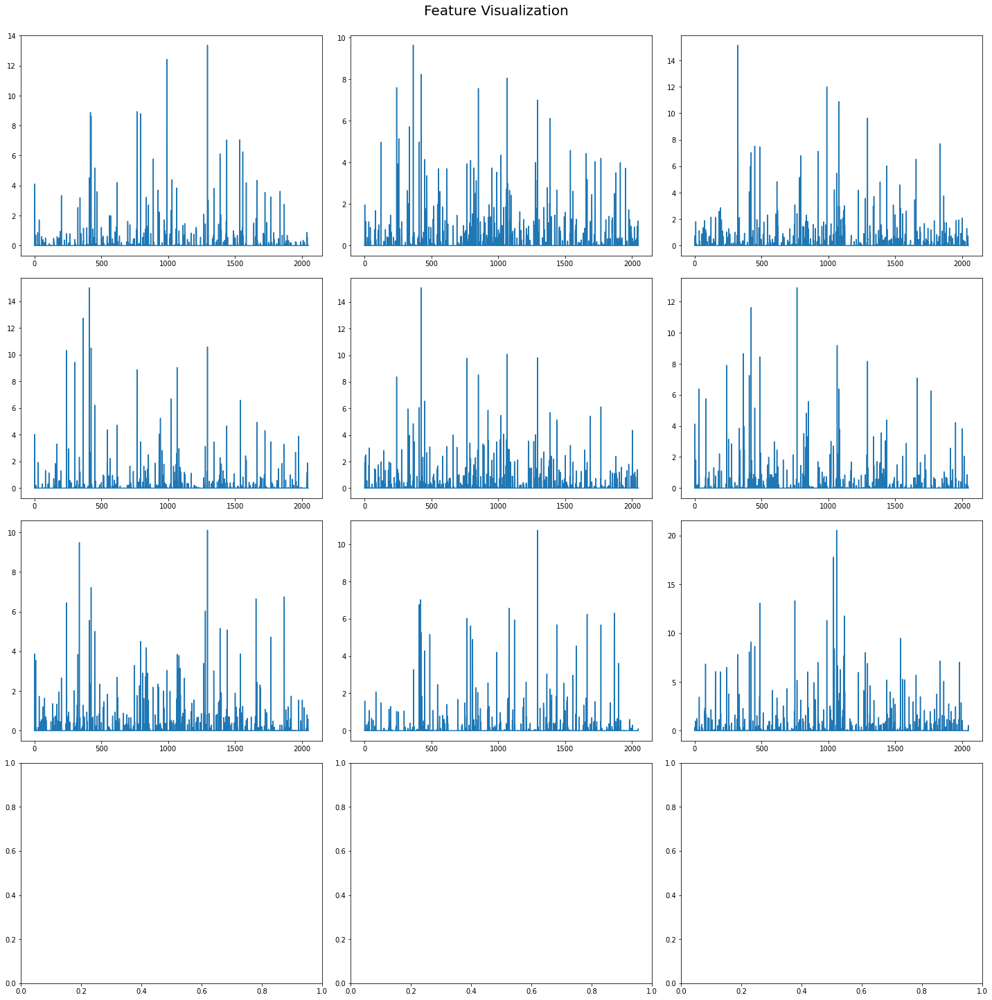

Kmeans cluster centers:  [[7.32644796e-02 1.16070509e-01 1.12692690e+00 ... 0.00000000e+00
  3.81691813e-01 8.52037549e-01]
 [1.40385609e-03 1.84125546e-02 1.59376383e+00 ... 0.00000000e+00
  9.16791558e-02 1.53963402e-01]
 [5.71451150e-04 8.77263397e-03 2.72667122e+00 ... 0.00000000e+00
  2.40843743e-03 8.16029310e-03]
 [5.35363425e-03 1.58677250e-01 2.36523986e+00 ... 0.00000000e+00
  1.49011612e-08 1.69864818e-01]
 [3.72529030e-09 2.38053147e-02 2.23296022e+00 ... 0.00000000e+00
  1.41364895e-02 1.69540316e-01]]
Total number of rivers in cluster 0 :  (41, 2048)


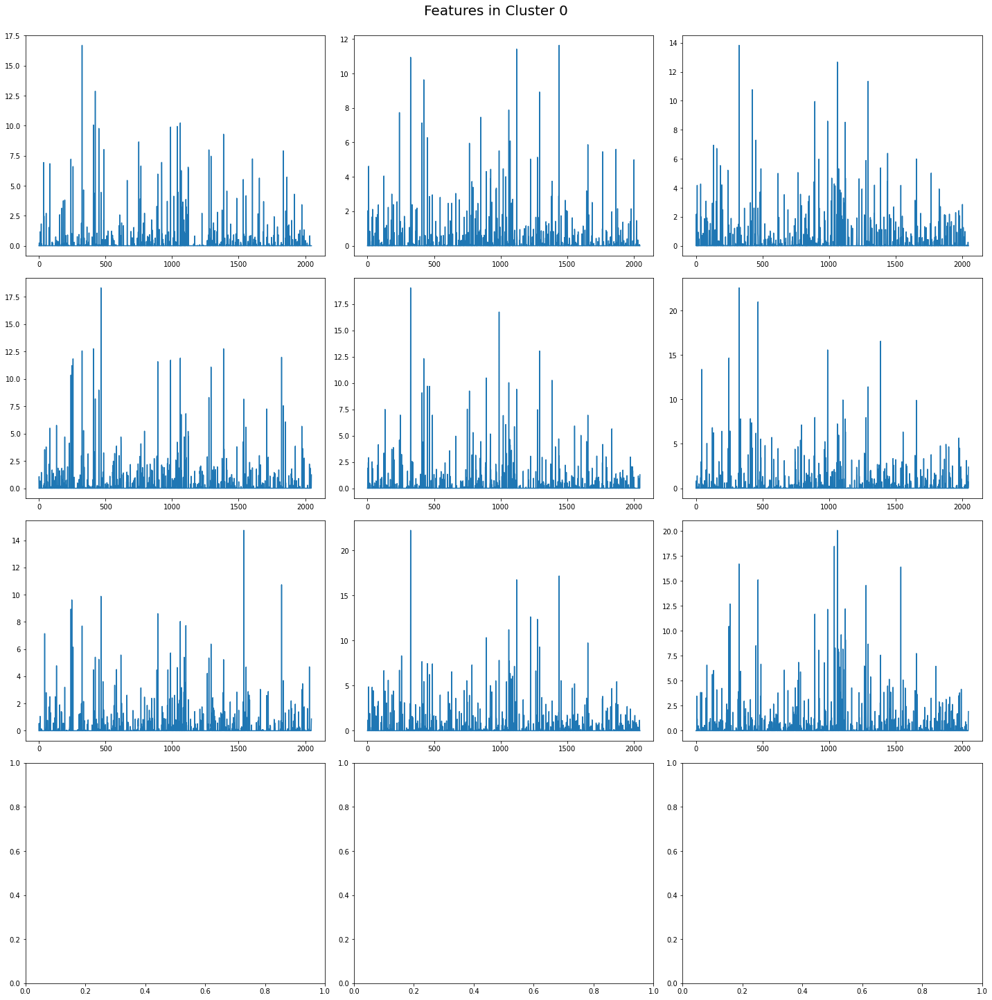

Total number of rivers in cluster 1 :  (56, 2048)


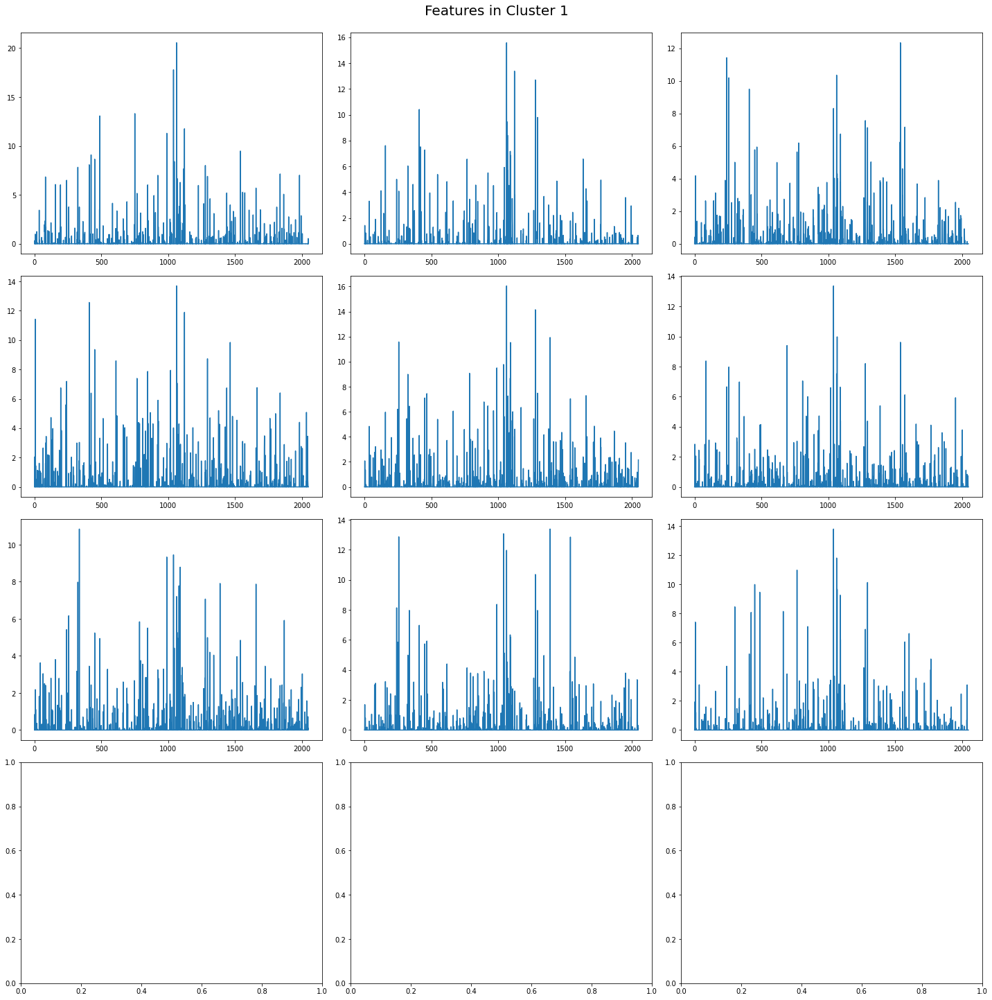

Total number of rivers in cluster 2 :  (95, 2048)


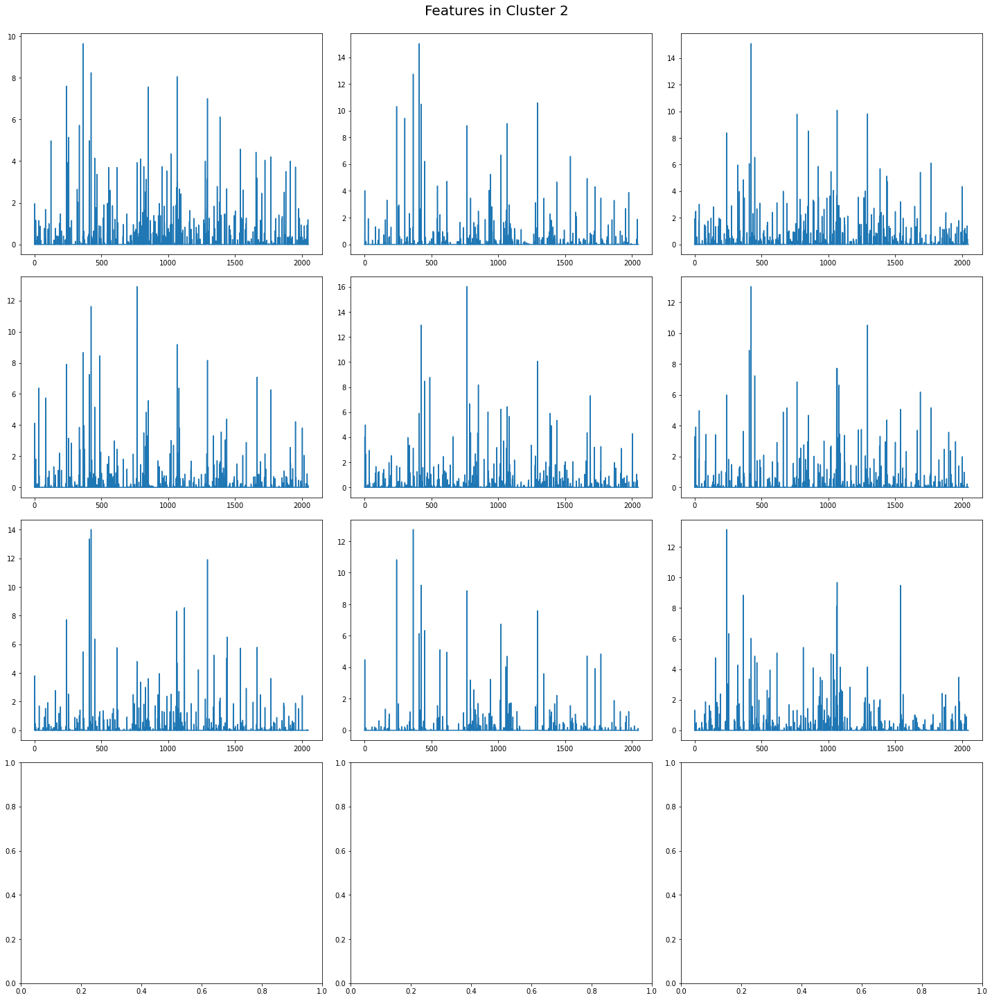

Total number of rivers in cluster 3 :  (29, 2048)


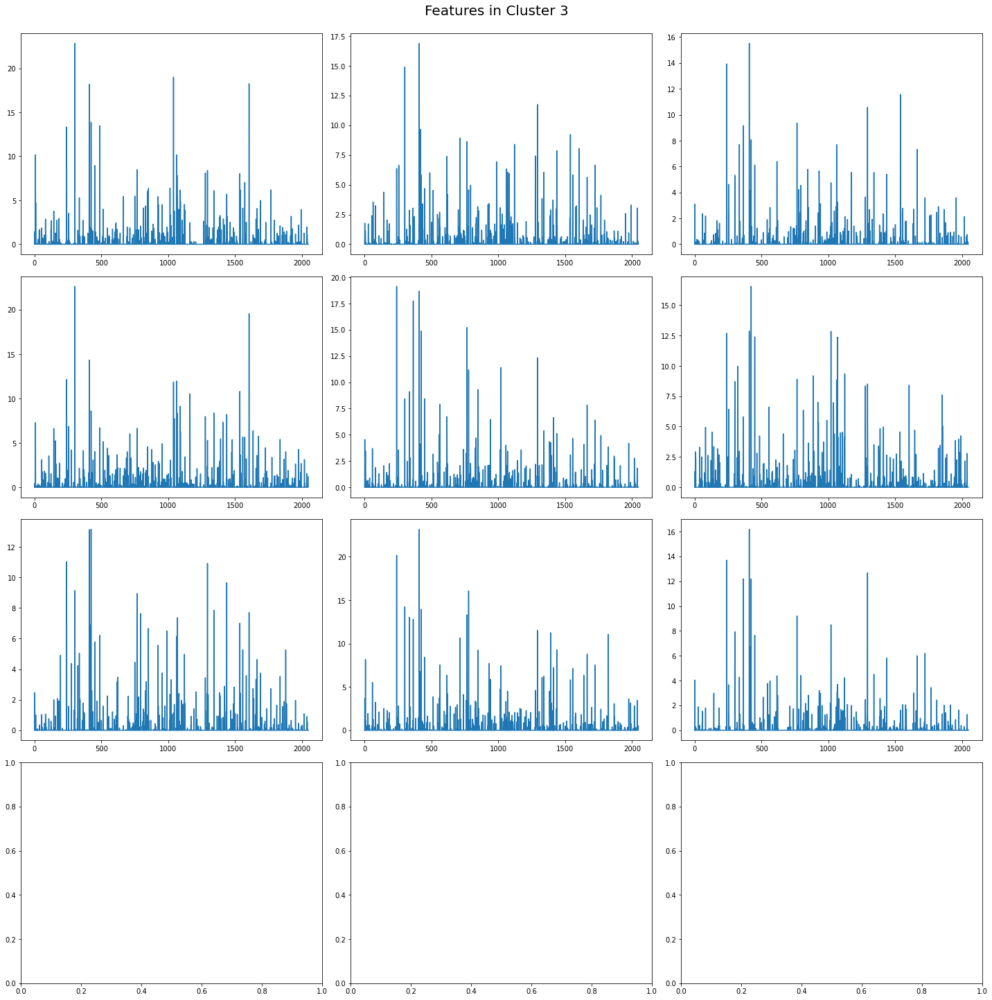

Total number of rivers in cluster 4 :  (96, 2048)


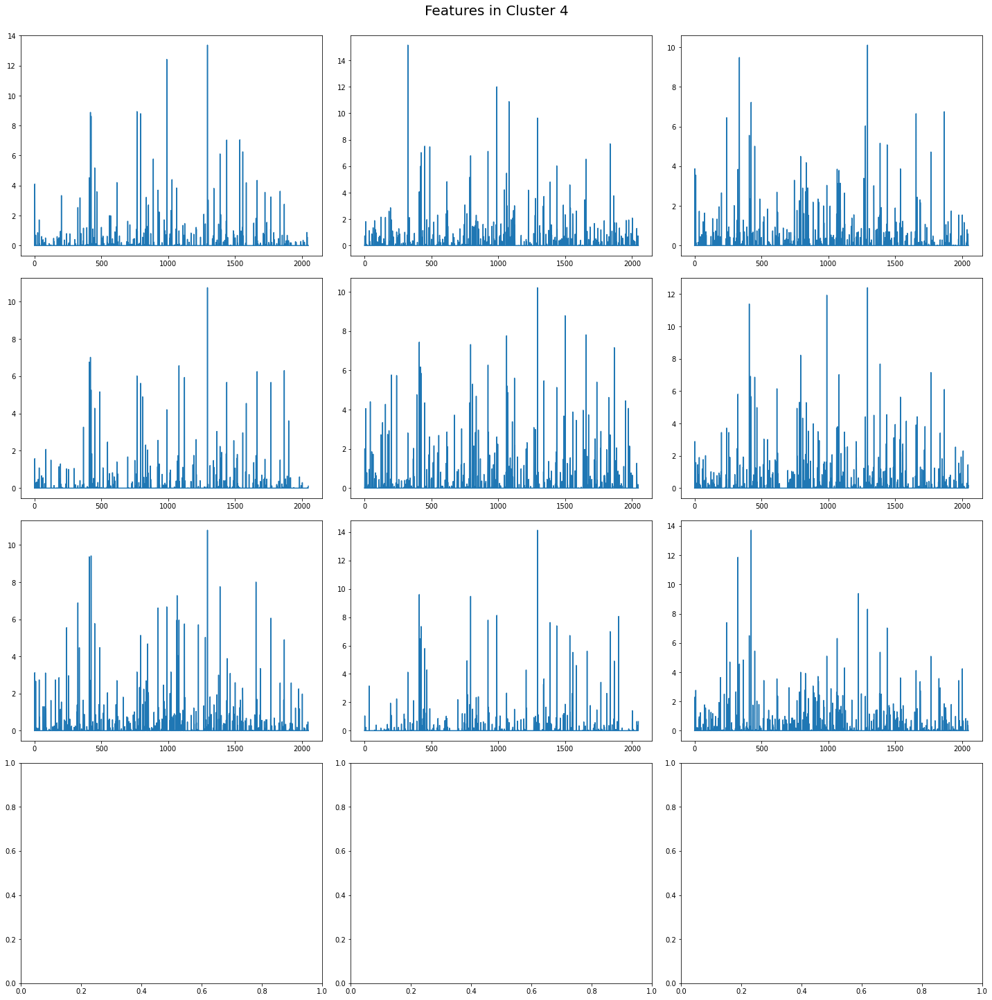

Similarity to centroid  0 :   [0.87008184 0.82231283 0.8677783 ]
Similarity to centroid  1 :   [0.81295013 0.7565803  0.7588371 ]
Similarity to centroid  2 :   [0.8402884  0.85474205 0.8749484 ]
Similarity to centroid  3 :   [0.848166   0.8536696  0.84117967]
Similarity to centroid  4 :   [0.8450023 0.8061983 0.8101566]
Total features selected for centroid 0 :  (1, 32)
Total features selected for centroid 1 :  (1, 25)
Total features selected for centroid 2 :  (1, 76)
Total features selected for centroid 3 :  (1, 24)
Total features selected for centroid 4 :  (1, 59)


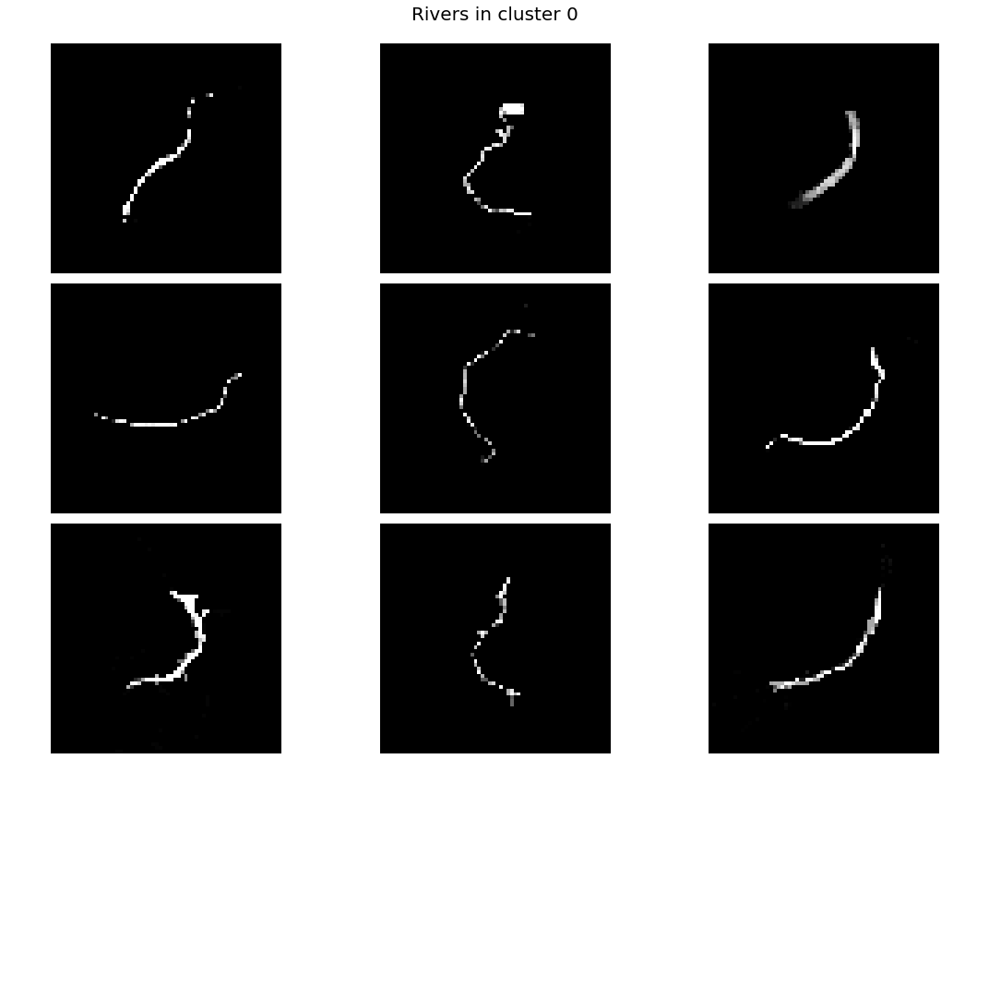

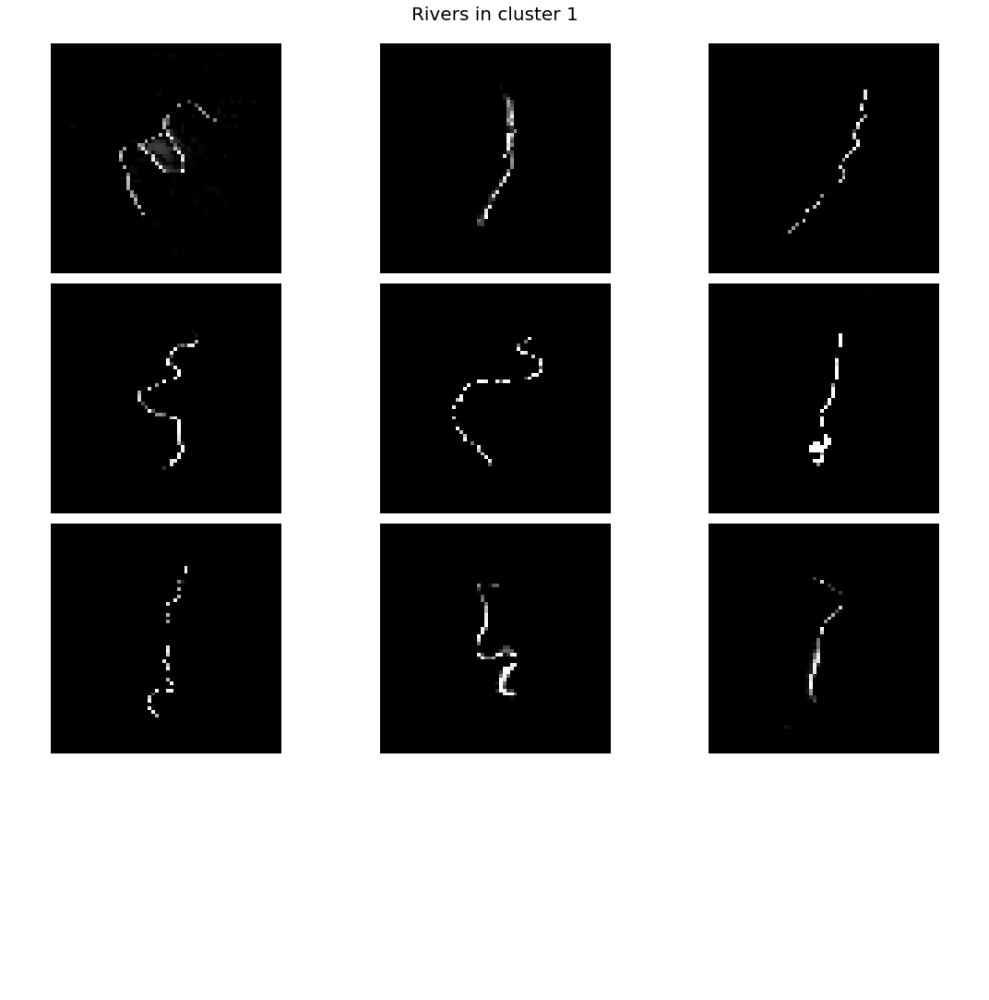

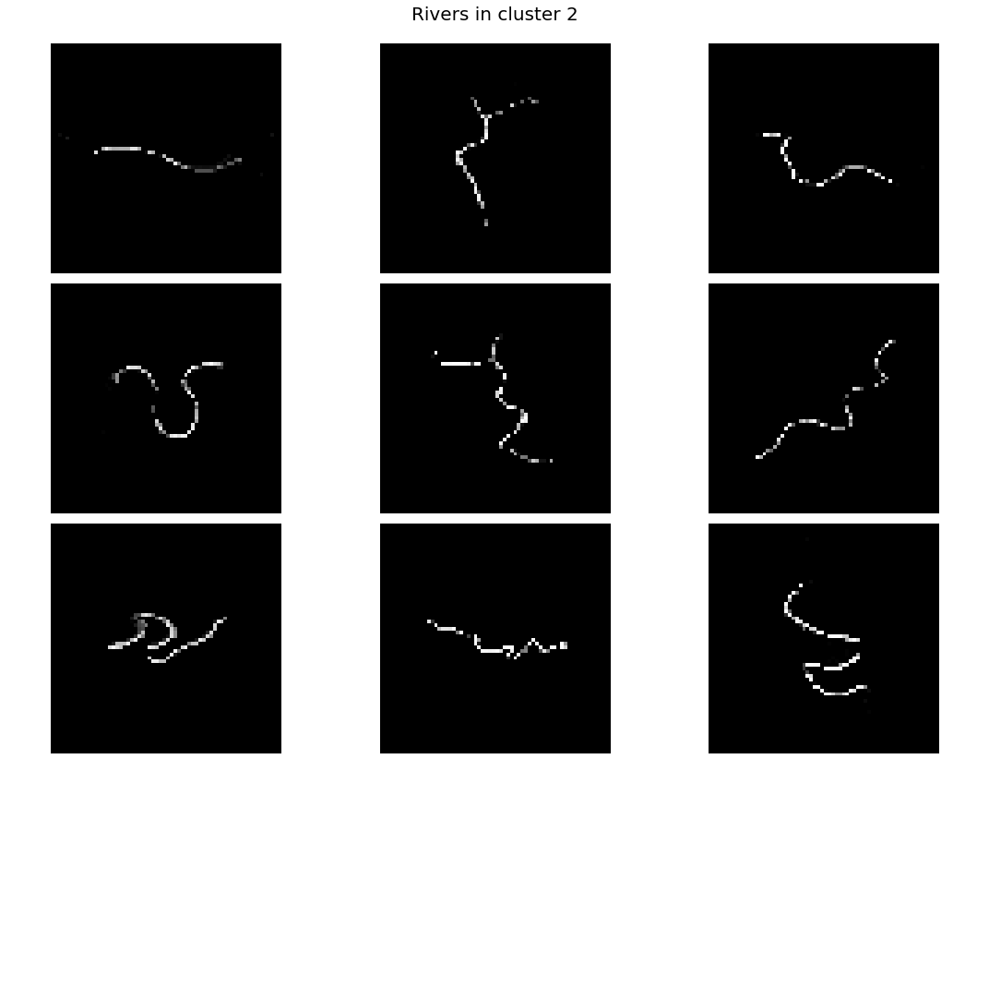

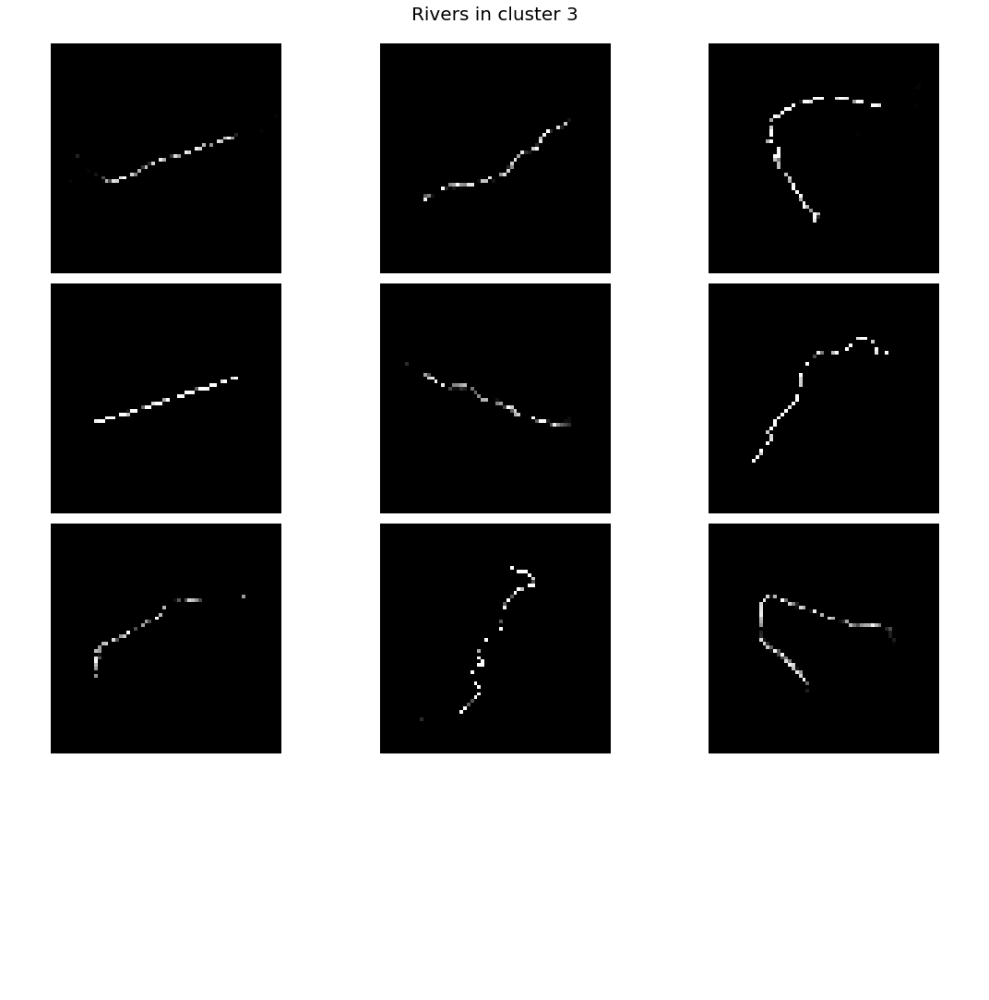

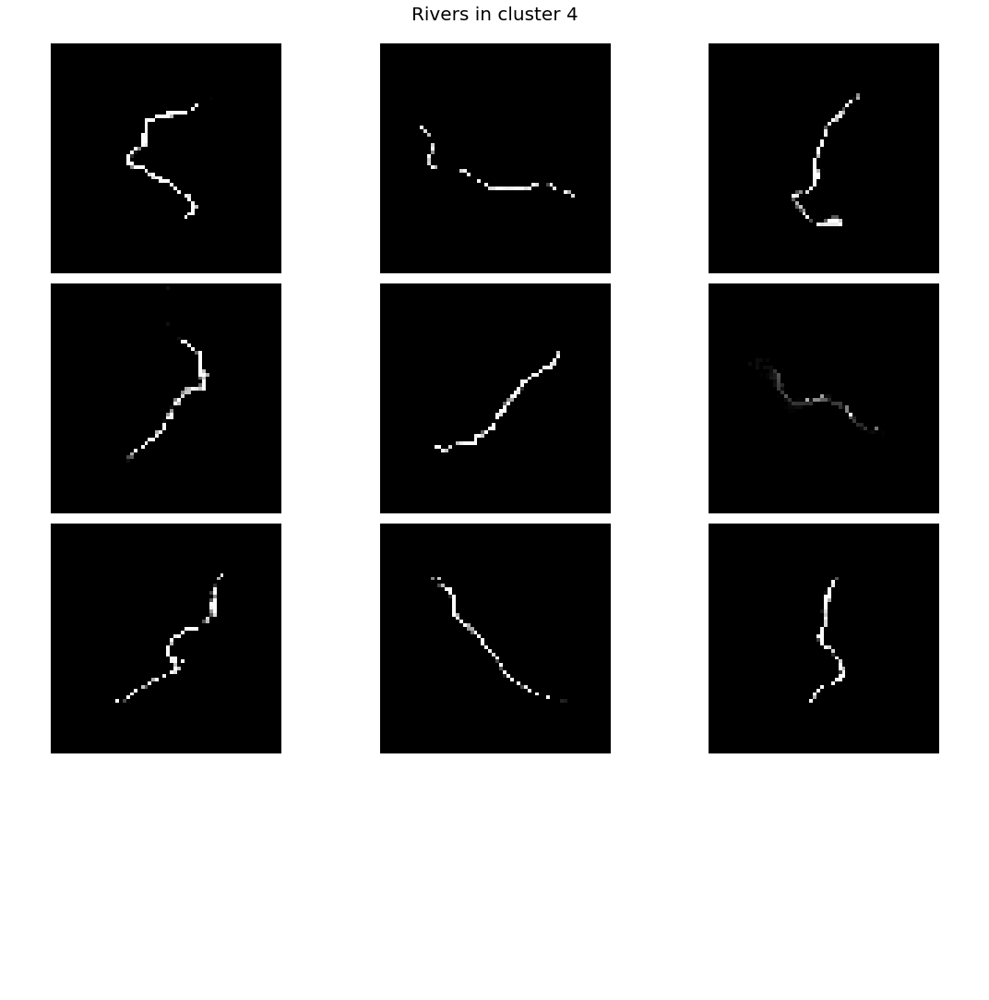

Training images :  (216, 64, 64, 3)
Labels : (216,)
Loss used: categorical_crossentropy, Optimizer used: adam
Epoch 1/5
11/11 [==============================] - 4s 94ms/step - loss: 2.6042 - categorical_crossentropy: 2.6042 - categorical_accuracy: 0.3750
Epoch 2/5
11/11 [==============================] - 1s 94ms/step - loss: 1.1466 - categorical_crossentropy: 1.1466 - categorical_accuracy: 0.6250
Epoch 3/5
11/11 [==============================] - 1s 90ms/step - loss: 0.5507 - categorical_crossentropy: 0.5507 - categorical_accuracy: 0.8241
Epoch 4/5
11/11 [==============================] - 1s 85ms/step - loss: 0.4043 - categorical_crossentropy: 0.4043 - categorical_accuracy: 0.9259
Epoch 5/5
11/11 [==============================] - 1s 86ms/step - loss: 0.2928 - categorical_crossentropy: 0.2928 - categorical_accuracy: 0.9537
Iteration is:  5


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP8_KR_317_UCL_80_5/model/assets


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP8_KR_317_UCL_80_5/model/assets


In [25]:
experiment = 'EXP8_KR_317_UCL_80_5'
threshold = 0.8
clusters = 5
epochs = 5
classes = clusters 
ucl_model = select_model(classes,'softmax')['ucl_model']

tot_iterations = 5
ucl_experiments(ucl_model, plt, clusters, threshold, epochs,tot_iterations)

KerasTensor(type_spec=TensorSpec(shape=(None, 2048), dtype=tf.float32, name=None), name='avg_pool/Mean:0', description="created by layer 'avg_pool'")
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_12 (Flatten)        (None, 2048)              0         
                                                                 
 dense_24 (Dense)            (None, 128)               262272    
                                                                 
 dense_25 (Dense)            (None, 6)                 774       
                                                                 
Total params: 23,827,846
Trainable params: 263,046
Non-trainable params: 23,564,800
_________________________________________________________________
None
 <function s

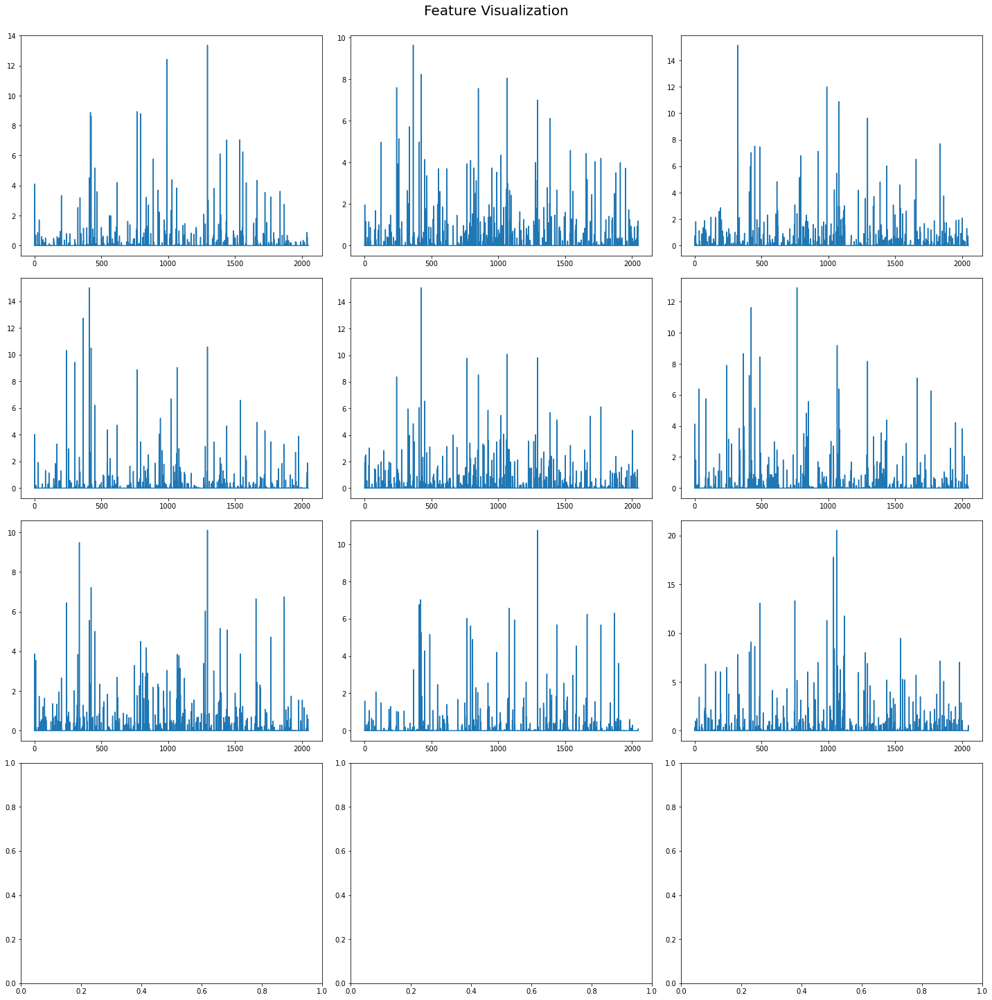

Kmeans cluster centers:  [[1.9174609e-03 1.4501559e-02 1.3622912e+00 ... 0.0000000e+00
  7.5685553e-02 1.5004817e-01]
 [5.6549814e-04 8.6812451e-03 2.6962495e+00 ... 0.0000000e+00
  2.3833513e-03 8.0752969e-03]
 [1.0824658e-02 7.1423650e-03 2.0826793e+00 ... 0.0000000e+00
  1.3164108e-01 1.4469618e-01]
 [2.7939677e-09 1.5457350e-01 2.4249847e+00 ... 0.0000000e+00
  1.4901161e-08 1.5962712e-01]
 [3.7252903e-09 4.3802958e-02 2.2129266e+00 ... 0.0000000e+00
  9.7930580e-03 1.7501140e-01]
 [9.1948844e-02 1.6552640e-01 1.0042094e+00 ... 0.0000000e+00
  4.0049577e-01 1.2151916e+00]]
Total number of rivers in cluster 0 :  (41, 2048)


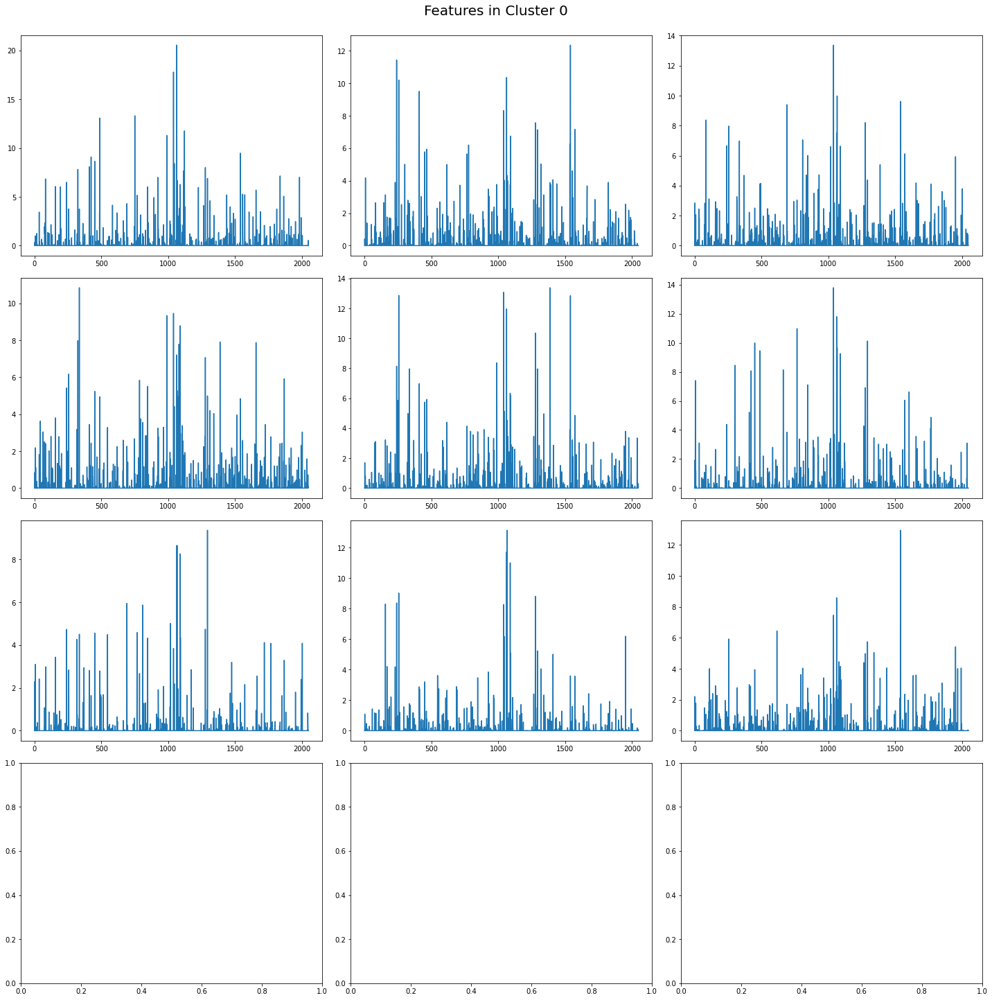

Total number of rivers in cluster 1 :  (96, 2048)


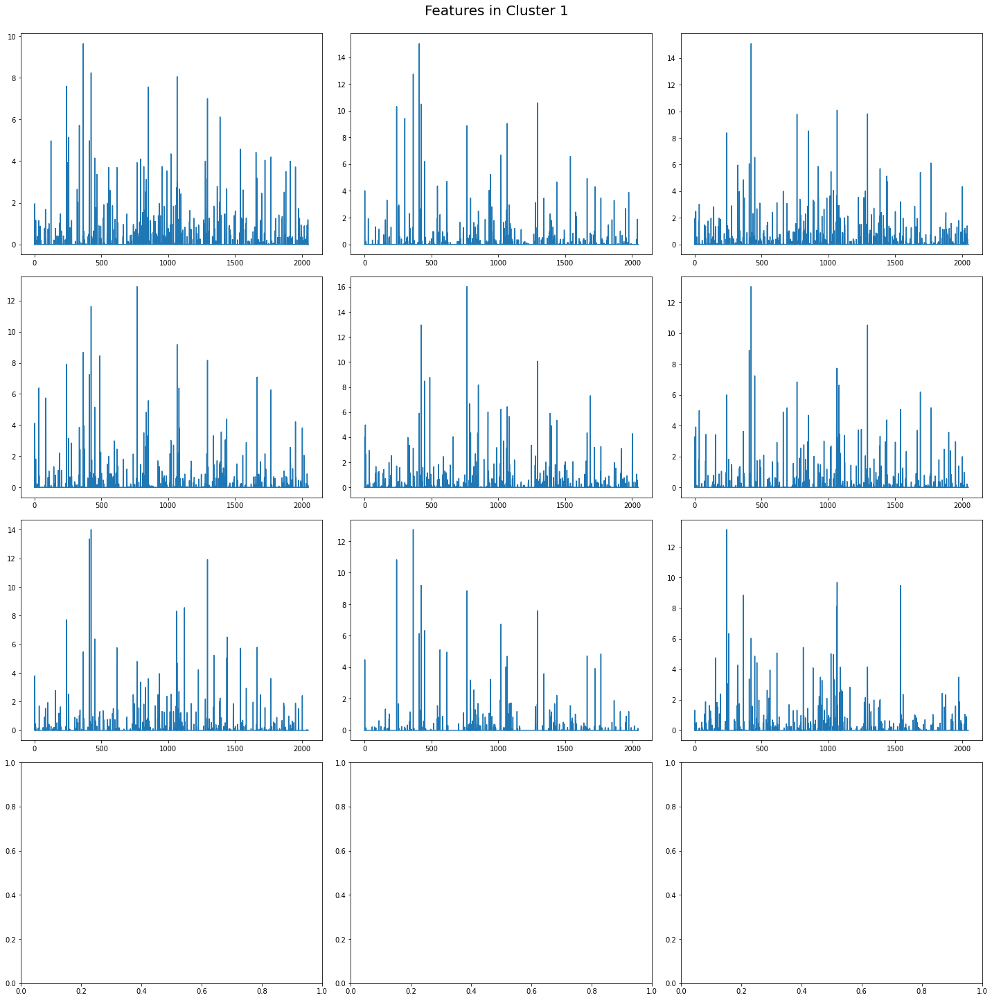

Total number of rivers in cluster 2 :  (54, 2048)


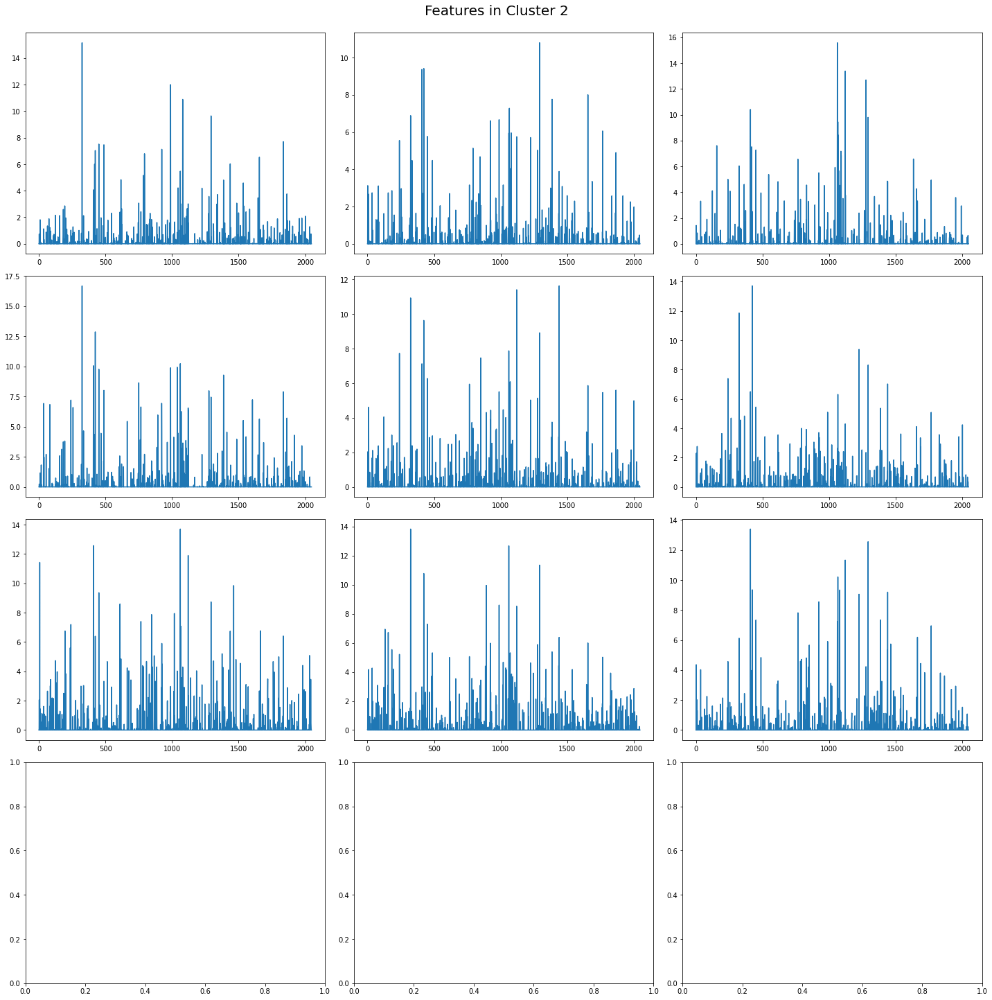

Total number of rivers in cluster 3 :  (25, 2048)


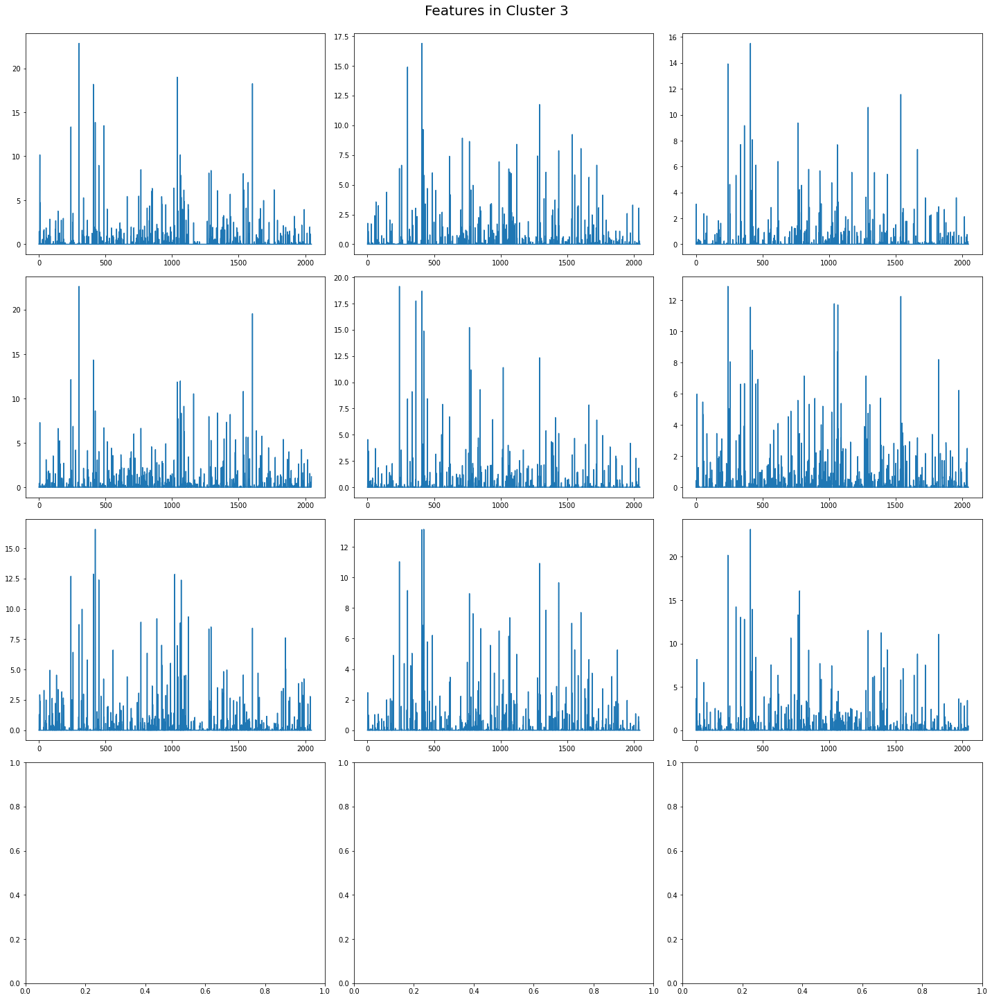

Total number of rivers in cluster 4 :  (73, 2048)


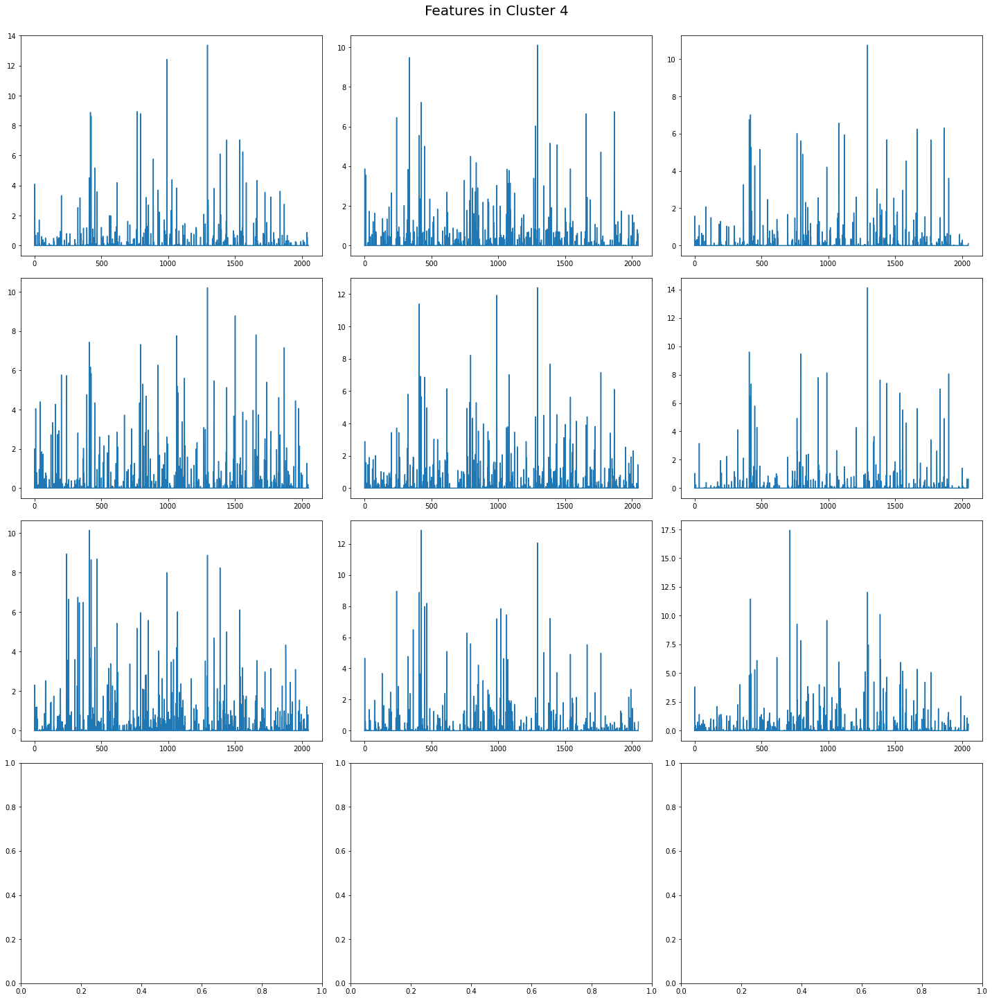

Total number of rivers in cluster 5 :  (28, 2048)


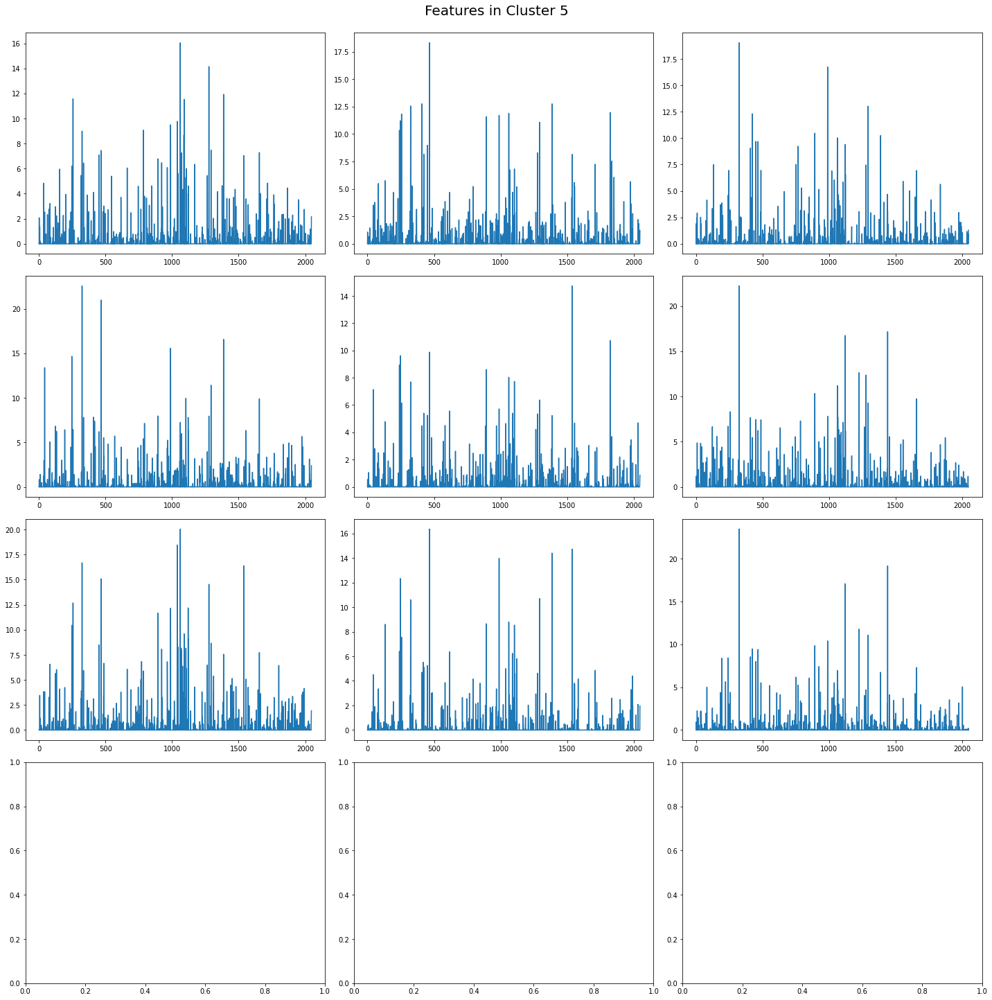

Similarity to centroid  0 :   [0.8044214  0.76434225 0.84605724]
Similarity to centroid  1 :   [0.8409679  0.8567647  0.87490743]
Similarity to centroid  2 :   [0.84588844 0.9292898  0.79149806]
Similarity to centroid  3 :   [0.8553411 0.8374319 0.8415813]
Similarity to centroid  4 :   [0.86546874 0.7790991  0.76524884]
Similarity to centroid  5 :   [0.8060214 0.8828418 0.9217491]
Total features selected for centroid 0 :  (1, 21)
Total features selected for centroid 1 :  (1, 78)
Total features selected for centroid 2 :  (1, 37)
Total features selected for centroid 3 :  (1, 22)
Total features selected for centroid 4 :  (1, 45)
Total features selected for centroid 5 :  (1, 27)


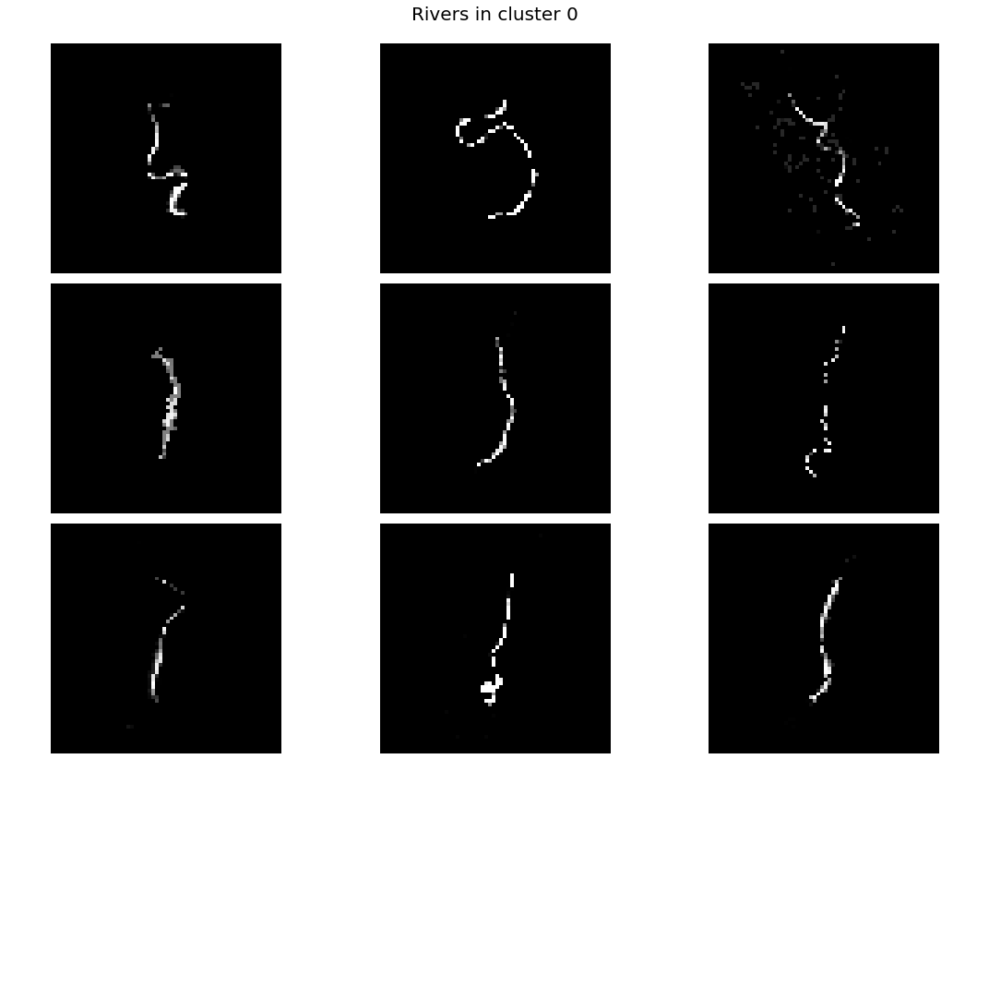

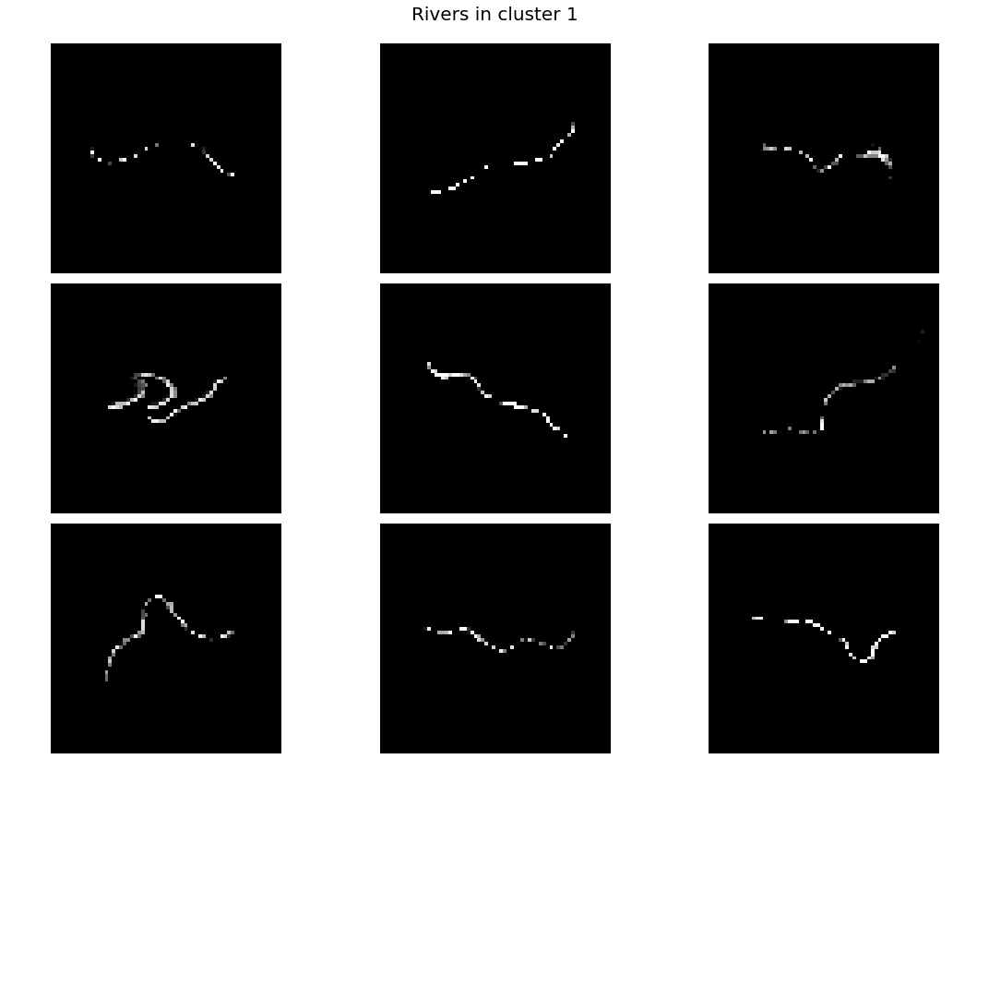

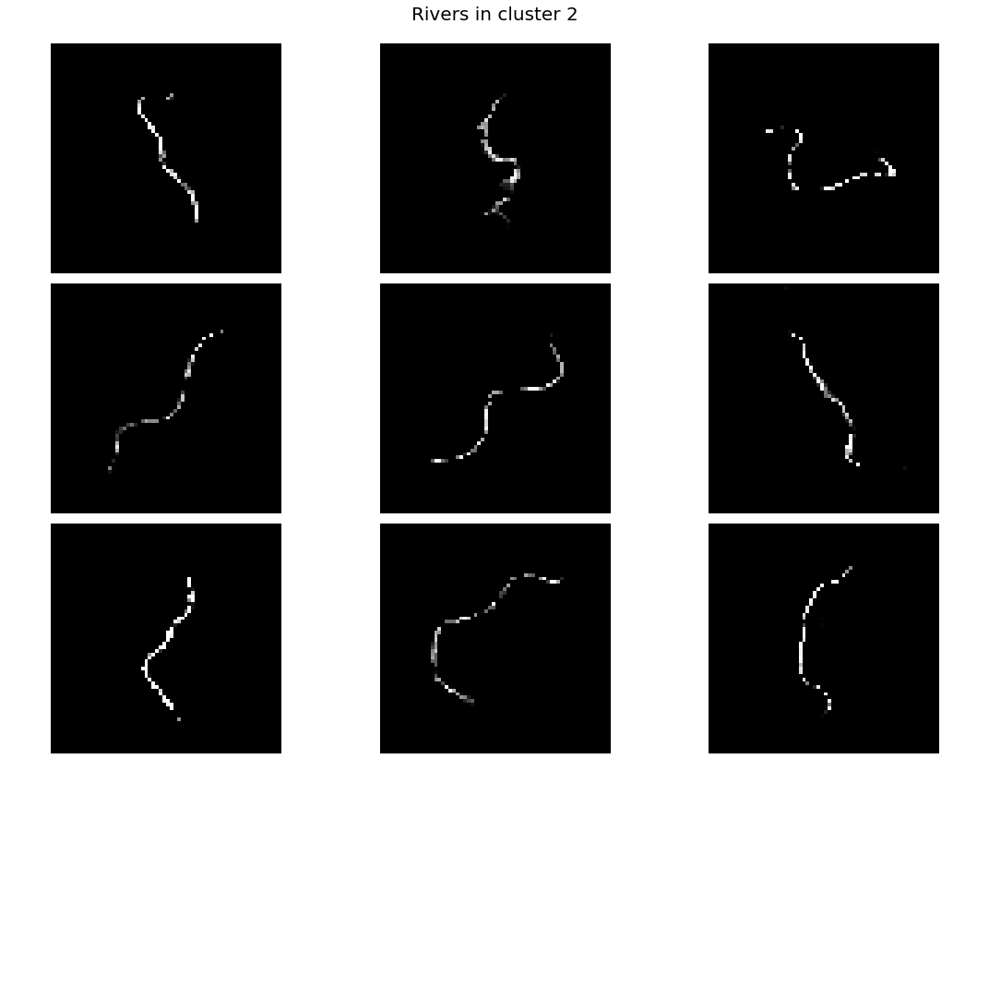

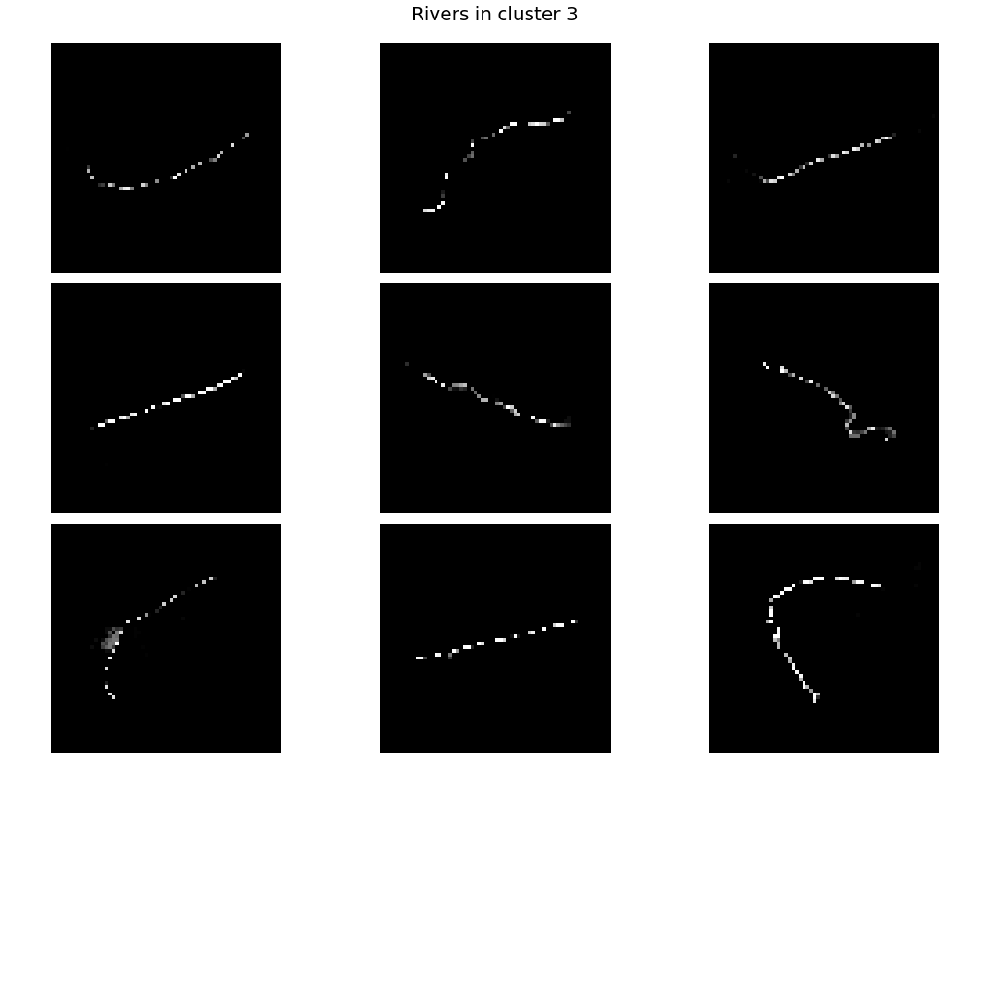

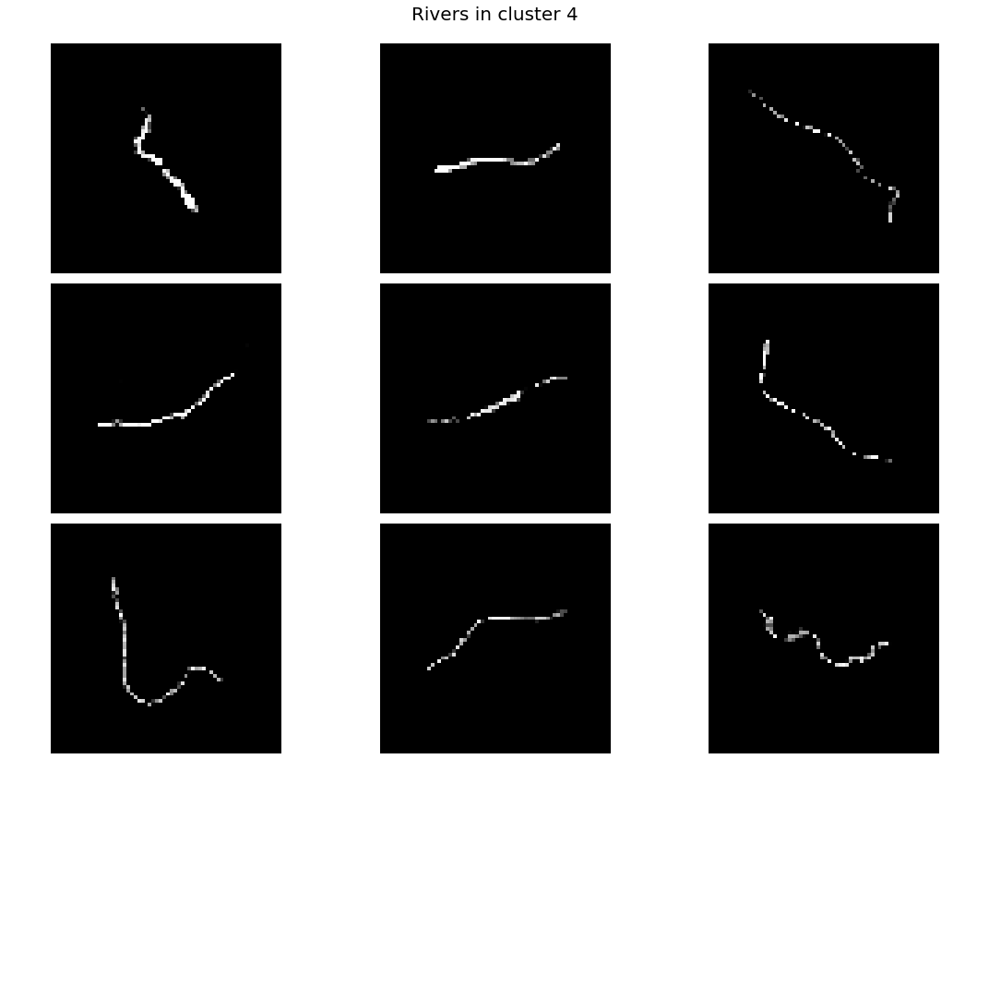

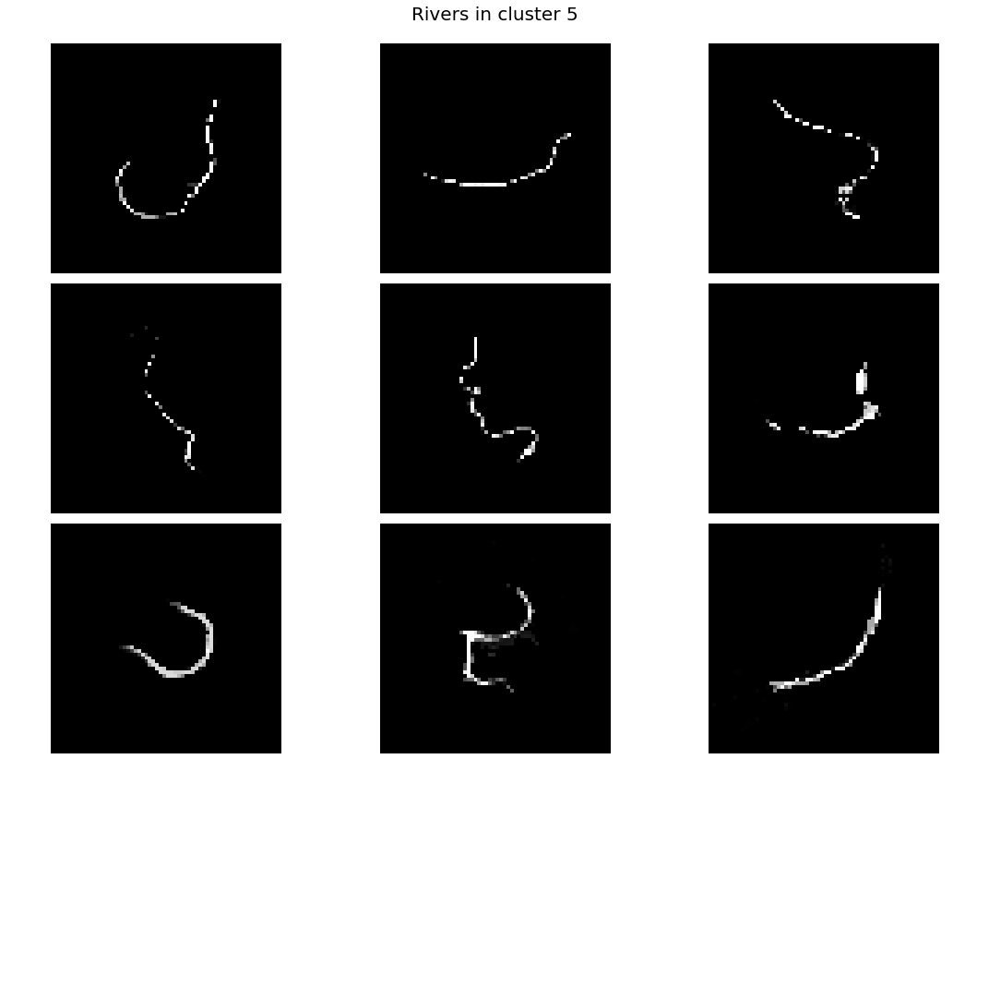

Training images :  (230, 64, 64, 3)
Labels : (230,)
Loss used: categorical_crossentropy, Optimizer used: adam
Epoch 1/5
12/12 [==============================] - 4s 99ms/step - loss: 3.0763 - categorical_crossentropy: 3.0763 - categorical_accuracy: 0.3304
Epoch 2/5
12/12 [==============================] - 1s 96ms/step - loss: 1.5926 - categorical_crossentropy: 1.5926 - categorical_accuracy: 0.4391
Epoch 3/5
12/12 [==============================] - 1s 92ms/step - loss: 0.9723 - categorical_crossentropy: 0.9723 - categorical_accuracy: 0.6696
Epoch 4/5
12/12 [==============================] - 1s 86ms/step - loss: 0.6502 - categorical_crossentropy: 0.6502 - categorical_accuracy: 0.8130
Epoch 5/5
12/12 [==============================] - 1s 86ms/step - loss: 0.4568 - categorical_crossentropy: 0.4568 - categorical_accuracy: 0.8957
Iteration is:  5


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP4_KR_317_UCL_80_6/model/assets


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP4_KR_317_UCL_80_6/model/assets


In [26]:
experiment = 'EXP4_KR_317_UCL_80_6'
threshold = 0.8
clusters = 6
epochs = 5
classes = clusters 
ucl_model = select_model(classes,'softmax')['ucl_model']

tot_iterations = 5
ucl_experiments(ucl_model, plt, clusters, threshold, epochs,tot_iterations)

KerasTensor(type_spec=TensorSpec(shape=(None, 2048), dtype=tf.float32, name=None), name='avg_pool/Mean:0', description="created by layer 'avg_pool'")
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 flatten_13 (Flatten)        (None, 2048)              0         
                                                                 
 dense_26 (Dense)            (None, 128)               262272    
                                                                 
 dense_27 (Dense)            (None, 7)                 903       
                                                                 
Total params: 23,827,975
Trainable params: 263,175
Non-trainable params: 23,564,800
_________________________________________________________________
None
 <function s

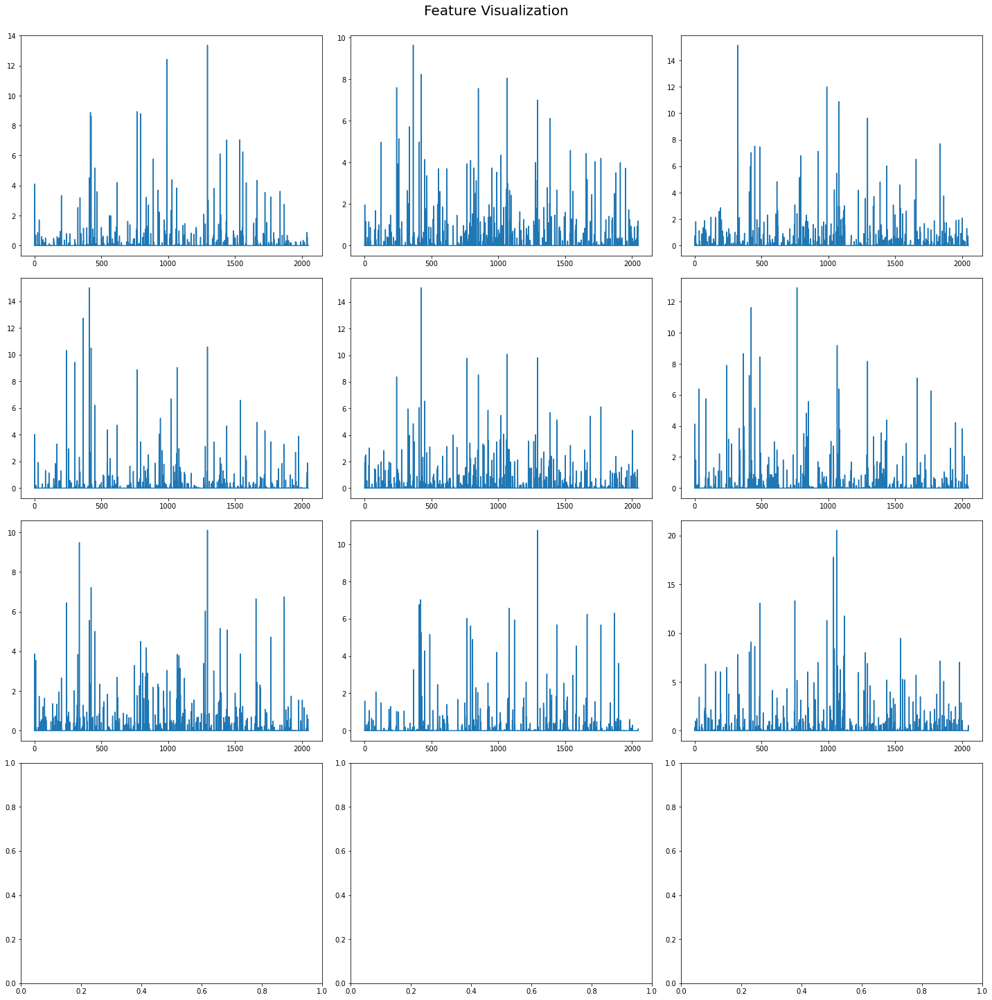

Kmeans cluster centers:  [[6.0319714e-04 1.0069117e-02 2.4463015e+00 ... 0.0000000e+00
  2.5422499e-03 1.8891111e-02]
 [8.6252959e-03 9.9511065e-02 1.6695764e+00 ... 0.0000000e+00
  0.0000000e+00 2.4117158e-01]
 [3.7252903e-09 4.7728200e-02 2.2303891e+00 ... 0.0000000e+00
  4.9042925e-03 1.8069260e-01]
 ...
 [1.0640748e-01 1.6996038e-01 1.0719924e+00 ... 0.0000000e+00
  4.4317040e-01 1.1482964e+00]
 [1.9174609e-03 1.4501559e-02 1.3836867e+00 ... 0.0000000e+00
  8.2911327e-02 1.8675126e-01]
 [2.7939677e-09 1.1648877e-01 3.7711372e+00 ... 0.0000000e+00
  2.2351742e-08 2.5951222e-02]]
Total number of rivers in cluster 0 :  (90, 2048)


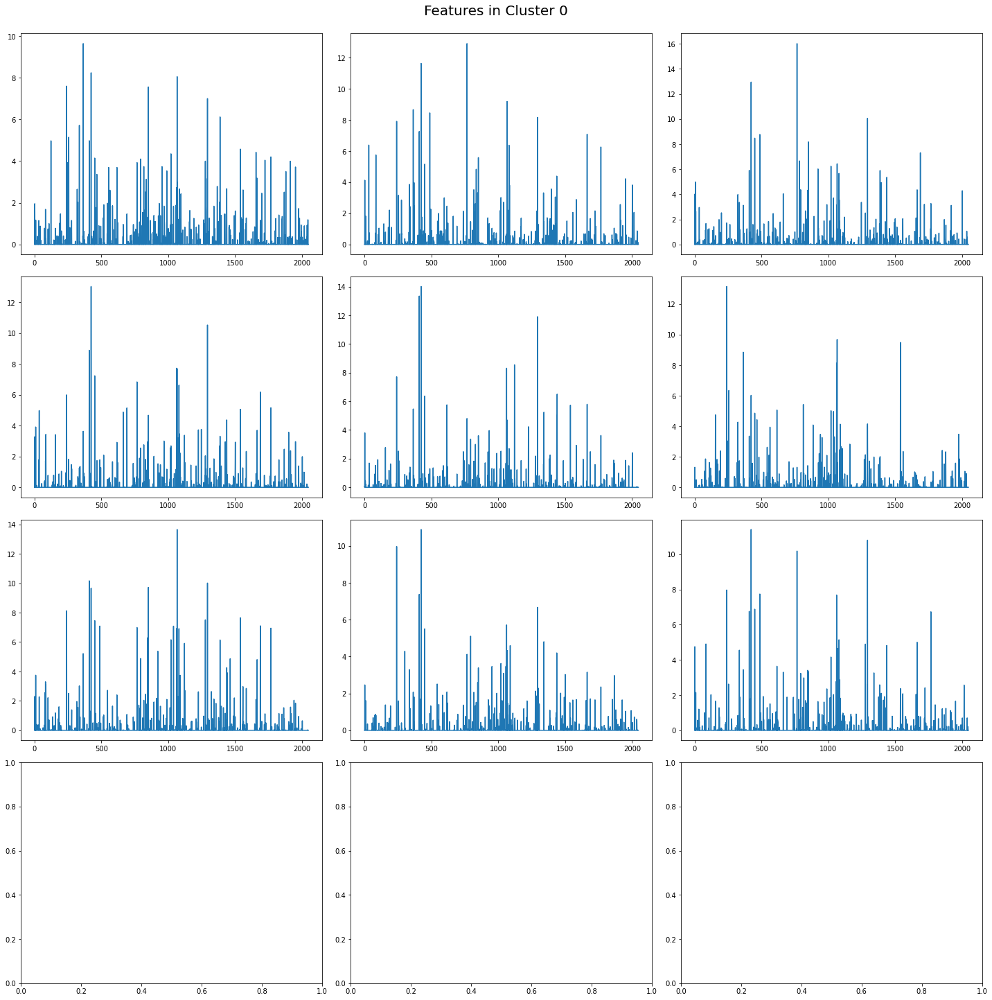

Total number of rivers in cluster 1 :  (18, 2048)


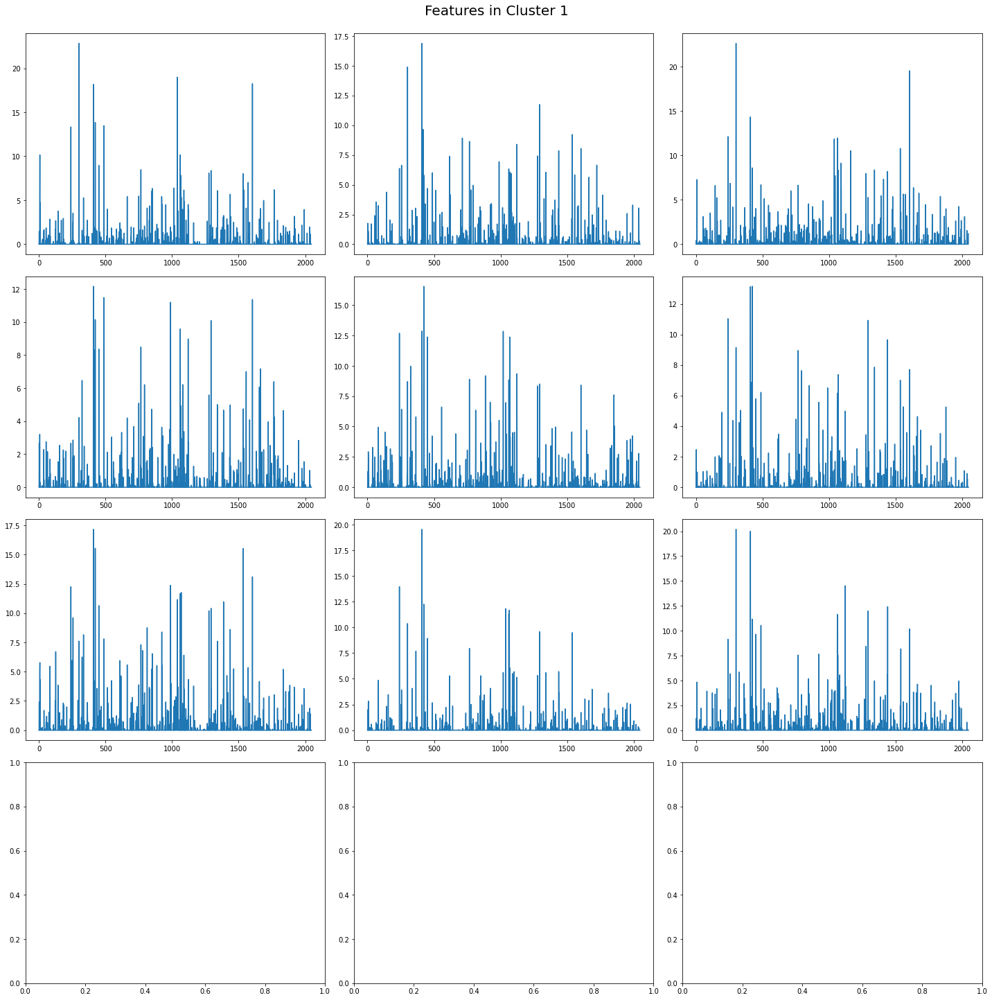

Total number of rivers in cluster 2 :  (52, 2048)


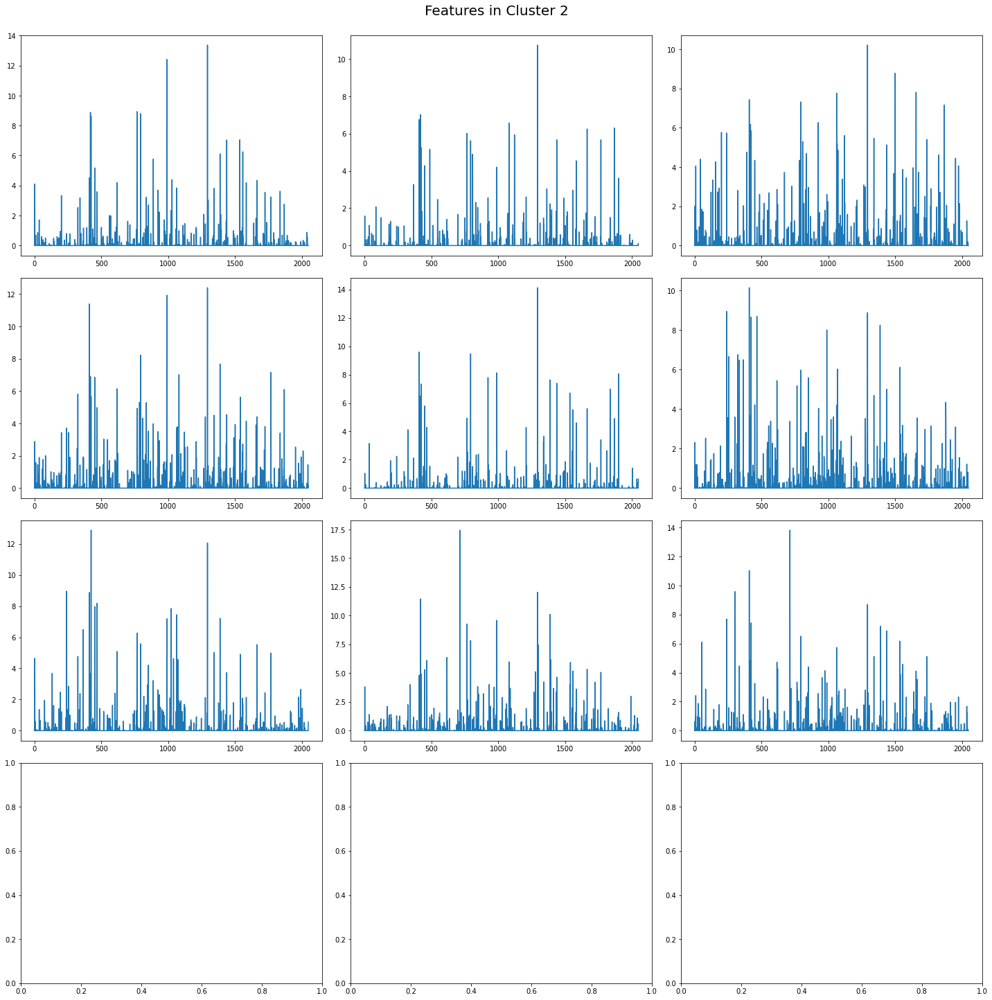

Total number of rivers in cluster 3 :  (63, 2048)


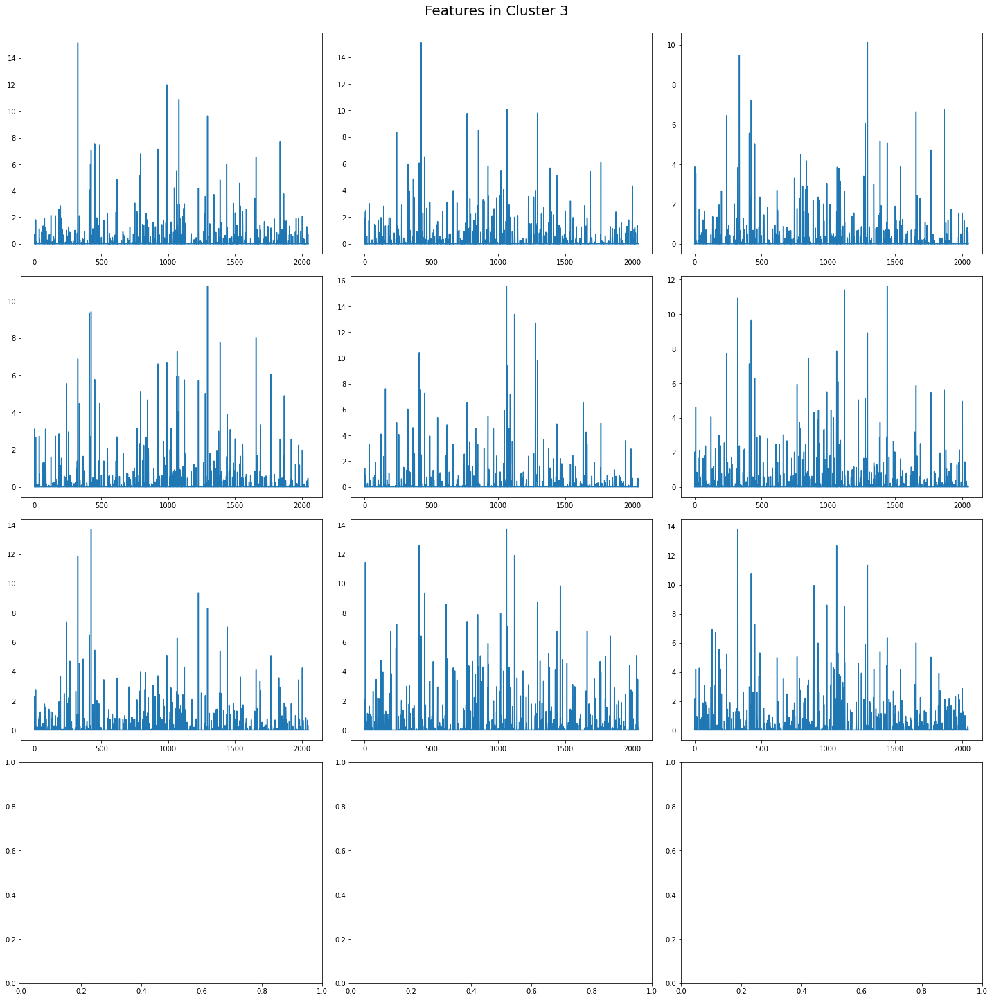

Total number of rivers in cluster 4 :  (28, 2048)


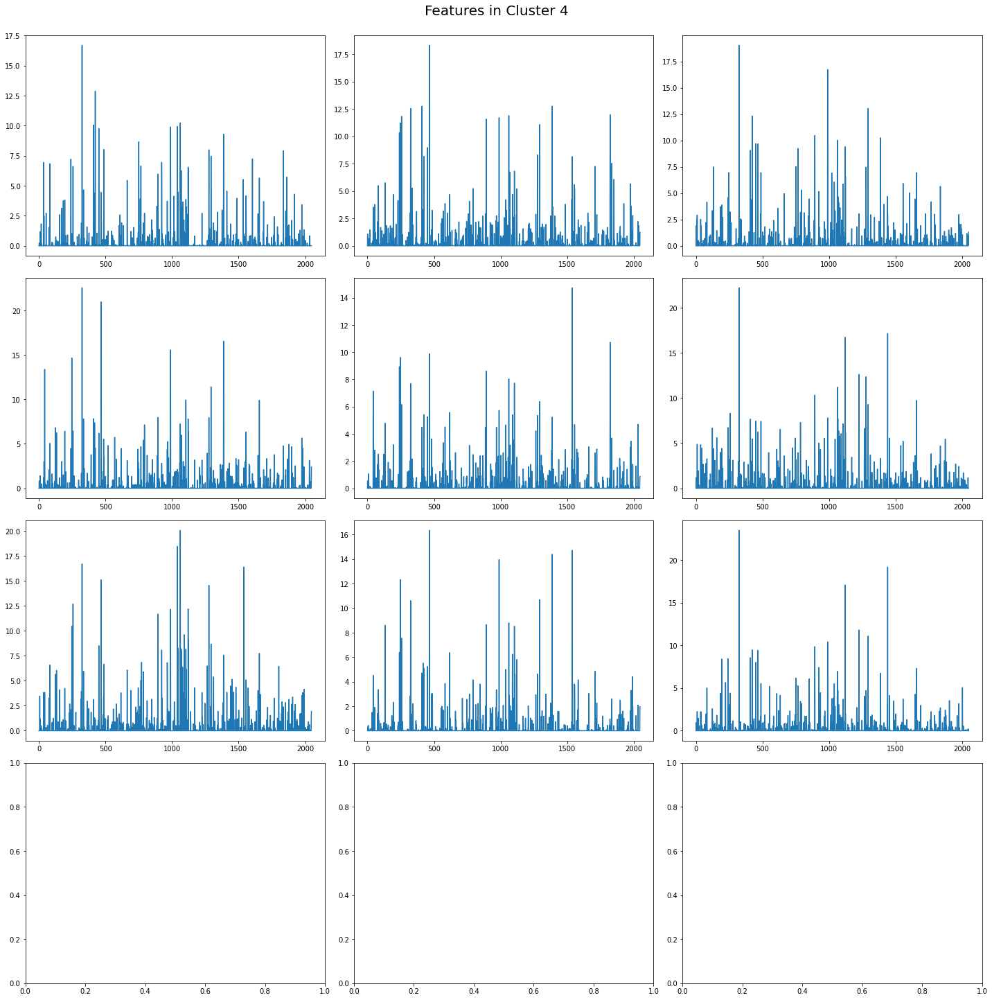

Total number of rivers in cluster 5 :  (41, 2048)


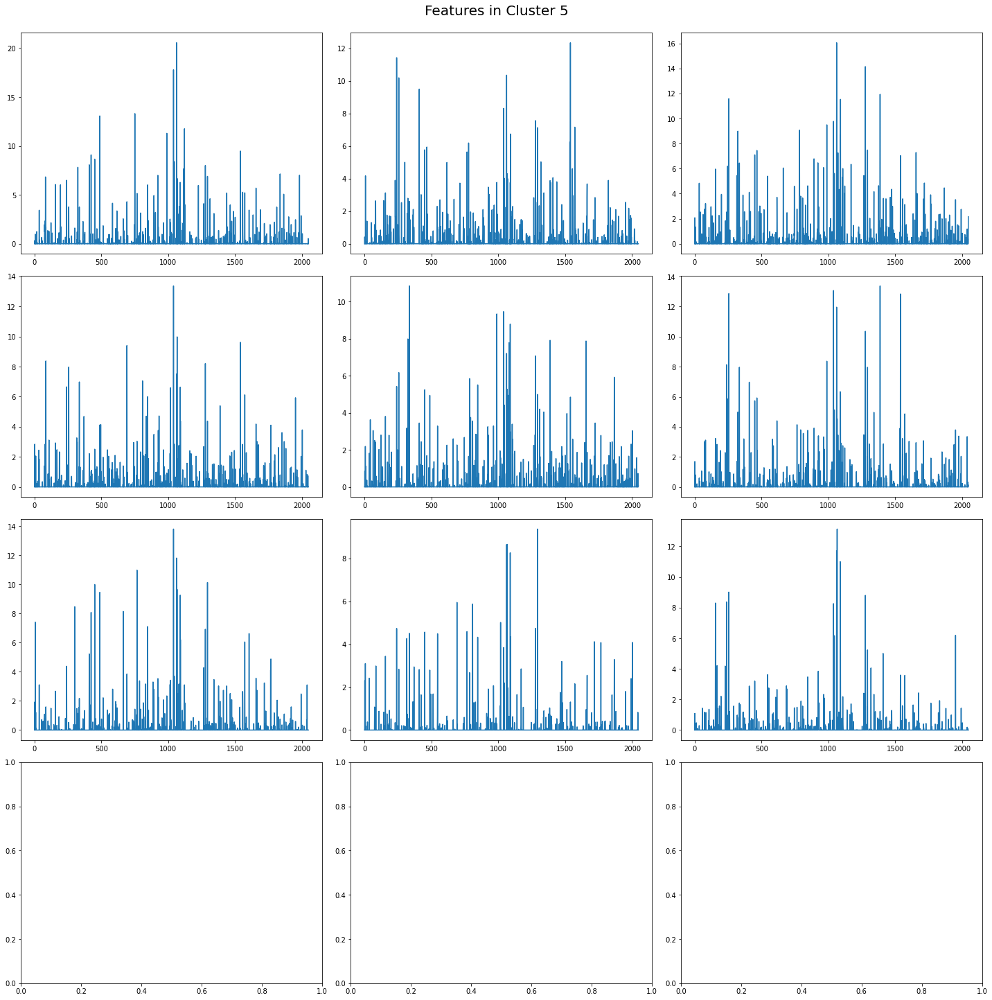

Total number of rivers in cluster 6 :  (25, 2048)


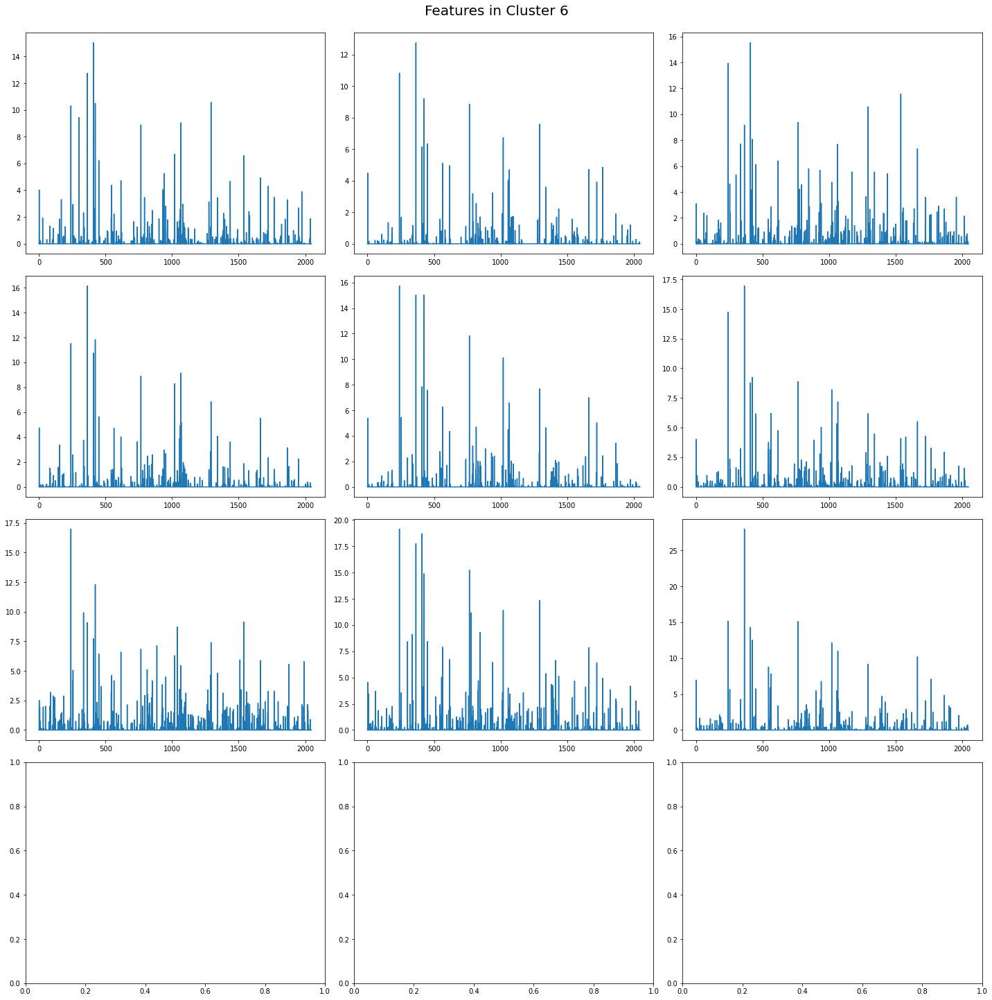

Similarity to centroid  0 :   [0.8352175 0.8824076 0.8299683]
Similarity to centroid  1 :   [0.9025537  0.85319304 0.8342773 ]
Similarity to centroid  2 :   [0.87831527 0.76293206 0.70250285]
Similarity to centroid  3 :   [0.8323654 0.8607783 0.8388414]
Similarity to centroid  4 :   [0.8471148  0.8743235  0.92709744]
Similarity to centroid  5 :   [0.806259   0.7646588  0.83057386]
Similarity to centroid  6 :   [0.932922   0.90792334 0.87769526]
Total features selected for centroid 0 :  (1, 72)
Total features selected for centroid 1 :  (1, 17)
Total features selected for centroid 2 :  (1, 34)
Total features selected for centroid 3 :  (1, 48)
Total features selected for centroid 4 :  (1, 24)
Total features selected for centroid 5 :  (1, 21)
Total features selected for centroid 6 :  (1, 23)


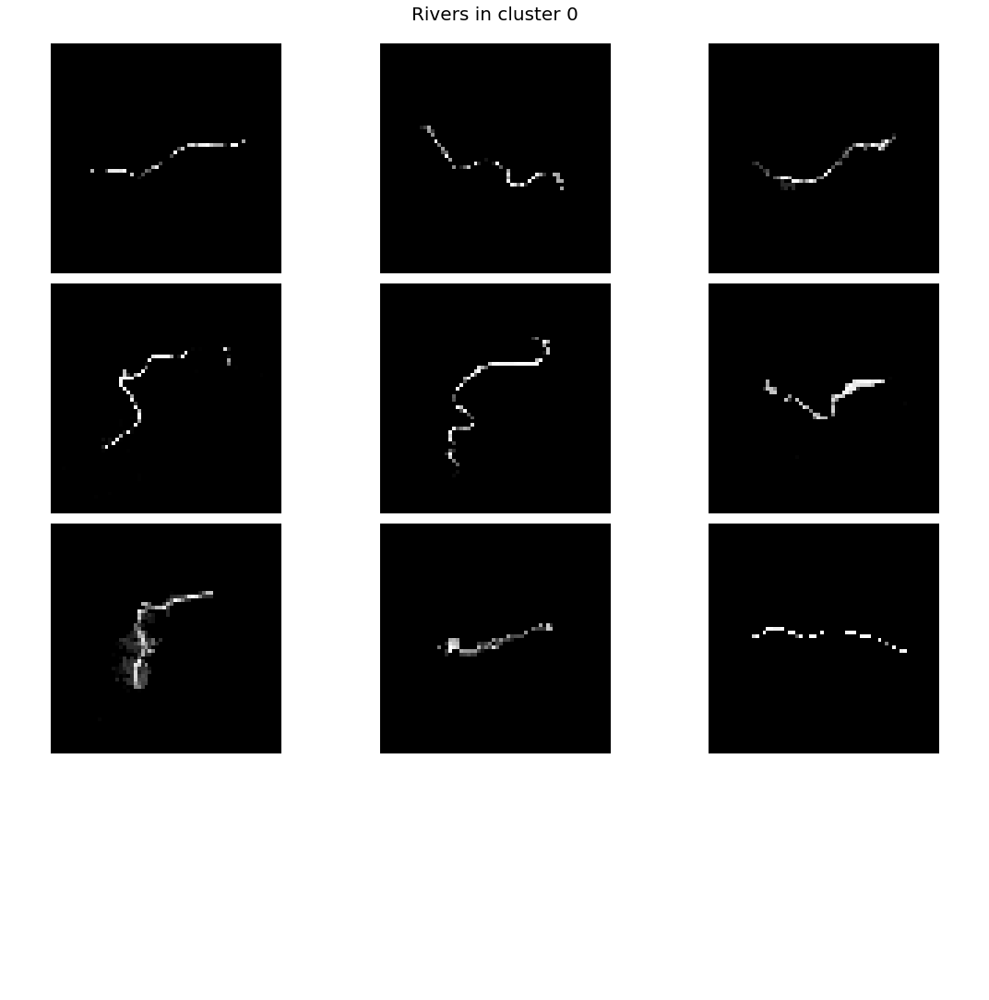

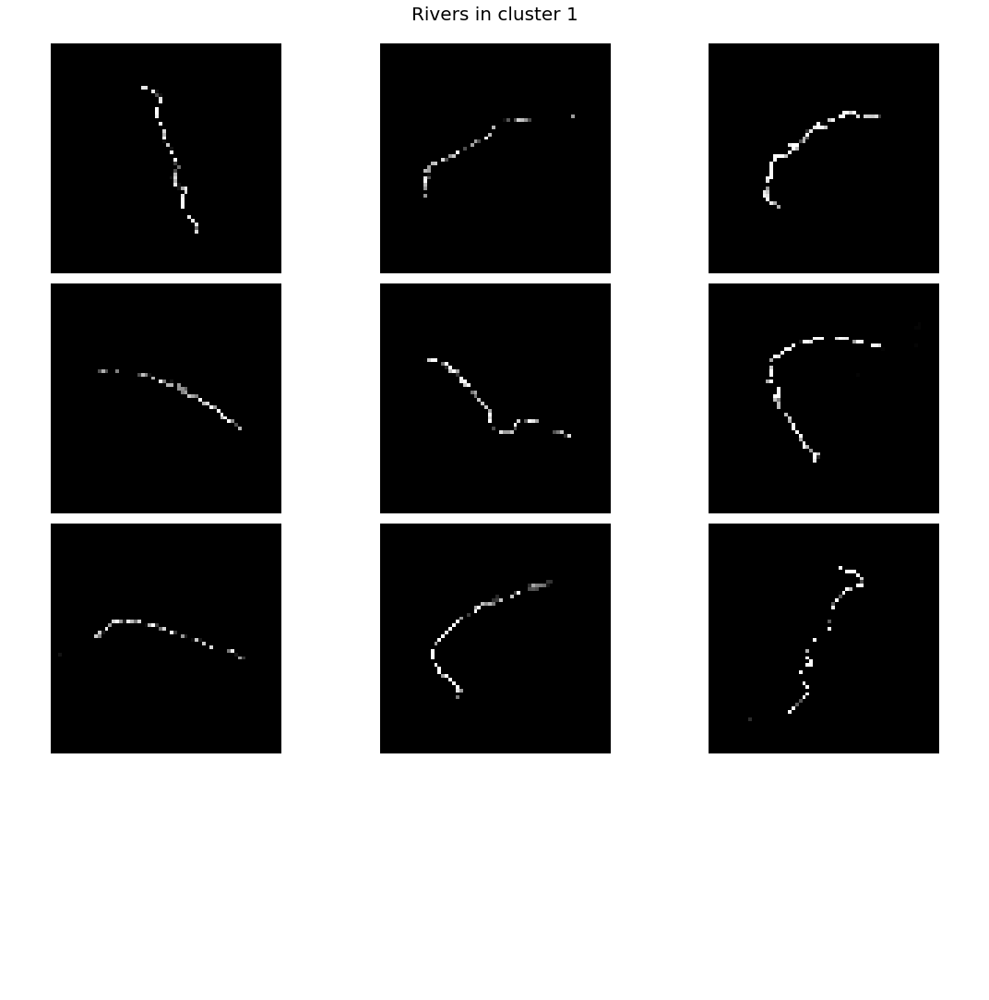

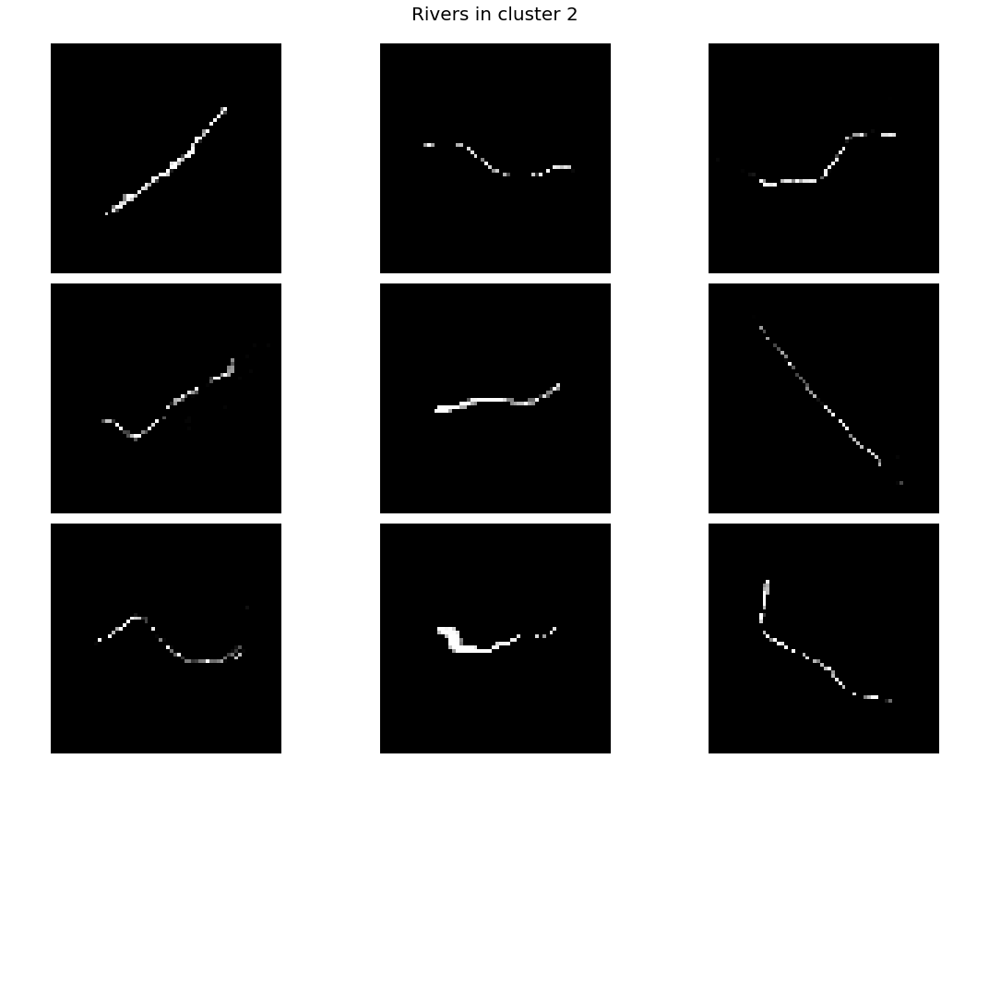

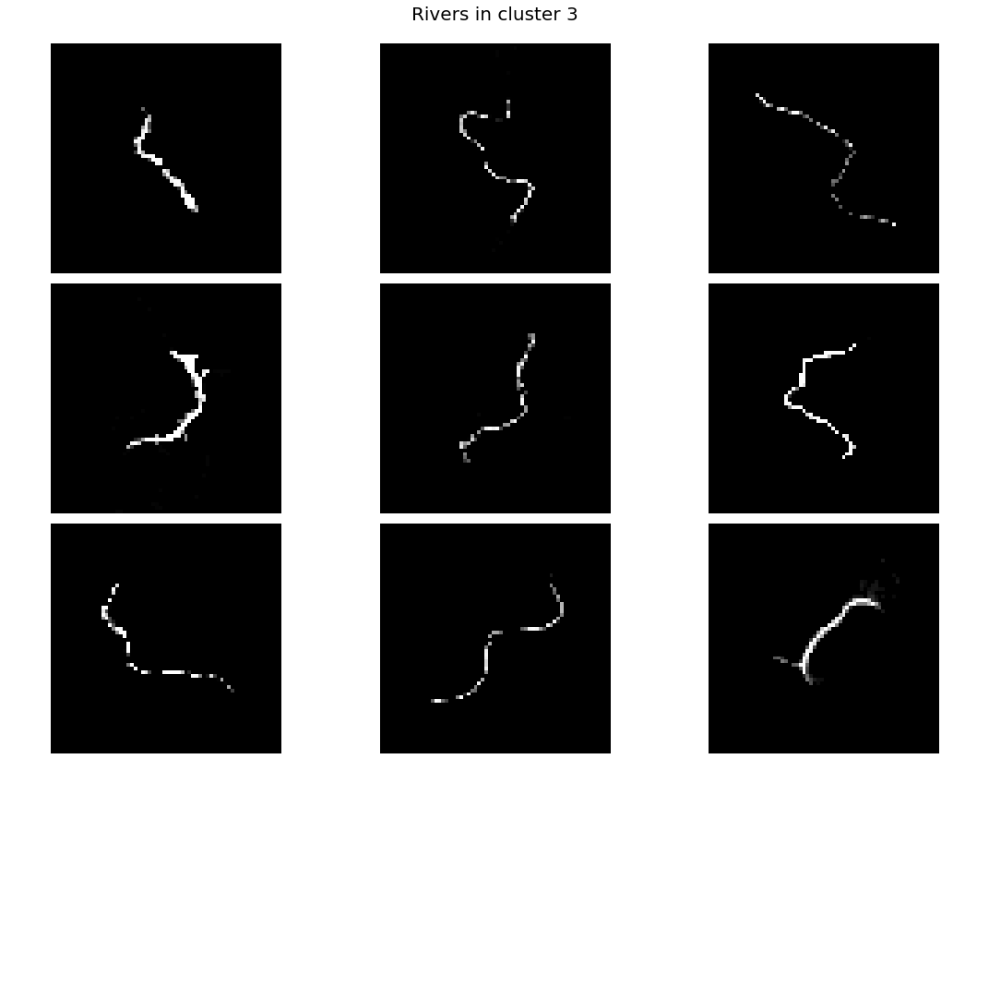

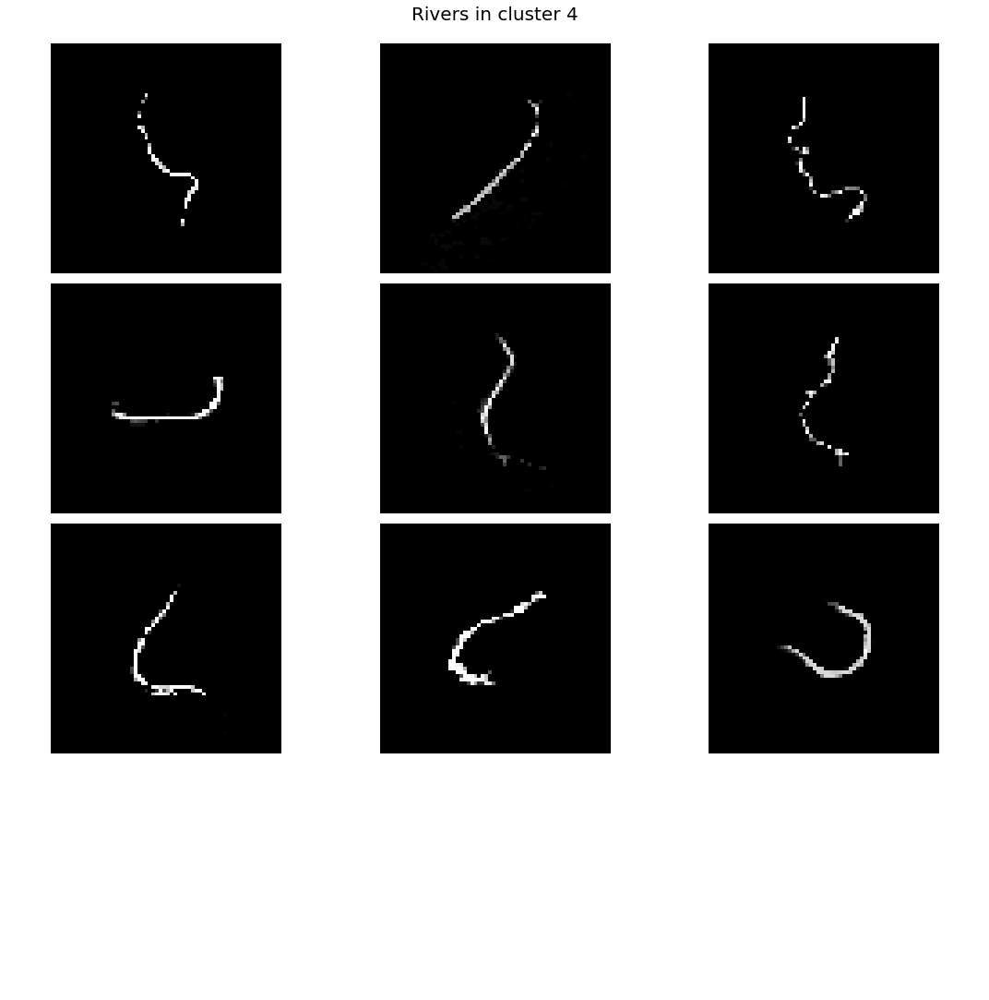

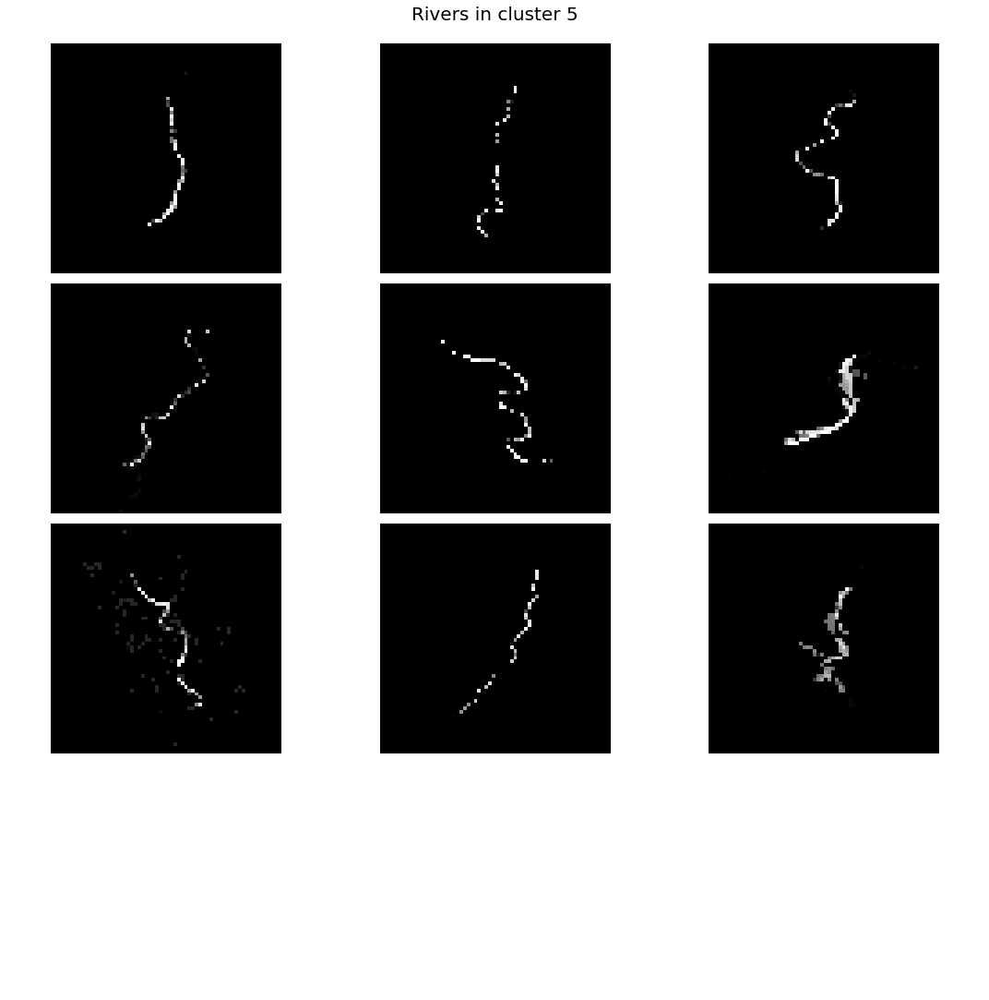

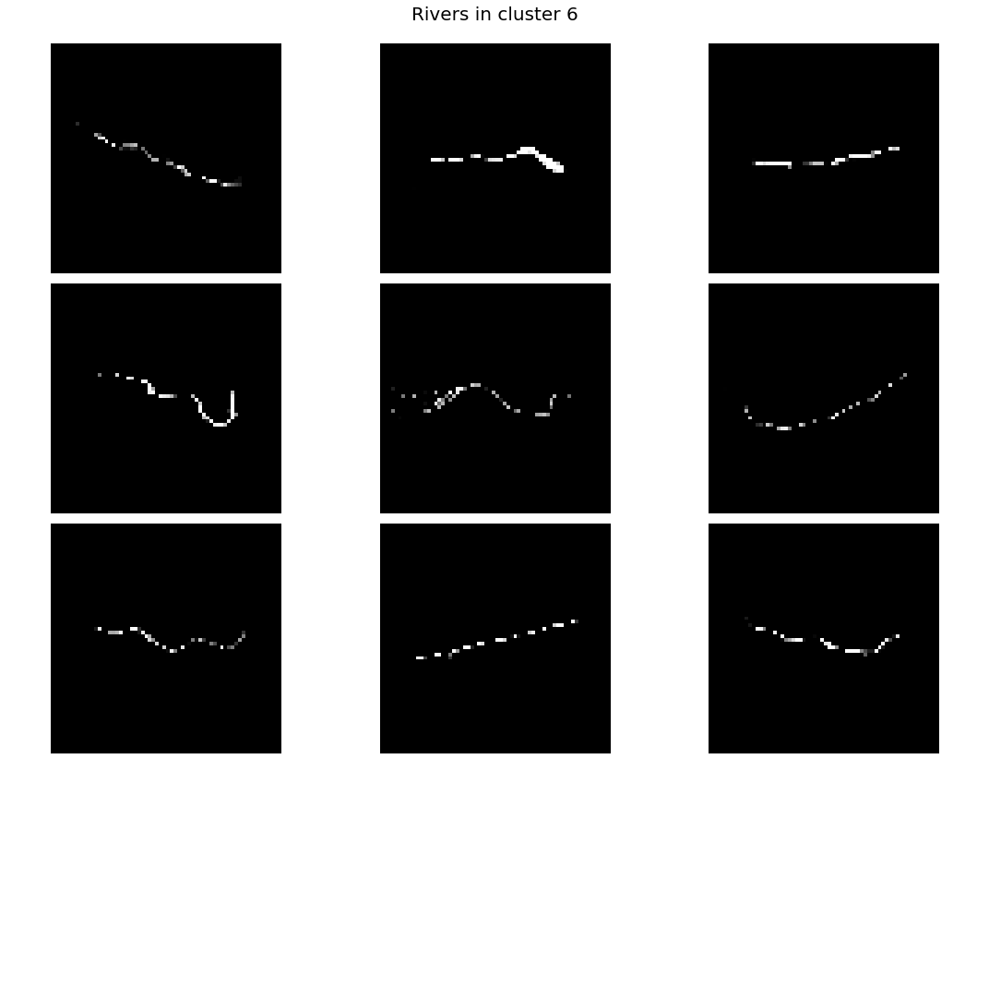

Training images :  (239, 64, 64, 3)
Labels : (239,)
Loss used: categorical_crossentropy, Optimizer used: adam
Epoch 1/5
12/12 [==============================] - 3s 96ms/step - loss: 1.3649 - categorical_crossentropy: 1.3649 - categorical_accuracy: 0.6402
Epoch 2/5
12/12 [==============================] - 1s 96ms/step - loss: 0.5768 - categorical_crossentropy: 0.5768 - categorical_accuracy: 0.8619
Epoch 3/5
12/12 [==============================] - 1s 92ms/step - loss: 0.2903 - categorical_crossentropy: 0.2903 - categorical_accuracy: 0.9205
Epoch 4/5
12/12 [==============================] - 1s 89ms/step - loss: 0.1811 - categorical_crossentropy: 0.1811 - categorical_accuracy: 0.9665
Epoch 5/5
12/12 [==============================] - 1s 89ms/step - loss: 0.1274 - categorical_crossentropy: 0.1274 - categorical_accuracy: 0.9833
Iteration is:  5


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP4_KR_317_UCL_80_7/model/assets


INFO:tensorflow:Assets written to: ../data/UCL_Results_2/EXP4_KR_317_UCL_80_7/model/assets


In [27]:
experiment = 'EXP4_KR_317_UCL_80_7'
threshold = 0.8
clusters = 7
epochs = 5
classes = clusters 
ucl_model = select_model(classes,'softmax')['ucl_model']

tot_iterations = 5
ucl_experiments(ucl_model, plt, clusters, threshold, epochs,tot_iterations)